# Домашнее задание 3

## 0. Введение

Проблемой короновируса COVID-19 буквально сейчас заняты многие ученые по всему миру. В стороне не осталось и комьюнити Data scientist-ов, которые пытаются не просто предсказать развитие пандемии, а помочь определить наиболее значимые факторы, влияющие на распространение заразы. Например на небезызвестном [Kaggle](https://www.kaggle.com/tags/covid19).

В данной домашней работе Вы будете использовать ежедневно обновляемые данные из [репозитория](https://github.com/datasets/covid-19), а конкретно [time-series-19-covid-combined.csv](https://github.com/datasets/covid-19/blob/master/data/time-series-19-covid-combined.csv).

Вам предстоит изучить имеющиеся данные, попробовать найти некоторые закономерности и ответить на вопросы. Ниже представлены задания как исследовательского характера, где приветствуется инициативность, так и чисто тренировочного харатера - где необходимо использовать изученные на семинаре инструменты для работы с временными рядами. **Не забывайте сопровождать ваш код развернутыми комментариями и выводами.** Чем их больше и чем они качественнее, тем лучше и выше вероятность получения максимальной оценки за домашнее задание. Не болейте!

In [0]:
import os
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import statsmodels.api as sma
import statsmodels.formula.api as smfa
import statsmodels.tsa.stattools as smstt
%matplotlib inline

pd.options.display.float_format = '{:.2f}'.format

plt.style.use('ggplot')
plt.rcParams['figure.figsize'] = (15, 15)

In [0]:
url = 'https://raw.githubusercontent.com/datasets/covid-19/master/data/time-series-19-covid-combined.csv'
df = pd.read_csv(url)
df.head()

,Date,Country/Region,Province/State,Lat,Long,Confirmed,Recovered,Deaths
0,2020-01-22,Afghanistan,NaN,33.00,65.00,0.00,0.00,0.00
1,2020-01-23,Afghanistan,NaN,33.00,65.00,0.00,0.00,0.00
2,2020-01-24,Afghanistan,NaN,33.00,65.00,0.00,0.00,0.00
3,2020-01-25,Afghanistan,NaN,33.00,65.00,0.00,0.00,0.00
4,2020-01-26,Afghanistan,NaN,33.00,65.00,0.00,0.00,0.00


## 1. Exploratory data analysis

#### 1.1 Определите границы исследуемого периода, количество заболевших, погибших, выздоровивших. Отобразите на карте распространение болезни.

Границы исследуемого периода

In [0]:
df.Date = pd.to_datetime(df.Date)

In [0]:
print('C %s по %s' %(df.Date.min().date(), df.Date.max().date()))

C 2020-01-22 по 2020-04-30


Количество заболевших

In [0]:
int(df.Confirmed.sum())

73648964

Количество погибших

In [0]:
int(df.Deaths.sum())

4735261

Количество выздоровевших

In [0]:
int(df.Recovered.sum())

19409902

Карта распространения болезни

In [0]:
import plotly.express as px

In [0]:
df = df.sort_values(by = 'Date')
df.Date = df.Date.apply(lambda x: x.date()).apply(str) 
fig = px.choropleth(data_frame = df,
                    locations="Country/Region", 
                    locationmode = "country names",
                    color= "Confirmed",  
                    hover_name= "Country/Region",
                    color_continuous_scale= 'Jet', 
                    animation_frame= "Date")
fig.update_layout(
    title_text = 'Spread of the Coronavirus',
    title_x = 0.5,
    geo=dict(
        showframe = False,
        showcoastlines = False,
    ))
fig.show()

#### 1.2 Определите количество стран, которые подтвердили случаи заражения. Визуализируйте рост количества стран, подтвердивших случаи заражения по дням (или неделям). 

  *Примечание. В анализе временных рядов иногда необходимо изменить частоту дискретизации (Resampling). Такая операция может понадобится, когда имеющихся данных недостаточно или их, наоборот, слишком много. Может не устраивать имеющаяся частота или просто хочется посмотреть на данные с более общего ракурса.*

  *Различают два вида изменения частоты: повышение (Upsampling) и понижение (Downsampling). При повышении временной ряд пересчитывается с низкой частоы на более высокую частоту (например от годовой до месячной частоты). В таком случае процесс включает в себя заполнение или интерполяцию появившихся пропусков в данных. При понижении временной ряд передискретизируется с высокой частоты на низкую (наример с еженедельной на месячную частоту). Это включает в себя агрегацию существующих данных.*

In [0]:
df.Date = pd.to_datetime(df.Date)

In [0]:
dates = list(df.Date.unique())
num_of_countries = list()
for i in dates:
  num_of_countries.append(len(df[(df.Date == i) & (df.Confirmed > 0)]['Country/Region']))

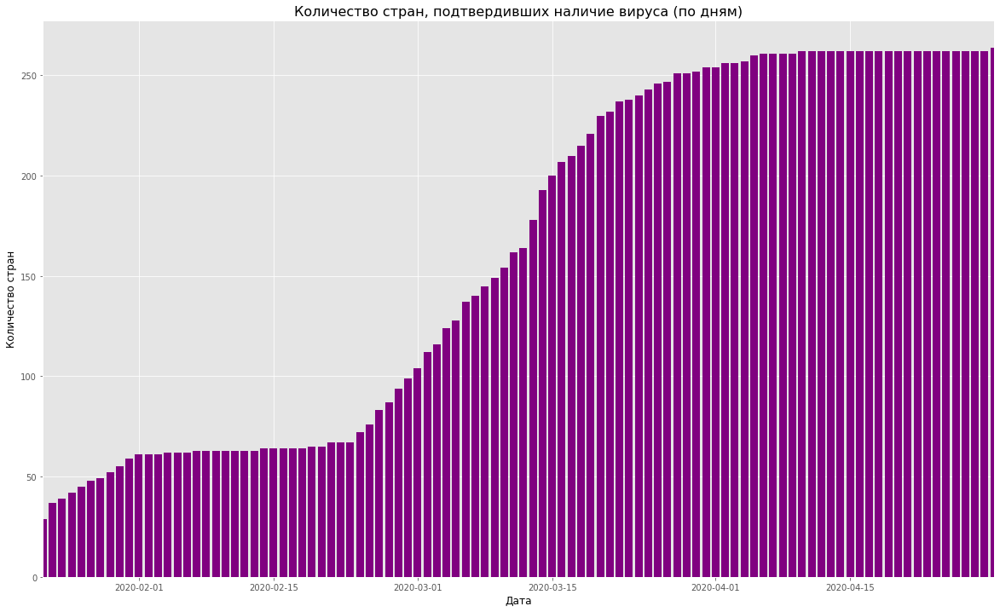

In [0]:
plt.figure(figsize=(20,12));
plt.bar(dates, num_of_countries, color='purple');
plt.title('Количество стран, подтвердивших наличие вируса (по дням)', fontsize = 16);
plt.xlabel('Дата', fontsize=12, color='black');
plt.xlim(min(dates), max(dates));
plt.ylabel('Количество стран', fontsize=12, color='black');

#### 1.3 Визуализируйте мировые тренды по числу заболевших | погибших | выздоровивших. Постройте графики, которые отражают летальность от вируса в разных странах или на разных континентах. 

In [0]:
num_conf = list()
num_dead = list()
num_rec = list()
for i in dates:
  num_conf.append(int(df[df.Date == i]['Confirmed'].sum()))
  num_dead.append(int(df[df.Date == i]['Deaths'].sum()))
  num_rec.append(int(df[df.Date == i]['Recovered'].sum()))

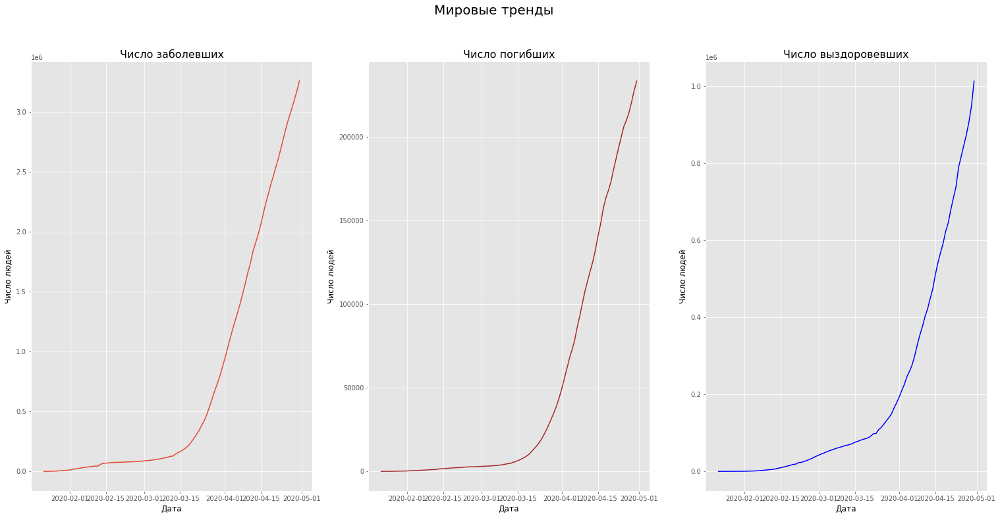

In [0]:
fig = plt.figure(figsize=(26,12))
fig.suptitle('Мировые тренды', fontsize=20);
ax1 = fig.add_subplot(131);
ax1.set_title('Число заболевших', fontsize=16);
ax1.plot(dates, num_conf);
ax1.set_xlabel('Дата', fontsize = 12, color='black');
ax1.set_ylabel('Число людей', fontsize = 12, color='black');
ax2 = fig.add_subplot(132);
ax2.set_title('Число погибших', fontsize=16);
ax2.plot(dates, num_dead, color = 'brown');
ax2.set_xlabel('Дата', fontsize = 12, color='black');
ax2.set_ylabel('Число людей', fontsize = 12, color='black');
ax3 = fig.add_subplot(133);
ax3.set_title('Число выздоровевших', fontsize=16);
ax3.plot(dates, num_rec, color = 'blue');
ax3.set_xlabel('Дата', fontsize = 12, color='black');
ax3.set_ylabel('Число людей', fontsize = 12, color='black');

Летальность по странам

In [0]:
diff_ctr = set(df['Country/Region'])
letal = list()
for i in diff_ctr:
  letal.append(df[df['Country/Region']==i]['Deaths'].sum()/df[df['Country/Region']==i]['Confirmed'].sum() * 100)

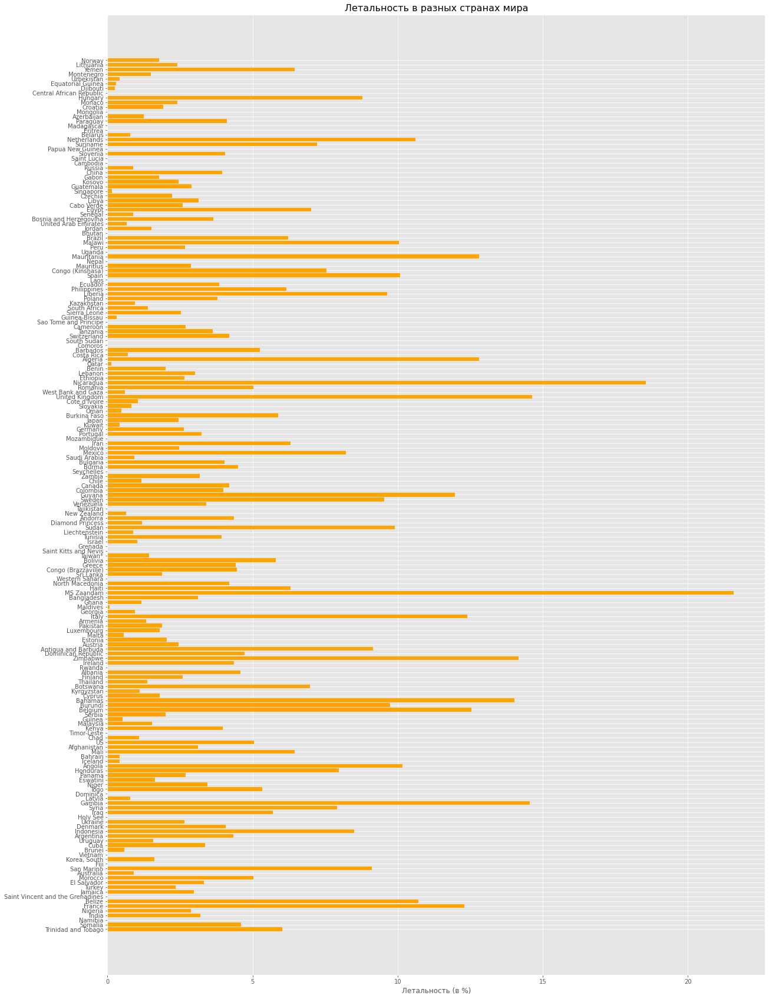

In [0]:
fig, ax = plt.subplots(figsize=(20,30))
y = np.arange(len(diff_ctr))
ax.barh(y, letal, align='center', color='orange')
ax.set_yticks(y)
ax.set_yticklabels(diff_ctr)
ax.invert_yaxis()  # labels read top-to-bottom
ax.set_xlabel('Летальность (в %)')
ax.set_title('Летальность в разных странах мира', fontsize = 16)

plt.show()

In [0]:
df['Letal'] = (df['Deaths']/df['Confirmed'])*100
df.Letal = df.Letal.fillna(0)
df.head(10)

,Date,Country/Region,Province/State,Lat,Long,Confirmed,Recovered,Deaths,Letal
0,2020-01-22,Afghanistan,NaN,33.00,65.00,0.00,0.00,0.00,0.00
4120,2020-01-22,Canada,British Columbia,49.28,-123.12,0.00,nan,0.00,0.00
13596,2020-01-22,Ghana,NaN,7.95,-1.02,0.00,0.00,0.00,0.00
7622,2020-01-22,China,Jiangxi,27.61,115.72,2.00,0.00,0.00,0.00
19776,2020-01-22,Nicaragua,NaN,12.87,-85.21,0.00,0.00,0.00,0.00
19879,2020-01-22,Niger,NaN,17.61,8.08,0.00,0.00,0.00,0.00
25956,2020-01-22,United Kingdom,Falkland Islands (Malvinas),-51.80,-59.52,0.00,0.00,0.00,0.00
13493,2020-01-22,Germany,NaN,51.00,9.00,0.00,0.00,0.00,0.00
13699,2020-01-22,Greece,NaN,39.07,21.82,0.00,0.00,0.00,0.00
26780,2020-01-22,Vietnam,NaN,16.00,108.00,0.00,0.00,0.00,0.00


In [0]:
df.Date = df.Date.apply(lambda x: x.date()).apply(str) 
fig = px.choropleth(data_frame = df,
                    locations="Country/Region", 
                    locationmode = "country names",
                    color= "Letal",  
                    hover_name= "Country/Region",
                    color_continuous_scale= 'Jet', 
                    animation_frame= "Date")
fig.update_layout(
    title_text = 'Летальность от вируса (в %)',
    title_x = 0.5,
    geo=dict(
        showframe = False,
        showcoastlines = False,
    ))
fig.show()

#### 1.4 Визуализируйте и сравните, как распространялась болезнь в разных странах или континентах по дням с первого зарегистрированного случая заболевания. Определите количество дней для каждой страны со дня первого зарегестрированного случая.

Континенты

In [0]:
!pip install pycountry_convert

     |████████████████████████████████| 10.0MB 8.7MB/s 
     |████████████████████████████████| 235kB 46.9MB/s 
  Created wheel for pycountry: filename=pycountry-19.8.18-py2.py3-none-any.whl size=10627361 sha256=8afff293d2310193e677db21a3128aa77bb1c304cdd1b15d61da83555ff57fb3
  Stored in directory: /root/.cache/pip/wheels/a2/98/bf/f0fa1c6bf8cf2cbdb750d583f84be51c2cd8272460b8b36bd3
Successfully built pycountry
ERROR: datascience 0.10.6 has requirement coverage==3.7.1, but you'll have coverage 5.1 which is incompatible.
ERROR: datascience 0.10.6 has requirement folium==0.2.1, but you'll have folium 0.8.3 which is incompatible.
ERROR: coveralls 0.5 has requirement coverage<3.999,>=3.6, but you'll have coverage 5.1 which is incompatible.
  Found existing installation: coverage 3.7.1
    Uninstalling coverage-3.7.1:
      Successfully uninstalled coverage-3.7.1


In [0]:
!pip install country_converter

     |████████████████████████████████| 51kB 1.9MB/s 
  Created wheel for country-converter: filename=country_converter-0.6.7-cp36-none-any.whl size=50216 sha256=c44e943e4beb927829cea67ea8ea59b7bf2db76c918203a0d35eb7b25678dad9
  Stored in directory: /root/.cache/pip/wheels/f9/4a/e7/c8ef69407e41021c414dd56e50bdac424efd1bca3a4346eeb1
Successfully built country-converter


In [0]:
import pycountry_convert as pc
import country_converter as coco
p = list()
for i in df['Country/Region'].unique():
  try:
    i = coco.convert(i, to='name_short')
    if i!='not found':
      p.append(i)
  except:
    print('Not country')

In [0]:
ctr_con = dict()
for i in p:
  if i=='St. Vincent and the Grenadines' or i=="Cote d'Ivoire" or i=='Vatican' or i=='Kosovo' or i=='Congo Republic' or i=='DR Congo':
    if i=='St. Vincent and the Grenadines':
      continent_name = 'NA'
    elif i=="Cote d'Ivoire" or i=='Congo Republic' or i=='DR Congo':
      continent_name = 'AF'
    else:
      continent_name = 'EU'
  else:
    country_code = pc.country_name_to_country_alpha2(i, cn_name_format="default")
    if country_code=='TL':
      continent_name='OC'
    elif country_code=='EH':
      continent_name='AF'
    else:
      continent_name = pc.country_alpha2_to_continent_code(country_code)
  ctr_con.update({i:continent_name})

In [0]:
df_cont = df.copy()
df_cont.drop(index=df_cont[df_cont['Country/Region']=='Diamond Princess'].index, inplace=True)

In [0]:
df_cont.drop(index=df_cont[df_cont['Country/Region']=='MS Zaandam'].index, inplace=True)

In [0]:
j = df_cont['Country/Region'].unique()

In [0]:
new_dict = dict()
n = 0
for k,v in ctr_con.items():
  new_dict.update({j[n]:v})
  n+=1

In [0]:
df_cont['Continent'] = df_cont['Country/Region'].apply(lambda x: new_dict[x])

In [0]:
df_cont.tail()

,Date,Country/Region,Province/State,Lat,Long,Confirmed,Recovered,Deaths,Letal,Continent
17506,2020-04-30,Madagascar,NaN,-18.77,46.87,128.00,92.00,0.00,0.00,AF
17300,2020-04-30,Luxembourg,NaN,49.82,6.13,3784.00,3213.00,90.00,2.38,EU
17197,2020-04-30,Lithuania,NaN,55.17,23.88,1385.00,589.00,45.00,3.25,EU
16991,2020-04-30,Libya,NaN,26.34,17.23,61.00,18.00,3.00,4.92,AF
27394,2020-04-30,Zimbabwe,NaN,-20.00,30.00,40.00,5.00,4.00,10.00,AF


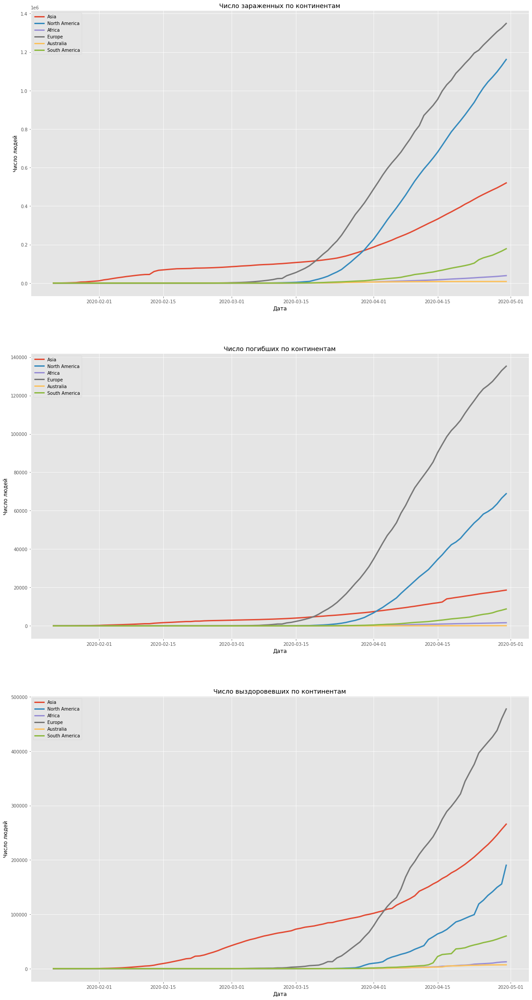

In [0]:
fig = plt.figure(figsize=(20,40))
df_cont.Date = pd.to_datetime(df_cont.Date)
continents = {
    'NA': 'North America',
    'SA': 'South America', 
    'AS': 'Asia',
    'OC': 'Australia',
    'AF': 'Africa',
    'EU': 'Europe'
}
ax1 = fig.add_subplot(311);
ax2 = fig.add_subplot(312);
ax3 = fig.add_subplot(313);
labels = list()
ax1.set_title('Число зараженных по континентам')
ax1.set_xlabel('Дата', color='black')
ax1.set_ylabel('Число людей', color='black')
ax2.set_title('Число погибших по континентам')
ax2.set_xlabel('Дата', color='black')
ax2.set_ylabel('Число людей', color='black')
ax3.set_title('Число выздоровевших по континентам')
ax3.set_xlabel('Дата', color='black')
ax3.set_ylabel('Число людей', color='black')
for i in df_cont.Continent.unique():
  cont_c = list()
  cont_d = list()
  cont_r = list()
  labels.append(continents[i])
  for d in dates:
    cont_c.append(df_cont[(df_cont['Continent']==i) & (df_cont.Date==d)]['Confirmed'].sum())
    cont_d.append(df_cont[(df_cont['Continent']==i) & (df_cont.Date==d)]['Deaths'].sum())
    cont_r.append(df_cont[(df_cont['Continent']==i) & (df_cont.Date==d)]['Recovered'].sum())
  ax1.plot(dates, cont_c, linewidth = 3)
  ax2.plot(dates, cont_d, linewidth = 3)
  ax3.plot(dates, cont_r, linewidth = 3)

ax1.legend(labels);
ax2.legend(labels);
ax3.legend(labels);

Количество дней с первого заражения

In [0]:
df.Date = pd.to_datetime(df.Date)

In [0]:
first = (min(df[(df.Confirmed > 0)]['Date'])).date()

In [0]:
first_app = dict()
for i in diff_ctr:
  first_app.update({i:((min(df[(df.Confirmed > 0)& (df['Country/Region']==i)]['Date'])).date() - first).days})

В словаре в виде значений указано количество дней с момента первого зарегистрированного случая в мире до первого случая в конкретной стране.

In [0]:
first_app

{'Afghanistan': 33,
 'Albania': 47,
 'Algeria': 34,
 'Andorra': 40,
 'Angola': 58,
 'Antigua and Barbuda': 51,
 'Argentina': 41,
 'Armenia': 39,
 'Australia': 4,
 'Austria': 34,
 'Azerbaijan': 39,
 'Bahamas': 54,
 'Bahrain': 33,
 'Bangladesh': 46,
 'Barbados': 55,
 'Belarus': 37,
 'Belgium': 13,
 'Belize': 61,
 'Benin': 54,
 'Bhutan': 44,
 'Bolivia': 49,
 'Bosnia and Herzegovina': 43,
 'Botswana': 68,
 'Brazil': 35,
 'Brunei': 47,
 'Bulgaria': 46,
 'Burkina Faso': 48,
 'Burma': 65,
 'Burundi': 69,
 'Cabo Verde': 58,
 'Cambodia': 5,
 'Cameroon': 44,
 'Canada': 4,
 'Central African Republic': 53,
 'Chad': 57,
 'Chile': 41,
 'China': 0,
 'Colombia': 44,
 'Comoros': 99,
 'Congo (Brazzaville)': 53,
 'Congo (Kinshasa)': 49,
 'Costa Rica': 44,
 "Cote d'Ivoire": 49,
 'Croatia': 34,
 'Cuba': 50,
 'Cyprus': 47,
 'Czechia': 39,
 'Denmark': 36,
 'Diamond Princess': 16,
 'Djibouti': 56,
 'Dominica': 60,
 'Dominican Republic': 39,
 'Ecuador': 39,
 'Egypt': 23,
 'El Salvador': 57,
 'Equatorial Guinea

Сравнение:

По графикам видно, что до 1 марта вирус прогрессировал только в Азии. После этой даты в Европе и Северной Америке начинается стремительный рост числа зараженных/погибших, при этом в Азии люди начали выздоравливать. С первого апреля мы видим небольшой рост числа зараженных в Африке и Южной Америке(до этого количество случаев было близко к нулю). Менее всего подвержена вирусу Австралия.

#### 1.5 Визуализируйте и оцените как развивалась ситуация в России по сравнению с остальными миром.

Начало заболевания в России (сколько дней с первого в мире случая)

In [0]:
first_app['Russia']

9

Россия

In [0]:
rushA_c = list()
rushA_d = list()
rushA_r = list()
world_c = list()
world_d = list()
world_r = list()
for i in dates:
  rushA_c.append(df[(df['Country/Region']=='Russia') & (df.Date==i)]['Confirmed'].sum())
  rushA_d.append(df[(df['Country/Region']=='Russia') & (df.Date==i)]['Deaths'].sum())
  rushA_r.append(df[(df['Country/Region']=='Russia') & (df.Date==i)]['Recovered'].sum())
  world_c.append(df[(df.Date==i)]['Confirmed'].mean())
  world_d.append(df[(df.Date==i)]['Deaths'].mean())
  world_r.append(df[(df.Date==i)]['Recovered'].mean())

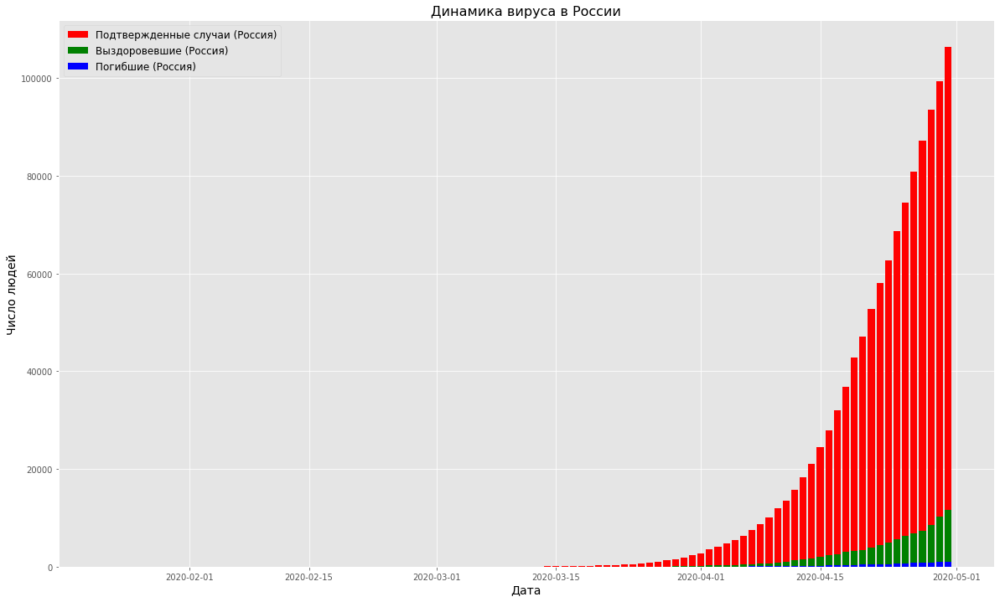

In [0]:
fig = plt.figure(figsize=(20,12))
plt.bar(dates, rushA_c, color='r')
plt.bar(dates, rushA_r, color='g')
plt.bar(dates, rushA_d, color='b')
plt.legend(['Подтвержденные случаи (Россия)','Выздоровевшие (Россия)','Погибшие (Россия)'], fontsize=12)
plt.title('Динамика вируса в России', fontsize=16)
plt.xlabel('Дата', fontsize=14, color='black')
plt.ylabel('Число людей', fontsize=14, color='black')
plt.show()

Остальной мир

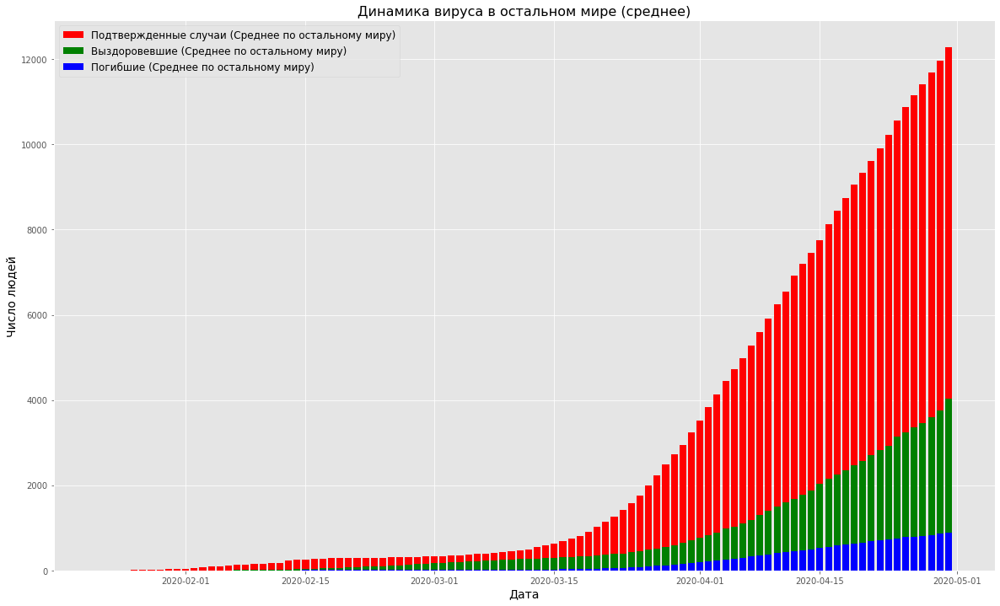

In [0]:
fig = plt.figure(figsize=(20,12))
plt.bar(dates, world_c, color='r')
plt.bar(dates, world_r, color='g')
plt.bar(dates, world_d, color='b')
plt.legend(['Подтвержденные случаи (Среднее по остальному миру)', 'Выздоровевшие (Среднее по остальному миру)','Погибшие (Среднее по остальному миру)'], fontsize=12)
plt.title('Динамика вируса в остальном мире (среднее)', fontsize=16)
plt.xlabel('Дата', fontsize=14, color='black')
plt.ylabel('Число людей', fontsize=14, color='black')
plt.show()

Общий график

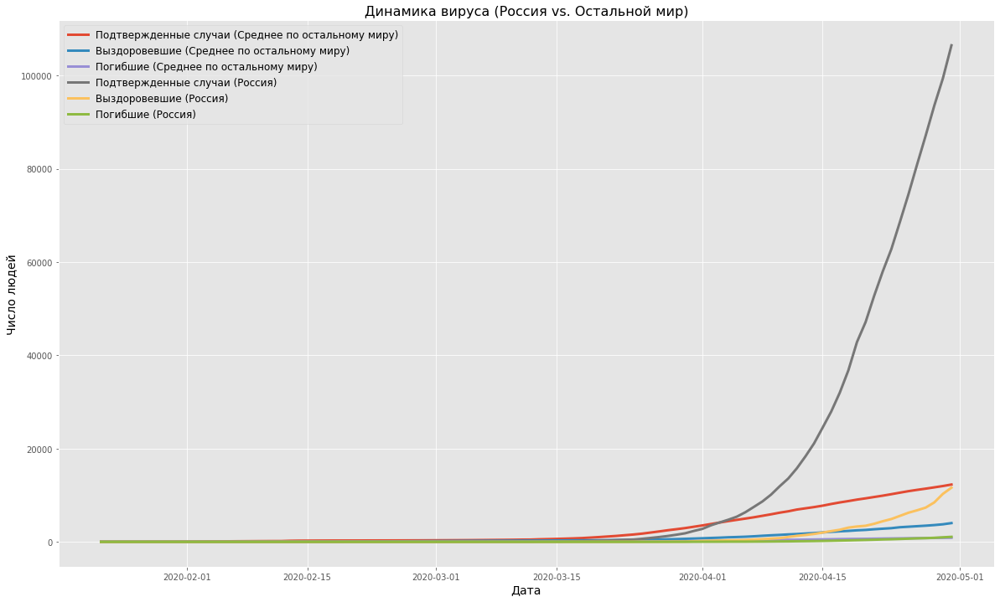

In [0]:
fig = plt.figure(figsize=(20,12))
plt.plot(dates, world_c, linewidth=3)
plt.plot(dates, world_r, linewidth=3)
plt.plot(dates, world_d, linewidth=3)
plt.plot(dates, rushA_c, linewidth=3)
plt.plot(dates, rushA_r, linewidth=3)
plt.plot(dates, rushA_d, linewidth=3)
plt.legend(['Подтвержденные случаи (Среднее по остальному миру)', 'Выздоровевшие (Среднее по остальному миру)','Погибшие (Среднее по остальному миру)',
            'Подтвержденные случаи (Россия)','Выздоровевшие (Россия)','Погибшие (Россия)'], fontsize=12)
plt.title('Динамика вируса (Россия vs. Остальной мир)', fontsize=16)
plt.xlabel('Дата', fontsize=14, color='black')
plt.ylabel('Число людей', fontsize=14, color='black')
plt.show()

Сравнение:

По графику в России до 15 марта количество подтвержденных случаев было близко к нулю. После этой даты в России начинается стремительный рост числа зараженных (в несколько раз больше, чем в среднем по миру). При этом стоит отметить, что число погибших невелико, учитывая количество зараженных. Число выздоровевших в России также больше, чем в среднем по миру.

#### 1.6 Определите топ-10 стран, которые лидируют по имеющимся в датасете показателям. Сравните насколько быстро развивается ситуация в этих странах, определите корреляцию.

In [0]:
stat_ctr = dict()
for i in diff_ctr:
  stat_ctr.update({i:df[df['Country/Region']==i]['Confirmed'].sum()+df[df['Country/Region']==i]['Deaths'].sum()+df[df['Country/Region']==i]['Recovered'].sum()})

In [0]:
sorted_stat = sorted(stat_ctr.items(), key=lambda x: x[1], reverse=True)[:10]

Топ-10 стран

In [0]:
top10 = list()
for i in sorted_stat:
  top10.append(i[0])

In [0]:
top10

['US',
 'China',
 'Spain',
 'Italy',
 'Germany',
 'France',
 'Iran',
 'United Kingdom',
 'Turkey',
 'Brazil']

In [0]:
df_corr = pd.DataFrame()

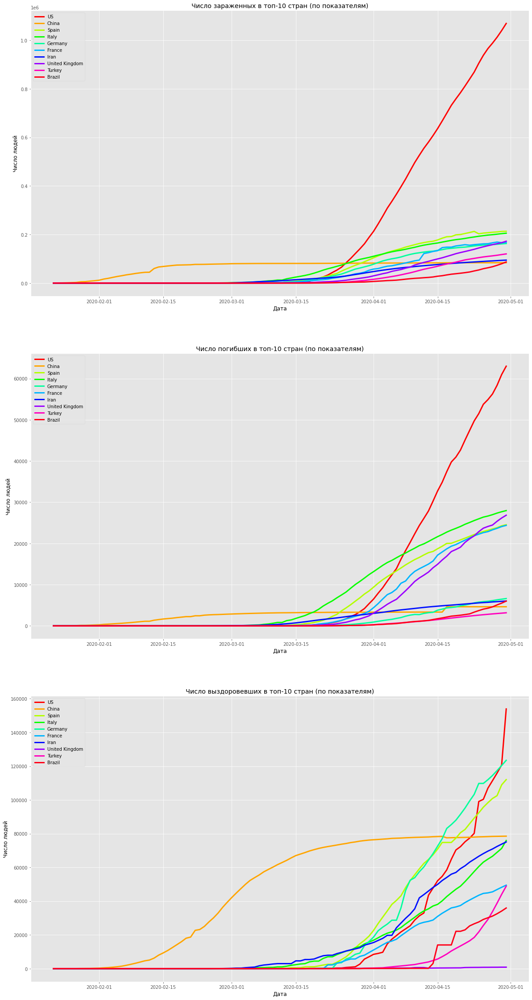

In [0]:
fig = plt.figure(figsize=(20,40))
ax1 = fig.add_subplot(311);
ax2 = fig.add_subplot(312);
ax3 = fig.add_subplot(313);
cmap = plt.get_cmap('hsv')
colors = [cmap(i) for i in np.linspace(0, 1, 10)]
labels = list()
ax1.set_title('Число зараженных в топ-10 стран (по показателям)')
ax1.set_xlabel('Дата', color='black')
ax1.set_ylabel('Число людей', color='black')
ax2.set_title('Число погибших в топ-10 стран (по показателям)')
ax2.set_xlabel('Дата', color='black')
ax2.set_ylabel('Число людей', color='black')
ax3.set_title('Число выздоровевших в топ-10 стран (по показателям)')
ax3.set_xlabel('Дата', color='black')
ax3.set_ylabel('Число людей', color='black')
n = 0
for i in top10:
  l1 = list()
  l2 = list()
  l3 = list()
  labels.append(i)
  for d in dates:
    l1.append(df[(df['Country/Region']==i) & (df.Date==d)]['Confirmed'].sum())
    l2.append(df[(df['Country/Region']==i) & (df.Date==d)]['Deaths'].sum())
    l3.append(df[(df['Country/Region']==i) & (df.Date==d)]['Recovered'].sum())
  df_corr[str(i)+'_confirmed'] = l1
  df_corr[str(i)+'_deaths'] = l2
  df_corr[str(i)+'_recovered'] = l3
  ax1.plot(dates, l1, linewidth = 3, color=colors[n])
  ax2.plot(dates, l2, linewidth = 3, color=colors[n])
  ax3.plot(dates, l3, linewidth = 3, color=colors[n])
  n+=1
ax1.legend(labels);
ax2.legend(labels);
ax3.legend(labels);

Сравнение (01.05.20): 

До 15 марта Китай лидировал по количеству зараженных и погибших, при этом далее эти показатели шли на спад (а число выздоровевших росло). После 15 марта во всех выбранных странах начинается стремительный рост числа зараженных (при этом примерно с 7 апреля США становится абсолютным лидером по количеству зараженных, погибших). Также до 15 арпеля Китай был лидером по количеству выздоровевших. После 15 апреля лидером по числу выздоровевших становится Германия. Только к концу апреля страна с самым большим количеством зараженных (США) выходит на первое место по количеству выздоровевших, при этом ситуация с погибшими в этой стране усугублялась с каждым днем, начиная примерно с 25 марта (к концу периода более миллиона человек). Также стоит обратить внимание на Бразилию с самым маленьким показателем зараженных среди топ-10 стран, но с количеством погибших равным примерно этому же показателю Германии). Стоит отметить, что в Великобритании число выздоровевших практически не меняется за весь взятый период. 

Корреляция (df_corr заполнялась в предыдущей ячейке)

In [0]:
df_corr.tail()

,US_confirmed,US_deaths,US_recovered,China_confirmed,China_deaths,China_recovered,Spain_confirmed,Spain_deaths,Spain_recovered,Italy_confirmed,Italy_deaths,Italy_recovered,Germany_confirmed,Germany_deaths,Germany_recovered,France_confirmed,France_deaths,France_recovered,Iran_confirmed,Iran_deaths,Iran_recovered,United Kingdom_confirmed,United Kingdom_deaths,United Kingdom_recovered,Turkey_confirmed,Turkey_deaths,Turkey_recovered,Brazil_confirmed,Brazil_deaths,Brazil_recovered
95,965785.00,54881.00,106988.00,83912.00,4637.00,78277.00,207634.00,23190.00,98372.00,197675.00,26644.00,64928.00,157770.00,5976.00,112000.00,162220.00,22859.00,44903.00,90481.00,5710.00,69657.00,154037.00,24117.00,778.00,110130.00,2805.00,29140.00,63100.00,4286.00,30152.00
96,988197.00,56259.00,111424.00,83918.00,4637.00,78374.00,209465.00,23521.00,100875.00,199414.00,26977.00,66624.00,158758.00,6126.00,114500.00,165963.00,23296.00,45513.00,91472.00,5806.00,70933.00,158348.00,24458.00,807.00,112261.00,2900.00,33791.00,67446.00,4603.00,31142.00
97,1012582.00,58355.00,115936.00,83940.00,4637.00,78422.00,210773.00,23822.00,102548.00,201505.00,27359.00,68941.00,159912.00,6314.00,117400.00,169053.00,23663.00,46886.00,92584.00,5877.00,72439.00,162350.00,25369.00,813.00,114653.00,2992.00,38809.00,73235.00,5083.00,32544.00
98,1039909.00,60967.00,120720.00,83944.00,4637.00,78474.00,212917.00,24275.00,108947.00,203591.00,27682.00,71252.00,161539.00,6467.00,120400.00,166543.00,24090.00,48228.00,93657.00,5957.00,73791.00,166441.00,26166.00,857.00,117589.00,3081.00,44040.00,79685.00,5513.00,34132.00
99,1069424.00,62996.00,153947.00,83956.00,4637.00,78523.00,213435.00,24543.00,112050.00,205463.00,27967.00,75945.00,163009.00,6623.00,123500.00,167299.00,24379.00,49476.00,94640.00,6028.00,75103.00,172481.00,26842.00,859.00,120204.00,3174.00,48886.00,87187.00,6006.00,35935.00


In [0]:
corr = df_corr.corr()
corr.style.background_gradient(cmap='RdBu_r')

,US_confirmed,US_deaths,US_recovered,China_confirmed,China_deaths,China_recovered,Spain_confirmed,Spain_deaths,Spain_recovered,Italy_confirmed,Italy_deaths,Italy_recovered,Germany_confirmed,Germany_deaths,Germany_recovered,France_confirmed,France_deaths,France_recovered,Iran_confirmed,Iran_deaths,Iran_recovered,United Kingdom_confirmed,United Kingdom_deaths,United Kingdom_recovered,Turkey_confirmed,Turkey_deaths,Turkey_recovered,Brazil_confirmed,Brazil_deaths,Brazil_recovered
US_confirmed,1.000000,0.992555,0.964425,0.391097,0.679175,0.611070,0.966205,0.983516,0.998934,0.944180,0.966622,0.995479,0.964453,0.996751,0.997139,0.989105,0.997621,0.999315,0.955668,0.949740,0.996035,0.999236,0.995156,0.971019,0.995302,0.987654,0.849844,0.966189,0.946547,0.889293
US_deaths,0.992555,1.000000,0.985156,0.357183,0.655599,0.557097,0.928830,0.954498,0.988194,0.902592,0.930979,0.989064,0.926052,0.998596,0.997492,0.968857,0.988538,0.988881,0.917060,0.910421,0.988519,0.996206,0.999426,0.961799,0.998902,0.999089,0.892031,0.984040,0.972742,0.931928
US_recovered,0.964425,0.985156,1.000000,0.323912,0.623811,0.504383,0.871659,0.905594,0.956626,0.848153,0.879880,0.969200,0.869821,0.976790,0.973070,0.923408,0.952078,0.956012,0.863045,0.857643,0.956712,0.971787,0.979535,0.937153,0.977220,0.989392,0.949608,0.996587,0.994972,0.960391
China_confirmed,0.391097,0.357183,0.323912,1.000000,0.904395,0.815816,0.456184,0.432277,0.393242,0.502599,0.471721,0.411732,0.460162,0.369569,0.370313,0.427752,0.389083,0.395110,0.502263,0.501169,0.417876,0.384610,0.363324,0.413336,0.364186,0.348212,0.249839,0.335979,0.310671,0.265804
China_deaths,0.679175,0.655599,0.623811,0.904395,1.000000,0.922132,0.714016,0.698585,0.674579,0.753923,0.732345,0.702729,0.715377,0.665401,0.663688,0.705329,0.674219,0.680863,0.756580,0.754993,0.705816,0.676636,0.659421,0.687674,0.660827,0.649801,0.533478,0.634728,0.610096,0.576880
China_recovered,0.611070,0.557097,0.504383,0.815816,0.922132,1.000000,0.712719,0.676611,0.614986,0.776514,0.733920,0.639902,0.718619,0.576847,0.578248,0.666699,0.607984,0.617711,0.771307,0.773585,0.646626,0.600121,0.566957,0.635256,0.568392,0.542836,0.387344,0.523224,0.483332,0.410862
Spain_confirmed,0.966205,0.928830,0.871659,0.456184,0.714016,0.712719,1.000000,0.996259,0.970798,0.991407,0.997839,0.961810,0.999600,0.944829,0.948021,0.987234,0.968303,0.972339,0.994421,0.991825,0.966733,0.957063,0.937953,0.940751,0.940191,0.915833,0.713857,0.879197,0.842722,0.764177
Spain_deaths,0.983516,0.954498,0.905594,0.432277,0.698585,0.676611,0.996259,1.000000,0.987260,0.980997,0.993745,0.977249,0.995597,0.967177,0.969896,0.994007,0.984623,0.987739,0.987568,0.982994,0.981061,0.976437,0.961906,0.955405,0.963375,0.943486,0.758593,0.910977,0.879304,0.803018
Spain_recovered,0.998934,0.988194,0.956626,0.393242,0.674579,0.614986,0.970798,0.987260,1.000000,0.947642,0.969749,0.992217,0.969420,0.993604,0.994810,0.990445,0.997980,0.998986,0.959865,0.953043,0.994650,0.997034,0.991783,0.968947,0.991835,0.981728,0.835501,0.958351,0.936853,0.872001
Italy_confirmed,0.944180,0.902592,0.848153,0.502599,0.753923,0.776514,0.991407,0.980997,0.947642,1.000000,0.996361,0.949920,0.992961,0.919144,0.921559,0.971638,0.942716,0.949995,0.997551,0.999656,0.951487,0.934661,0.911475,0.930789,0.913327,0.889665,0.699562,0.859731,0.821856,0.740621


In [0]:
corr_conf = df_corr[df_corr.columns[np.where(df_corr.columns.str.contains('confirmed') == True)]].corr()
corr_conf.style.background_gradient(cmap='BrBG')

,US_confirmed,China_confirmed,Spain_confirmed,Italy_confirmed,Germany_confirmed,France_confirmed,Iran_confirmed,United Kingdom_confirmed,Turkey_confirmed,Brazil_confirmed
US_confirmed,1.000000,0.391097,0.966205,0.944180,0.964453,0.989105,0.955668,0.999236,0.995302,0.966189
China_confirmed,0.391097,1.000000,0.456184,0.502599,0.460162,0.427752,0.502263,0.384610,0.364186,0.335979
Spain_confirmed,0.966205,0.456184,1.000000,0.991407,0.999600,0.987234,0.994421,0.957063,0.940191,0.879197
Italy_confirmed,0.944180,0.502599,0.991407,1.000000,0.992961,0.971638,0.997551,0.934661,0.913327,0.859731
Germany_confirmed,0.964453,0.460162,0.999600,0.992961,1.000000,0.985373,0.995430,0.954984,0.937101,0.877977
France_confirmed,0.989105,0.427752,0.987234,0.971638,0.985373,1.000000,0.979157,0.985489,0.977355,0.924761
Iran_confirmed,0.955668,0.502263,0.994421,0.997551,0.995430,0.979157,1.000000,0.946718,0.927453,0.872476
United Kingdom_confirmed,0.999236,0.384610,0.957063,0.934661,0.954984,0.985489,0.946718,1.000000,0.998021,0.972504
Turkey_confirmed,0.995302,0.364186,0.940191,0.913327,0.937101,0.977355,0.927453,0.998021,1.000000,0.975395
Brazil_confirmed,0.966189,0.335979,0.879197,0.859731,0.877977,0.924761,0.872476,0.972504,0.975395,1.000000


In [0]:
corr_deaths = df_corr[df_corr.columns[np.where(df_corr.columns.str.contains('deaths') == True)]].corr()
corr_deaths.style.background_gradient(cmap='BrBG')

,US_deaths,China_deaths,Spain_deaths,Italy_deaths,Germany_deaths,France_deaths,Iran_deaths,United Kingdom_deaths,Turkey_deaths,Brazil_deaths
US_deaths,1.000000,0.655599,0.954498,0.930979,0.998596,0.988538,0.910421,0.999426,0.999089,0.972742
China_deaths,0.655599,1.000000,0.698585,0.732345,0.665401,0.674219,0.754993,0.659421,0.649801,0.610096
Spain_deaths,0.954498,0.698585,1.000000,0.993745,0.967177,0.984623,0.982994,0.961906,0.943486,0.879304
Italy_deaths,0.930979,0.732345,0.993745,1.000000,0.945634,0.965671,0.997031,0.938956,0.919223,0.854074
Germany_deaths,0.998596,0.665401,0.967177,0.945634,1.000000,0.994304,0.926126,0.999428,0.996054,0.961711
France_deaths,0.988538,0.674219,0.984623,0.965671,0.994304,1.000000,0.948408,0.992784,0.981893,0.929953
Iran_deaths,0.910421,0.754993,0.982994,0.997031,0.926126,0.948408,1.000000,0.918932,0.897889,0.831869
United Kingdom_deaths,0.999426,0.659421,0.961906,0.938956,0.999428,0.992784,0.918932,1.000000,0.997284,0.964852
Turkey_deaths,0.999089,0.649801,0.943486,0.919223,0.996054,0.981893,0.897889,0.997284,1.000000,0.979547
Brazil_deaths,0.972742,0.610096,0.879304,0.854074,0.961711,0.929953,0.831869,0.964852,0.979547,1.000000


In [0]:
corr_rec = df_corr[df_corr.columns[np.where(df_corr.columns.str.contains('recovered') == True)]].corr()
corr_rec.style.background_gradient(cmap='BrBG')

,US_recovered,China_recovered,Spain_recovered,Italy_recovered,Germany_recovered,France_recovered,Iran_recovered,United Kingdom_recovered,Turkey_recovered,Brazil_recovered
US_recovered,1.000000,0.504383,0.956626,0.969200,0.973070,0.956012,0.956712,0.937153,0.949608,0.960391
China_recovered,0.504383,1.000000,0.614986,0.639902,0.578248,0.617711,0.646626,0.635256,0.387344,0.410862
Spain_recovered,0.956626,0.614986,1.000000,0.992217,0.994810,0.998986,0.994650,0.968947,0.835501,0.872001
Italy_recovered,0.969200,0.639902,0.992217,1.000000,0.991016,0.993582,0.993655,0.977519,0.872134,0.900360
Germany_recovered,0.973070,0.578248,0.994810,0.991016,1.000000,0.995591,0.993818,0.964869,0.862988,0.908770
France_recovered,0.956012,0.617711,0.998986,0.993582,0.995591,1.000000,0.995689,0.970543,0.833669,0.877481
Iran_recovered,0.956712,0.646626,0.994650,0.993655,0.993818,0.995689,1.000000,0.968444,0.835443,0.883324
United Kingdom_recovered,0.937153,0.635256,0.968947,0.977519,0.964869,0.970543,0.968444,1.000000,0.851420,0.858943
Turkey_recovered,0.949608,0.387344,0.835501,0.872134,0.862988,0.833669,0.835443,0.851420,1.000000,0.947176
Brazil_recovered,0.960391,0.410862,0.872001,0.900360,0.908770,0.877481,0.883324,0.858943,0.947176,1.000000


Заметим, что выделяется только Китай, числовые характеристики в других странах из топ-10 сильно коррелируют. Скорее всего это происходит в связи с тем, что вирус обнаружили в Китае, соответственно к приходу вируса в другие страны, в Китае вирус шел на спад.

1.7 Для первых 5 стран из топ-10 и России постойте сравнительные графики. Изучите как изменялись значения отношений погибших/выздоровивших, погибших/заболевших, заболевших/общее число жителей, ваш вариант...

In [0]:
top5_Rus = top10[:5]+['Russia']

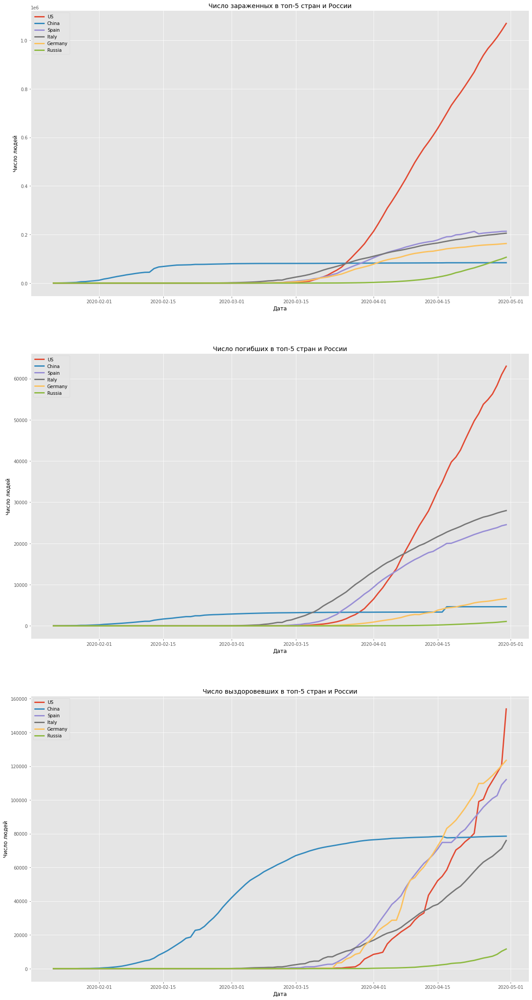

In [0]:
fig = plt.figure(figsize=(20,40))
ax1 = fig.add_subplot(311);
ax2 = fig.add_subplot(312);
ax3 = fig.add_subplot(313);
labels = list()
ax1.set_title('Число зараженных в топ-5 стран и России')
ax1.set_xlabel('Дата', color='black')
ax1.set_ylabel('Число людей', color='black')
ax2.set_title('Число погибших в топ-5 стран и России')
ax2.set_xlabel('Дата', color='black')
ax2.set_ylabel('Число людей', color='black')
ax3.set_title('Число выздоровевших в топ-5 стран и России')
ax3.set_xlabel('Дата', color='black')
ax3.set_ylabel('Число людей', color='black')
for i in top5_Rus:
  l1 = list()
  l2 = list()
  l3 = list()
  labels.append(i)
  for d in dates:
    l1.append(df[(df['Country/Region']==i) & (df.Date==d)]['Confirmed'].sum())
    l2.append(df[(df['Country/Region']==i) & (df.Date==d)]['Deaths'].sum())
    l3.append(df[(df['Country/Region']==i) & (df.Date==d)]['Recovered'].sum())

  ax1.plot(dates, l1, linewidth = 3)
  ax2.plot(dates, l2, linewidth = 3)
  ax3.plot(dates, l3, linewidth = 3)

ax1.legend(labels);
ax2.legend(labels);
ax3.legend(labels);

Отношения

Общее число жителей для стран было взято отсюда ->
http://ostranah.ru/_lists/population.php

In [0]:
pop_ctr = [310241000, 1339450000, 46073000, 60402000, 81802000, 143300000]

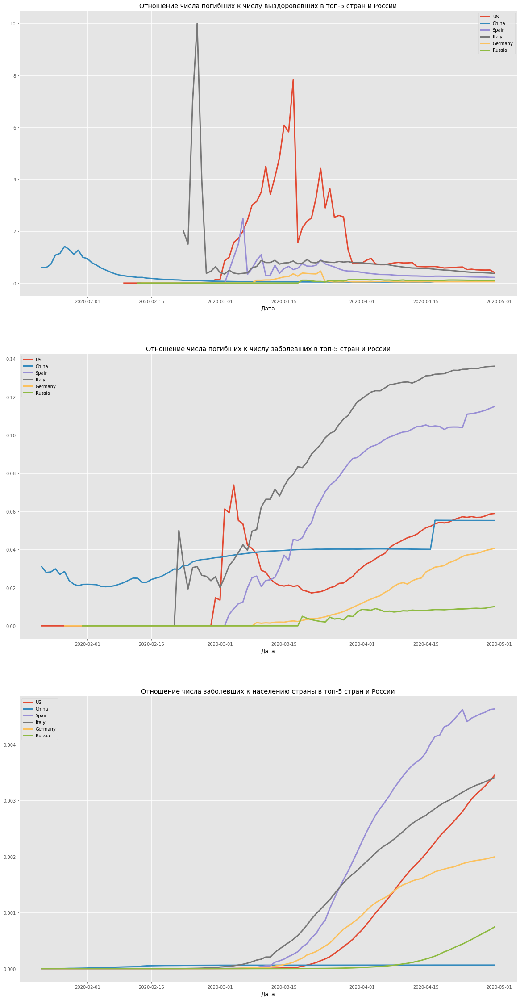

In [0]:
#погибших/выздоровивших, погибших/заболевших, заболевших/общее число жителей
fig = plt.figure(figsize=(20,40))
ax1 = fig.add_subplot(311);
ax2 = fig.add_subplot(312);
ax3 = fig.add_subplot(313);
labels = list()
ax1.set_title('Отношение числа погибших к числу выздоровевших в топ-5 стран и России')
ax1.set_xlabel('Дата', color='black')
ax2.set_title('Отношение числа погибших к числу заболевших в топ-5 стран и России')
ax2.set_xlabel('Дата', color='black')
ax3.set_title('Отношение числа заболевших к населению страны в топ-5 стран и России')
ax3.set_xlabel('Дата', color='black')
n=0
for i in top5_Rus:
  l1 = list()
  l2 = list()
  l3 = list()
  labels.append(i)
  for d in dates:
    l1.append(df[(df['Country/Region']==i) & (df.Date==d)]['Deaths'].sum()/df[(df['Country/Region']==i) & (df.Date==d)]['Recovered'].sum())
    l2.append(df[(df['Country/Region']==i) & (df.Date==d)]['Deaths'].sum()/df[(df['Country/Region']==i) & (df.Date==d)]['Confirmed'].sum())
    l3.append(df[(df['Country/Region']==i) & (df.Date==d)]['Confirmed'].sum()/pop_ctr[n])

  ax1.plot(dates, l1, linewidth = 3)
  ax2.plot(dates, l2, linewidth = 3)
  ax3.plot(dates, l3, linewidth = 3)
  n+=1

ax1.legend(labels);
ax2.legend(labels);
ax3.legend(labels);

Заметим, что в Китае, Испании и Италии только в течение 1-2 недель после первого случая в стране количество погибших было больше, чем число выздоровевших, далее число выздоровевших росло во всех странах. В США этот срок больше(~1 месяц). В России и Германии никогда не было погибших больше, чем выздоровевших.
Самая высокая смертность от болезни в Италии (кроме периода с 1 марта по 7 марта) и Испании. В Китае смертность была примерно на одном уровне, кроме скачка 17 апреля. В США смертность достигла своего пика примерно 4 марта, далее пошла на спад, но с 25 марта возобновила рост. Наименьшая смертность из выбранных стран - в России.
Наибольший процент зараженного населения в Испании (примерно с 27 марта), до этого - в Италии. Наименьший процент, очевидно, в Китае и России.

Мой вариант - средняя плотность заболевших (число заболевших на единицу площади)

Площади стран были взяты отсюда ->
http://ostranah.ru/_lists/area.php

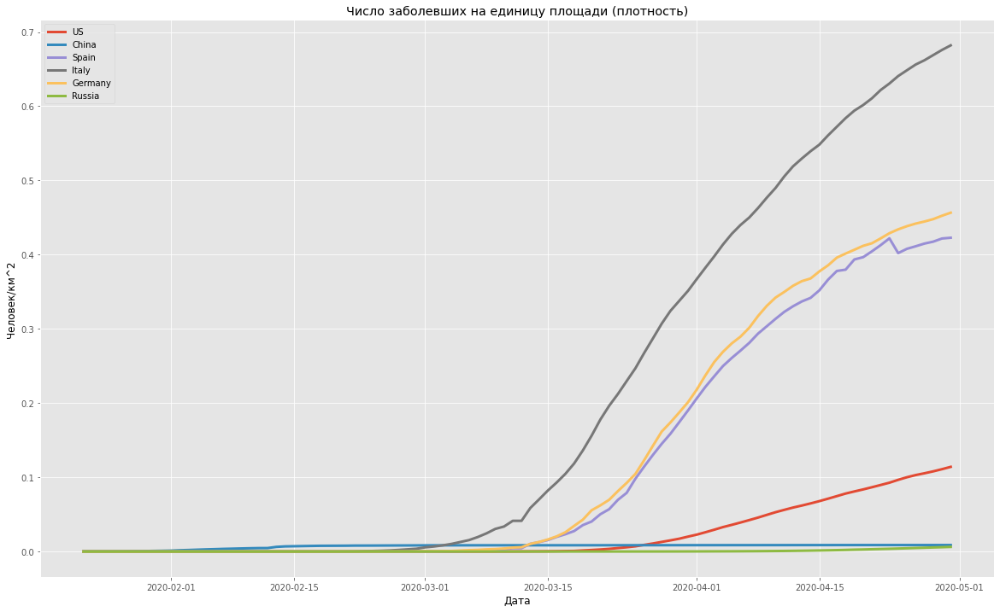

In [0]:
area_ctr = [9372610, 9596960, 504782, 301230, 357022, 17075400]
fig = plt.figure(figsize=(20,12))
labels = list()
plt.title('Число заболевших на единицу площади (плотность)')
plt.xlabel('Дата', color='black')
plt.ylabel('Человек/км^2', color='black')
n=0
for i in top5_Rus:
  l1 = list()
  labels.append(i)
  for d in dates:
    l1.append(df[(df['Country/Region']==i) & (df.Date==d)]['Confirmed'].sum()/area_ctr[n])

  plt.plot(dates, l1, linewidth = 3)
  n+=1

plt.legend(labels);

Самая высокая плотность зараженного населения в Италии(на протяжении всего периода, начиная с 1 марта). В Испании и Германии плотность зараженных изменяется почти одинаково на всем выбранном промежутке. Наименьшая плотность в Китае и России.

1.8 Выделите временной ряд по одному из целевых признаков. Для выделенного временного ряда:
  - Представьте временной ряд в виде последовательности разницы между значениями. Рассчитайте лаги, выведите их на графике.
  - Попробуйте декомпозировать временной ряд. Постройте график тренда.
  - Что вы можете сказать о стационарности временного ряда? 

In [0]:
plt.style.use('ggplot')
plt.rcParams['figure.figsize'] = (15, 10)

df_world = df.copy()
df_world.drop(columns=['Province/State', 'Lat', 'Long', 'Recovered', 'Deaths', 'Letal'], inplace=True)
df_world.head()

,Date,Country/Region,Confirmed
0,2020-01-22,Afghanistan,0.00
4120,2020-01-22,Canada,0.00
13596,2020-01-22,Ghana,0.00
7622,2020-01-22,China,2.00
19776,2020-01-22,Nicaragua,0.00


In [0]:
df_world = df_world.groupby(['Date'], as_index=False).Confirmed.sum()
df_world.index = pd.PeriodIndex(df_world.Date)
df_world.head()

,Date,Confirmed
Date,,
2020-01-22,2020-01-22,555.00
2020-01-23,2020-01-23,654.00
2020-01-24,2020-01-24,941.00
2020-01-25,2020-01-25,1434.00
2020-01-26,2020-01-26,2118.00


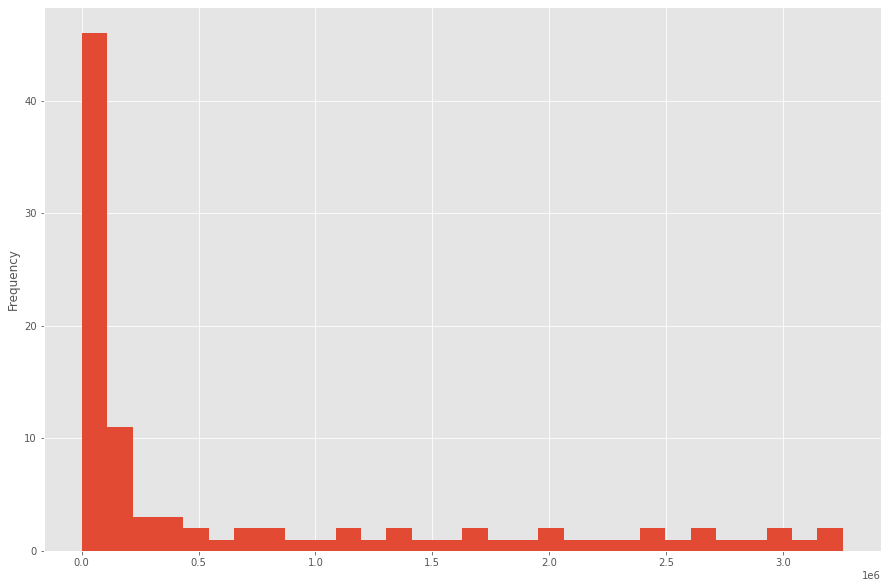

In [0]:
df_world.Confirmed.plot(kind = "hist", bins = 30)

Разброс значений: от 0 до 3256846. Сократим его путем логарифмирования  (Логарифмическое преобразование данных)

In [0]:
df_world['ConfirmedLog'] = np.log(df_world.Confirmed)
df_world.head()

,Date,Confirmed,ConfirmedLog
Date,,,
2020-01-22,2020-01-22,555.00,6.32
2020-01-23,2020-01-23,654.00,6.48
2020-01-24,2020-01-24,941.00,6.85
2020-01-25,2020-01-25,1434.00,7.27
2020-01-26,2020-01-26,2118.00,7.66


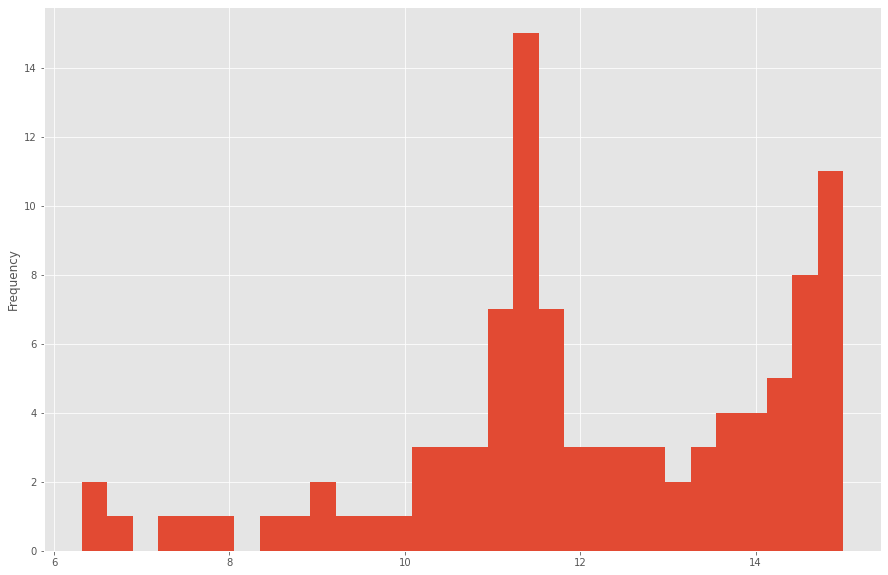

In [0]:
df_world.ConfirmedLog.plot(kind = "hist", bins = 30)

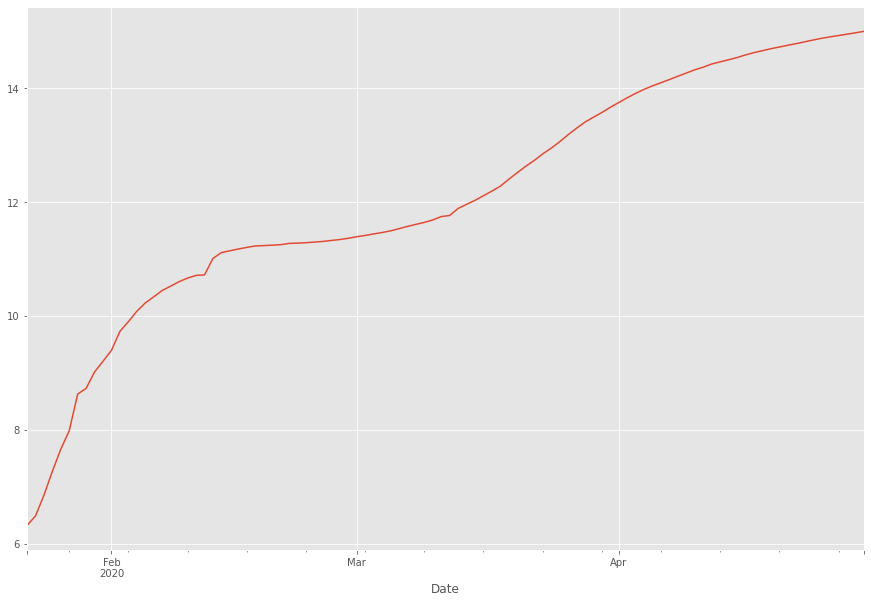

In [0]:
df_world.ConfirmedLog.plot()

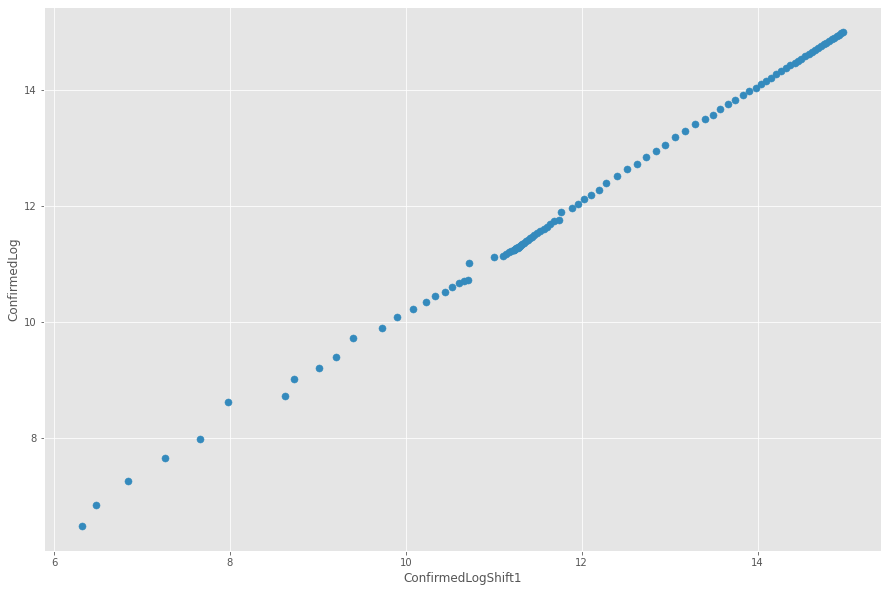

In [0]:
# Рассчитаем лаги
df_world["ConfirmedLogShift1"] = df_world.ConfirmedLog.shift()

df_world.plot(kind= "scatter", y = "ConfirmedLog", x = "ConfirmedLogShift1", s = 50)

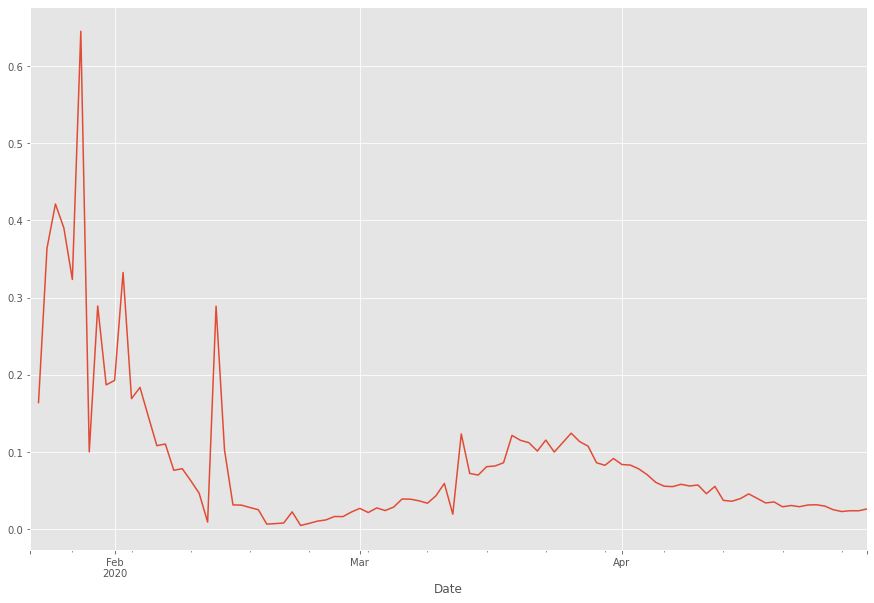

In [0]:
df_world["ConfirmedLogDiff"] = df_world.ConfirmedLog - df_world.ConfirmedLogShift1
df_world.ConfirmedLogDiff.plot()

In [0]:
from statsmodels.tsa.seasonal import seasonal_decompose
df_world.index = df_world.index.to_timestamp()
df_world.head()

,Date,Confirmed,ConfirmedLog,ConfirmedLogShift1,ConfirmedLogDiff
Date,,,,,
2020-01-22,2020-01-22,555.00,6.32,nan,nan
2020-01-23,2020-01-23,654.00,6.48,6.32,0.16
2020-01-24,2020-01-24,941.00,6.85,6.48,0.36
2020-01-25,2020-01-25,1434.00,7.27,6.85,0.42
2020-01-26,2020-01-26,2118.00,7.66,7.27,0.39


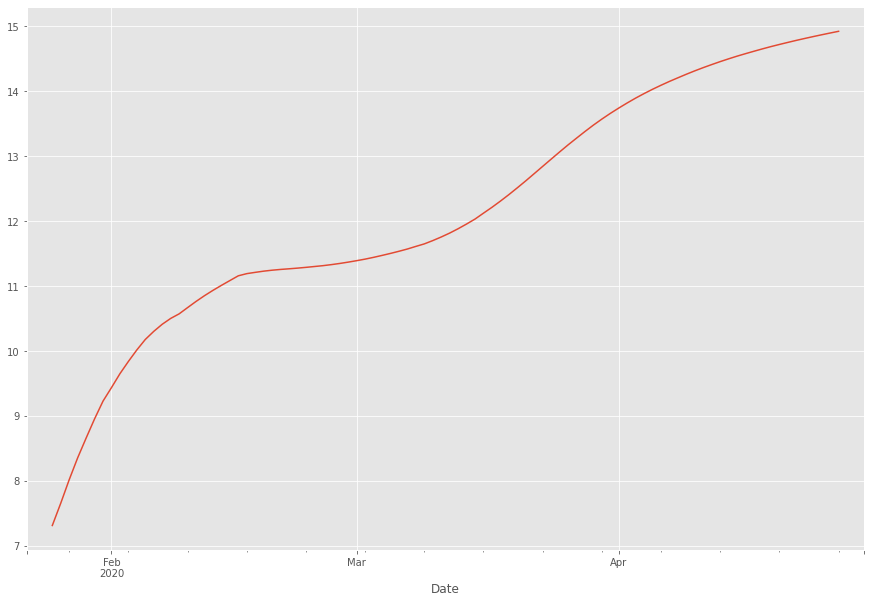

In [0]:
decomposition = seasonal_decompose(df_world.ConfirmedLog, model = "additive")
trend = decomposition.trend
trend.plot()

Ряд не стационарен, т.к. математическое ожидание растет. Проверка:

In [0]:
test = smstt.adfuller(df_world.ConfirmedLog)
print('adf: ', test[0])
print('p-value: ', test[1])
print('Critical values: ', test[4])
if test[0]> test[4]['5%']: 
    print('Есть единичные корни, ряд не стационарен')
else:
    print('Единичных корней нет, ряд стационарен')

adf:  -1.187977393816974
p-value:  0.6787460334243125
Critical values:  {'1%': -3.5003788874873405, '5%': -2.8921519665075235, '10%': -2.5830997960069446}
Есть единичные корни, ряд не стационарен


1.9 Для любого интересующего Вас временного ряда постройте графики ACF и PACF. Сделайте выводы. 

https://towardsdatascience.com/significance-of-acf-and-pacf-plots-in-time-series-analysis-2fa11a5d10a8

Ряд из пункта 1.8

In [0]:
ts = df_world.ConfirmedLog
ts_diff = df_world.ConfirmedLogDiff
ts_diff.dropna(inplace = True)
lag_acf = smstt.acf(ts_diff, nlags=50)

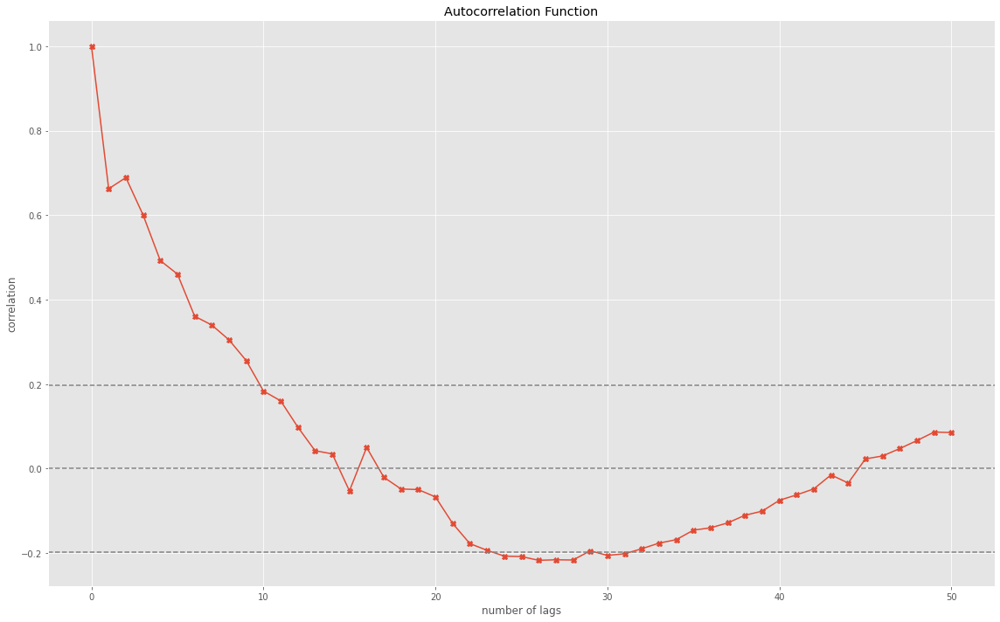

In [0]:
plt.figure(figsize=(16, 10))
plt.plot(lag_acf, marker='X')
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(ts_diff)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(ts_diff)),linestyle='--',color='gray')
plt.title('Autocorrelation Function')
plt.xlabel('number of lags')
plt.ylabel('correlation')
plt.tight_layout()

ACF описывает насколько хорошо нынешнее значение ряда связано с его прошлыми значениями. Временной ряд может иметь такие компоненты, как тренд, сезонность, цикличность и остаточность. ACF рассматривает все эти компоненты, находя корреляции. Порядок q процесса MA находится из графика ACF - это запаздывание, после которого ACF впервые пересекает верхний доверительный интервал. q = 9. Такое количество лагов может привести к проблеме мультиколлинеарности, поэтому в дальнейшем исходный ряд можно продифференцировать(1 или 2 раза).

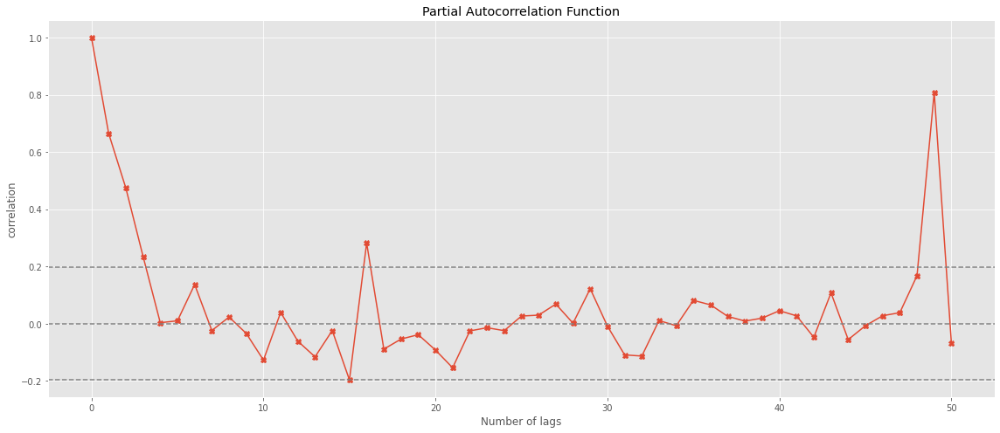

In [0]:
lag_pacf = smstt.pacf(ts_diff, nlags=50, method='ols')

plt.figure(figsize=(16, 7))
plt.plot(lag_pacf,marker='X')
plt.axhline(y=0,linestyle='--',color='gray')
plt.axhline(y=-1.96/np.sqrt(len(ts_diff)),linestyle='--',color='gray')
plt.axhline(y=1.96/np.sqrt(len(ts_diff)),linestyle='--',color='gray')
plt.title('Partial Autocorrelation Function')
plt.xlabel('Number of lags')
plt.ylabel('correlation')
plt.tight_layout()

PACF-это частичная автокорреляционная функция. Он находит корреляцию остатков (которая остается после удаления эффектов, которые уже объясняются более ранним лагом) со следующим значением лага, следовательно, "частичным", а не "полным", поскольку мы удаляем уже найденные вариации, прежде чем найдем следующую корреляцию. Таким образом, если в остатке есть какая-либо скрытая информация, которую можно смоделировать с помощью следующего лага, мы можем получить хорошую корреляцию, и мы сохраним этот следующий лаг в качестве объекта при моделировании.  
На приведенном выше графике мы видим, что лаги до 3 имеют хорошую корреляцию до того, как график впервые перережет верхний доверительный интервал. Это  значение p, то есть порядок нашего процесса AR. Мы можем смоделировать данный AR-процесс, используя линейную комбинацию первых 3 лагов.

Пунктирные линии на графиках представляют собой доверительную полосу, причем центральная пунктирная линия представляет среднее значение, а верхняя и нижняя пунктирные линии представляют границы, основанные на 95% доверительном интервале.

#### 1.10. Изучаемый Вами датасет отражает текущую мировую статистику распространения болезни. Однако эти данные не дают нам возможноси предположить о возможных факторах, которые влюяют на скорость распространения, летальности, заразность и тд. Поэтому в наш датасет можно добавить новые признаки из других наборов данных, которые могут не только помочь при прогнозировании временного ряда, но и определить наиболее значимые факторы.

- Добавьте новый признак "количество дней со дня первого случая заражения". Добавьте еще не менее 5 новых признаков в датасет, которые могут быть значимым фактором распространения вируса. Сохраните полученный датасет, вы можете его использовать во второй части домашнего задания.
- Исследуйте как добавленные признаки соотносятся с трендами распространения короновируса в некоторых странах. Сделайте выводы.

*Примеры признаков - количество дней со начала карантина, конинент, плотность населения, количество употребляемого алкоголя, летучих мышей, алкоголя, крокодилов на душу населения, количество туристов в год, уровень безработицы, температура, количество игроков в Plague Inc., средний возраст или продолжительность жизни и так далее. Вы можете использовать любой найденный датасет. Главное, чтобы у Вас получилось скомбинировать данные.*

  Примеры датасеты:
  1. [500 Cities: Local Data for Better Health (2019)](https://www.kaggle.com/jaimeblasco/500-cities-local-data-for-better-health-2019)
  2. [Daily global surface summary from over 9000 weather stations from 1929 to now](https://www.kaggle.com/noaa/gsod)
  3. [Population by Country - 2020](https://www.kaggle.com/tanuprabhu/population-by-country-2020)



Корабли были выкинуты для конкатенации с другими данными (в пункте 1.4 - df_cont)

In [0]:
df_cont.Date = pd.to_datetime(df_cont.Date)

In [0]:
from datetime import timedelta
for k,v in first_app.items():
  first_app[k] = first+timedelta(days=v)

In [0]:
df_cont['Days_after_first'] = df_cont.apply(lambda x: (x['Date'].date()-first_app[x['Country/Region']]).days, axis=1)

Значение < 0 говорит о том, что дата, соответствующая этому значению, меньше, чем дата подтверждения первого случая в стране.

In [0]:
df_cont

,Date,Country/Region,Province/State,Lat,Long,Confirmed,Recovered,Deaths,Letal,Continent,Days_after_first
0,2020-01-22,Afghanistan,NaN,33.00,65.00,0.00,0.00,0.00,0.00,AS,-33
4120,2020-01-22,Canada,British Columbia,49.28,-123.12,0.00,nan,0.00,0.00,NA,-4
13596,2020-01-22,Ghana,NaN,7.95,-1.02,0.00,0.00,0.00,0.00,AF,-52
7622,2020-01-22,China,Jiangxi,27.61,115.72,2.00,0.00,0.00,0.00,AS,0
19776,2020-01-22,Nicaragua,NaN,12.87,-85.21,0.00,0.00,0.00,0.00,NA,-57
...,...,...,...,...,...,...,...,...,...,...,...
17506,2020-04-30,Madagascar,NaN,-18.77,46.87,128.00,92.00,0.00,0.00,AF,41
17300,2020-04-30,Luxembourg,NaN,49.82,6.13,3784.00,3213.00,90.00,2.38,EU,61
17197,2020-04-30,Lithuania,NaN,55.17,23.88,1385.00,589.00,45.00,3.25,EU,62
16991,2020-04-30,Libya,NaN,26.34,17.23,61.00,18.00,3.00,4.92,AF,37


**Новые признаки**

Все пропуски (если они есть) будем менять на медиану признака

In [0]:
def stand_names(x):
  p = list()
  for i in x:
    try:
      i = coco.convert(i, to='name_short')
      if i!='not found':
        p.append(i)
    except:
      print('Not country')
  return p

In [0]:
def codes_name(x, ban=[], ban_codes=[]):
  codes = dict()
  for i in x:
    if i not in ban:
      code = pc.country_name_to_country_alpha2(i)
      codes.update({i:code})
  for i in range(len(ban)):
    codes.update({ban[i]:ban_codes[i]})
  return codes

In [0]:
ban = ['Kosovo', 'Vatican', 'St. Vincent and the Grenadines', 'Congo Republic', "Cote d'Ivoire", 'DR Congo']
ban_codes = ['XK','VA','VC','CG','CI','CD']
p = stand_names(df_cont['Country/Region'].unique())
codes = codes_name(p, ban, ban_codes)

In [0]:
new_dict = dict()
for i in range(len(df_cont['Country/Region'].unique())):
  c = coco.convert(df_cont['Country/Region'].unique()[i], to='name_short')
  if c in codes.keys():
    new_dict.update({df_cont['Country/Region'].unique()[i]:codes[c]})

In [0]:
df_cont['Alpha-2 Code'] = df_cont['Country/Region'].apply(lambda x: new_dict[x])

In [0]:
df_cont.head()

,Date,Country/Region,Province/State,Lat,Long,Confirmed,Recovered,Deaths,Letal,Continent,Days_after_first,Alpha-2 Code
0,2020-01-22,Afghanistan,NaN,33.00,65.00,0.00,0.00,0.00,0.00,AS,-33,AF
4120,2020-01-22,Canada,British Columbia,49.28,-123.12,0.00,nan,0.00,0.00,NA,-4,CA
13596,2020-01-22,Ghana,NaN,7.95,-1.02,0.00,0.00,0.00,0.00,AF,-52,GH
7622,2020-01-22,China,Jiangxi,27.61,115.72,2.00,0.00,0.00,0.00,AS,0,CN
19776,2020-01-22,Nicaragua,NaN,12.87,-85.21,0.00,0.00,0.00,0.00,NA,-57,NI


Количество кроватей на 1000 пациентов в больницах до пандемии(https://www.kaggle.com/ikiulian/global-hospital-beds-capacity-for-covid19).

In [0]:
beds = pd.read_csv('hospital_beds_global_v1.csv')
beds.drop(columns=['state','county', 'lat', 'lng', 'type', 'population', 'source', 'source_url'], inplace=True)
beds = beds.groupby(by='country', as_index=False).beds.min()
beds.head()

,country,beds
0,AD,0.07
1,AE,1.20
2,AF,0.50
3,AG,3.80
4,AL,2.90


In [0]:
df_cont['Beds(per1000)'] = df_cont['Alpha-2 Code'].apply(lambda x: float(beds[beds.country==x]['beds'].sum()))

In [0]:
df_cont.Continent = df_cont.Continent.apply(lambda x: continents[x])
df_cont

,Date,Country/Region,Province/State,Lat,Long,Confirmed,Recovered,Deaths,Letal,Continent,Days_after_first,Alpha-2 Code,Beds(per1000)
0,2020-01-22,Afghanistan,NaN,33.00,65.00,0.00,0.00,0.00,0.00,Asia,-33,AF,0.50
4120,2020-01-22,Canada,British Columbia,49.28,-123.12,0.00,nan,0.00,0.00,North America,-4,CA,0.34
13596,2020-01-22,Ghana,NaN,7.95,-1.02,0.00,0.00,0.00,0.00,Africa,-52,GH,0.90
7622,2020-01-22,China,Jiangxi,27.61,115.72,2.00,0.00,0.00,0.00,Asia,0,CN,0.04
19776,2020-01-22,Nicaragua,NaN,12.87,-85.21,0.00,0.00,0.00,0.00,North America,-57,NI,0.90
...,...,...,...,...,...,...,...,...,...,...,...,...,...
17506,2020-04-30,Madagascar,NaN,-18.77,46.87,128.00,92.00,0.00,0.00,Africa,41,MG,0.20
17300,2020-04-30,Luxembourg,NaN,49.82,6.13,3784.00,3213.00,90.00,2.38,Europe,61,LU,0.25
17197,2020-04-30,Lithuania,NaN,55.17,23.88,1385.00,589.00,45.00,3.25,Europe,62,LT,0.15
16991,2020-04-30,Libya,NaN,26.34,17.23,61.00,18.00,3.00,4.92,Africa,37,LY,3.70


Несколько признаков отсюда (https://www.kaggle.com/bitsnpieces/covid19-country-data)


ВВП

In [0]:
gdp = pd.read_csv('covid19_data - gdp.csv')
gdp.drop(index=1, inplace=True)
gdp.head()

,Rank,Country/Territory,GDP_USD_Million
0,1,United States,"21,439,453"
2,2,China,"14,140,163"
3,3,Japan,"5,154,475"
4,4,Germany,"3,863,344"
5,5,India,"2,935,570"


In [0]:
p = stand_names(gdp['Country/Territory'].unique())
ban = ['DR Congo', 'Micronesia, Fed. Sts.', "Cote d'Ivoire", 'Congo Republic', 'Kosovo', 'St. Vincent and the Grenadines']
ban_codes = ['CD', 'FM', 'CI', 'CG' , 'XK', 'VC']
codes = codes_name(p, ban, ban_codes)

In [0]:
new_dict = dict()
for i in range(len(gdp['Country/Territory'].unique())):
  c = coco.convert(gdp['Country/Territory'].unique()[i], to='name_short')
  if c in codes.keys():
    new_dict.update({gdp['Country/Territory'].unique()[i]:codes[c]})

In [0]:
gdp['Code'] = gdp['Country/Territory'].apply(lambda x: new_dict[x])

In [0]:
df_cont['GDP(Million)'] = df_cont['Alpha-2 Code'].apply(lambda x: float(str(gdp[gdp.Code==x]['GDP_USD_Million'].sum()).replace(',','')))

In [0]:
df_cont

,Date,Country/Region,Province/State,Lat,Long,Confirmed,Recovered,Deaths,Letal,Continent,Days_after_first,Alpha-2 Code,Beds(per1000),GDP(Million)
0,2020-01-22,Afghanistan,NaN,33.00,65.00,0.00,0.00,0.00,0.00,Asia,-33,AF,0.50,18734.00
4120,2020-01-22,Canada,British Columbia,49.28,-123.12,0.00,nan,0.00,0.00,North America,-4,CA,0.34,1730914.00
13596,2020-01-22,Ghana,NaN,7.95,-1.02,0.00,0.00,0.00,0.00,Africa,-52,GH,0.90,67077.00
7622,2020-01-22,China,Jiangxi,27.61,115.72,2.00,0.00,0.00,0.00,Asia,0,CN,0.04,14140163.00
19776,2020-01-22,Nicaragua,NaN,12.87,-85.21,0.00,0.00,0.00,0.00,North America,-57,NI,0.90,12528.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17506,2020-04-30,Madagascar,NaN,-18.77,46.87,128.00,92.00,0.00,0.00,Africa,41,MG,0.20,12550.00
17300,2020-04-30,Luxembourg,NaN,49.82,6.13,3784.00,3213.00,90.00,2.38,Europe,61,LU,0.25,69453.00
17197,2020-04-30,Lithuania,NaN,55.17,23.88,1385.00,589.00,45.00,3.25,Europe,62,LT,0.15,53641.00
16991,2020-04-30,Libya,NaN,26.34,17.23,61.00,18.00,3.00,4.92,Africa,37,LY,3.70,33018.00


Трафик полетов(на 2018 год)

In [0]:
airs = pd.read_csv('covid19_data - airport_traffic_world.csv')
airs.head()

,Country Name,airport_traffic_2018_thousands,Country Code
0,Aruba,274280.00,ABW
1,Afghanistan,1722613.00,AFG
2,Angola,1516628.00,AGO
3,Albania,303137.00,ALB
4,Andorra,nan,AND


In [0]:
airs.isnull().sum()

Country Name                       0
airport_traffic_2018_thousands    65
Country Code                       0
dtype: int64

In [0]:
airs['airport_traffic_2018_thousands'] = airs['airport_traffic_2018_thousands'].apply(lambda x: np.nanmedian(airs['airport_traffic_2018_thousands']) if (np.isnan(x)) else x)

In [0]:
airs.head()

,Country Name,airport_traffic_2018_thousands,Country Code
0,Aruba,274280.00,ABW
1,Afghanistan,1722613.00,AFG
2,Angola,1516628.00,AGO
3,Albania,303137.00,ALB
4,Andorra,6079321.00,AND


In [0]:
p = stand_names(airs['Country Name'].unique())
ban = ['DR Congo', 'Micronesia, Fed. Sts.', "Cote d'Ivoire", 'Congo Republic', 'Kosovo', 'St. Vincent and the Grenadines', 'Curacao', 'Faeroe Islands', 'Saint-Martin', 'Sint Maarten']
ban_codes = ['CD', 'FM', 'CI', 'CG' , 'XK', 'VC', 'CW', 'FO', 'MF', 'SX']
codes1 = codes_name(p, ban, ban_codes)

In [0]:
new_dict = dict()
for i in range(len(airs['Country Name'].unique())):
  c = coco.convert(airs['Country Name'].unique()[i], to='name_short')
  if c in codes1.keys():
    new_dict.update({airs['Country Name'].unique()[i]:codes1[c]})

In [0]:
airs['Code'] = airs['Country Name'].apply(lambda x: new_dict[x] if (x in new_dict.keys()) else '')

In [0]:
df_cont['AirTraffic(thousands)'] = df_cont['Alpha-2 Code'].apply(lambda x: airs[airs.Code==x]['airport_traffic_2018_thousands'].sum())

In [0]:
df_cont

,Date,Country/Region,Province/State,Lat,Long,Confirmed,Recovered,Deaths,Letal,Continent,Days_after_first,Alpha-2 Code,Beds(per1000),GDP(Million),AirTraffic(thousands)
0,2020-01-22,Afghanistan,NaN,33.00,65.00,0.00,0.00,0.00,0.00,Asia,-33,AF,0.50,18734.00,1722613.00
4120,2020-01-22,Canada,British Columbia,49.28,-123.12,0.00,nan,0.00,0.00,North America,-4,CA,0.34,1730914.00,89380000.00
13596,2020-01-22,Ghana,NaN,7.95,-1.02,0.00,0.00,0.00,0.00,Africa,-52,GH,0.90,67077.00,467438.00
7622,2020-01-22,China,Jiangxi,27.61,115.72,2.00,0.00,0.00,0.00,Asia,0,CN,0.04,14140163.00,611000000.00
19776,2020-01-22,Nicaragua,NaN,12.87,-85.21,0.00,0.00,0.00,0.00,North America,-57,NI,0.90,12528.00,6079321.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17506,2020-04-30,Madagascar,NaN,-18.77,46.87,128.00,92.00,0.00,0.00,Africa,41,MG,0.20,12550.00,541290.00
17300,2020-04-30,Luxembourg,NaN,49.82,6.13,3784.00,3213.00,90.00,2.38,Europe,61,LU,0.25,69453.00,2099102.00
17197,2020-04-30,Lithuania,NaN,55.17,23.88,1385.00,589.00,45.00,3.25,Europe,62,LT,0.15,53641.00,26031.00
16991,2020-04-30,Libya,NaN,26.34,17.23,61.00,18.00,3.00,4.92,Africa,37,LY,3.70,33018.00,927153.90


Проценты численности населения по возрастным группам

In [0]:
ages = pd.read_csv('covid19_data - age.csv')
ages.head()

,Country,age_0_to_14_years,age_15_to_64_years,age_over_65_years
0,Afghanistan,43.2 %,54.2 %,2.6 %
1,Albania,17.4 %,68.9 %,13.2 %
2,Algeria,29.3 %,64.5 %,6.2 %
3,Angola,46.8 %,50.8 %,2.4 %
4,Antigua and Barbuda,23.9 %,69.2 %,6.9 %


In [0]:
ages.Country.unique()

array(['\xa0Afghanistan', '\xa0Albania', '\xa0Algeria', '\xa0Angola',
       '\xa0Antigua and Barbuda', '\xa0Argentina', '\xa0Armenia',
       '\xa0Aruba (Netherlands)', '\xa0Australia', '\xa0Austria',
       '\xa0Azerbaijan', '\xa0Bahamas', '\xa0Bahrain', '\xa0Bangladesh',
       '\xa0Barbados', '\xa0Belarus', '\xa0Belgium', '\xa0Belize',
       '\xa0Benin', '\xa0Bhutan', '\xa0Bolivia',
       '\xa0Bosnia and Herzegovina', '\xa0Botswana', '\xa0Brazil',
       '\xa0Brunei', '\xa0Bulgaria', '\xa0Burkina Faso', '\xa0Burundi',
       '\xa0Cape Verde', '\xa0Cambodia', '\xa0Cameroon', '\xa0Canada',
       '\xa0Central African Republic', '\xa0Chad', '\xa0Chile',
       '\xa0China', '\xa0Colombia', '\xa0Comoros',
       '\xa0Democratic Republic of the Congo',
       '\xa0Republic of the Congo', '\xa0Costa Rica', '\xa0Croatia',
       '\xa0Cuba', '\xa0Curaçao', '\xa0Cyprus', '\xa0Czech Republic',
       '\xa0Denmark', '\xa0Djibouti', '\xa0Dominican Republic',
       '\xa0Ecuador', '\xa0Egypt',

In [0]:
ages.Country = ages.Country.apply(lambda x: x[1:])

In [0]:
ages[ages.Country.str.contains('\xa0')]

,Country,age_0_to_14_years,age_15_to_64_years,age_over_65_years
121,Nepal,30.9 %,63.3 %,5.8 %
164,Switzerland,14.9 %,66.7 %,18.4 %


In [0]:
ages.Country[7] = 'Aruba'
ages.Country[121]='Nepal'
ages.Country[164]='Switzerland'

In [0]:
ages.head()

,Country,age_0_to_14_years,age_15_to_64_years,age_over_65_years
0,Afghanistan,43.2 %,54.2 %,2.6 %
1,Albania,17.4 %,68.9 %,13.2 %
2,Algeria,29.3 %,64.5 %,6.2 %
3,Angola,46.8 %,50.8 %,2.4 %
4,Antigua and Barbuda,23.9 %,69.2 %,6.9 %


In [0]:
p = stand_names(ages['Country'].unique())
ban = ['DR Congo', 'Micronesia, Fed. Sts.', "Cote d'Ivoire", 'Congo Republic', 'Kosovo', 'St. Vincent and the Grenadines', 'Curacao', 'Faeroe Islands', 'Saint-Martin', 'Sint Maarten']
ban_codes = ['CD', 'FM', 'CI', 'CG' , 'XK', 'VC', 'CW', 'FO', 'MF', 'SX']
codes2 = codes_name(p, ban, ban_codes)

In [0]:
new_dict = dict()
for i in range(len(ages['Country'].unique())):
  c = coco.convert(ages['Country'].unique()[i], to='name_short')
  if c in codes2.keys():
    new_dict.update({ages['Country'].unique()[i]:codes2[c]})

In [0]:
ages['Code'] = ages['Country'].apply(lambda x: new_dict[x] if (x in new_dict.keys()) else '')

In [0]:
ages.replace('23.70%', '23.7\xa0%', inplace=True)

In [0]:
df_cont['0to14years(%)'] = df_cont['Alpha-2 Code'].apply(lambda x: ages[ages.Code==x]['age_0_to_14_years'].sum())
df_cont['15to64years(%)'] = df_cont['Alpha-2 Code'].apply(lambda x: ages[ages.Code==x]['age_15_to_64_years'].sum())
df_cont['over65years(%)'] = df_cont['Alpha-2 Code'].apply(lambda x: ages[ages.Code==x]['age_over_65_years'].sum())
df_cont['0to14years(%)'] = df_cont['0to14years(%)'].apply(lambda x: float(str(x).split('\xa0')[0]))
df_cont['15to64years(%)'] = df_cont['15to64years(%)'].apply(lambda x: float(str(x).split('\xa0')[0]))
df_cont['over65years(%)'] = df_cont['over65years(%)'].apply(lambda x: float(str(x).split('\xa0')[0]))

In [0]:
df_cont

,Date,Country/Region,Province/State,Lat,Long,Confirmed,Recovered,Deaths,Letal,Continent,Days_after_first,Alpha-2 Code,Beds(per1000),GDP(Million),AirTraffic(thousands),0to14years(%),15to64years(%),over65years(%)
0,2020-01-22,Afghanistan,NaN,33.00,65.00,0.00,0.00,0.00,0.00,Asia,-33,AF,0.50,18734.00,1722613.00,43.20,54.20,2.60
4120,2020-01-22,Canada,British Columbia,49.28,-123.12,0.00,nan,0.00,0.00,North America,-4,CA,0.34,1730914.00,89380000.00,16.00,67.00,17.00
13596,2020-01-22,Ghana,NaN,7.95,-1.02,0.00,0.00,0.00,0.00,Africa,-52,GH,0.90,67077.00,467438.00,38.50,58.10,3.40
7622,2020-01-22,China,Jiangxi,27.61,115.72,2.00,0.00,0.00,0.00,Asia,0,CN,0.04,14140163.00,611000000.00,17.70,71.70,10.60
19776,2020-01-22,Nicaragua,NaN,12.87,-85.21,0.00,0.00,0.00,0.00,North America,-57,NI,0.90,12528.00,6079321.00,29.00,65.50,5.40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17506,2020-04-30,Madagascar,NaN,-18.77,46.87,128.00,92.00,0.00,0.00,Africa,41,MG,0.20,12550.00,541290.00,41.00,56.10,2.90
17300,2020-04-30,Luxembourg,NaN,49.82,6.13,3784.00,3213.00,90.00,2.38,Europe,61,LU,0.25,69453.00,2099102.00,16.50,69.20,14.30
17197,2020-04-30,Lithuania,NaN,55.17,23.88,1385.00,589.00,45.00,3.25,Europe,62,LT,0.15,53641.00,26031.00,14.80,66.20,19.00
16991,2020-04-30,Libya,NaN,26.34,17.23,61.00,18.00,3.00,4.92,Africa,37,LY,3.70,33018.00,927153.90,28.20,67.40,4.40


Суммарная рождаемость и средний возраст

In [0]:
pop = pd.read_csv('covid19_data - population.csv')
pop.head()

,Rank,Country,Population_2020,Yearly_change,Net_change,Density_KM2m,Land_Area_Km2,Migrants,Fertility_rate,Median_age,Urban_pop_pct,World_share
0,1,China,"1,439,323,776",0.39%,"5,540,090",153,"9,388,211","-348,399",1.7,38,61%,18.47%
1,2,India,"1,380,004,385",0.99%,"13,586,631",464,"2,973,190","-532,687",2.2,28,35%,17.70%
2,3,United States,"331,002,651",0.59%,"1,937,734",36,"9,147,420","954,806",1.8,38,83%,4.25%
3,4,Indonesia,"273,523,615",1.07%,"2,898,047",151,"1,811,570","-98,955",2.3,30,56%,3.51%
4,5,Pakistan,"220,892,340",2.00%,"4,327,022",287,"770,880","-233,379",3.6,23,35%,2.83%


In [0]:
pop.replace('N.A.', np.nan, inplace=True)
pop['Fertility_rate'] = pop['Fertility_rate'].apply(lambda x: float(x))

In [0]:
pop['Fertility_rate'] = pop['Fertility_rate'].apply(lambda x: np.nanmedian(pop['Fertility_rate']) if (np.isnan(x)) else x)

In [0]:
p = stand_names(pop['Country'].unique())
ban = ['DR Congo', 'Micronesia, Fed. Sts.', "Cote d'Ivoire", 'Congo Republic', 'Kosovo', 'St. Vincent and the Grenadines', 'Curacao', 'Faeroe Islands', 'Saint-Martin', 
       'Sint Maarten', 'Reunion', 'Bonaire, Saint Eustatius and Saba', 'Wallis and Futuna Islands', 'St. Barths', 'St. Helena', 'Vatican']
ban_codes = ['CD', 'FM', 'CI', 'CG' , 'XK', 'VC', 'CW', 'FO', 'MF', 'SX', 'RE', 'BQ', 'WF', 'BL', 'SH', 'VA']
codes3 = codes_name(p, ban, ban_codes)

In [0]:
new_dict = dict()
for i in range(len(pop['Country'].unique())):
  c = coco.convert(pop['Country'].unique()[i], to='name_short')
  if c in codes3.keys():
    new_dict.update({pop['Country'].unique()[i]:codes3[c]})

In [0]:
pop['Code'] = pop['Country'].apply(lambda x: new_dict[x] if (x in new_dict.keys()) else '')

In [0]:
df_cont['Fertility_Rate'] = df_cont['Alpha-2 Code'].apply(lambda x: pop[pop.Code==x]['Fertility_rate'].sum())
df_cont['Median_Age'] = df_cont['Alpha-2 Code'].apply(lambda x: float(pop[pop.Code==x]['Median_age'].sum()))

In [0]:
df_cont

,Date,Country/Region,Province/State,Lat,Long,Confirmed,Recovered,Deaths,Letal,Continent,Days_after_first,Alpha-2 Code,Beds(per1000),GDP(Million),AirTraffic(thousands),0to14years(%),15to64years(%),over65years(%),Fertility_Rate,Median_Age
0,2020-01-22,Afghanistan,NaN,33.00,65.00,0.00,0.00,0.00,0.00,Asia,-33,AF,0.50,18734.00,1722613.00,43.20,54.20,2.60,4.60,18.00
4120,2020-01-22,Canada,British Columbia,49.28,-123.12,0.00,nan,0.00,0.00,North America,-4,CA,0.34,1730914.00,89380000.00,16.00,67.00,17.00,1.50,41.00
13596,2020-01-22,Ghana,NaN,7.95,-1.02,0.00,0.00,0.00,0.00,Africa,-52,GH,0.90,67077.00,467438.00,38.50,58.10,3.40,3.90,22.00
7622,2020-01-22,China,Jiangxi,27.61,115.72,2.00,0.00,0.00,0.00,Asia,0,CN,0.04,14140163.00,611000000.00,17.70,71.70,10.60,1.70,38.00
19776,2020-01-22,Nicaragua,NaN,12.87,-85.21,0.00,0.00,0.00,0.00,North America,-57,NI,0.90,12528.00,6079321.00,29.00,65.50,5.40,2.40,26.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17506,2020-04-30,Madagascar,NaN,-18.77,46.87,128.00,92.00,0.00,0.00,Africa,41,MG,0.20,12550.00,541290.00,41.00,56.10,2.90,4.10,20.00
17300,2020-04-30,Luxembourg,NaN,49.82,6.13,3784.00,3213.00,90.00,2.38,Europe,61,LU,0.25,69453.00,2099102.00,16.50,69.20,14.30,1.50,40.00
17197,2020-04-30,Lithuania,NaN,55.17,23.88,1385.00,589.00,45.00,3.25,Europe,62,LT,0.15,53641.00,26031.00,14.80,66.20,19.00,1.70,45.00
16991,2020-04-30,Libya,NaN,26.34,17.23,61.00,18.00,3.00,4.92,Africa,37,LY,3.70,33018.00,927153.90,28.20,67.40,4.40,2.30,29.00


Процент городского населения (https://www.kaggle.com/tanuprabhu/population-by-country-2020) + население (на 2020 год)

In [0]:
urban = pd.read_csv('population_by_country_2020.csv')
urban.head()

,Country (or dependency),Population (2020),Yearly Change,Net Change,Density (P/Km²),Land Area (Km²),Migrants (net),Fert. Rate,Med. Age,Urban Pop %,World Share
0,China,1438207241,0.39 %,5540090,153,9388211,-348399.00,1.7,38,61 %,18.47 %
1,India,1377233523,0.99 %,13586631,464,2973190,-532687.00,2.2,28,35 %,17.70 %
2,United States,330610570,0.59 %,1937734,36,9147420,954806.00,1.8,38,83 %,4.25 %
3,Indonesia,272931713,1.07 %,2898047,151,1811570,-98955.00,2.3,30,56 %,3.51 %
4,Pakistan,219992900,2.00 %,4327022,287,770880,-233379.00,3.6,23,35 %,2.83 %


In [0]:
urban['Urban Pop %'].unique()

array(['61 %', '35 %', '83 %', '56 %', '88 %', '52 %', '39 %', '74 %',
       '84 %', '92 %', '21 %', '47 %', '43 %', '38 %', '46 %', '76 %',
       '51 %', '82 %', '69 %', '37 %', '67 %', '31 %', '28 %', '80 %',
       '26 %', '93 %', '73 %', '25 %', '60 %', '81 %', '64 %', '50 %',
       '79 %', '78 %', '57 %', 'N.A.', '63 %', '86 %', '17 %', '18 %',
       '44 %', '55 %', '85 %', '58 %', '45 %', '49 %', '24 %', '23 %',
       '48 %', '14 %', '70 %', '98 %', '91 %', '66 %', '72 %', '27 %',
       '13 %', '36 %', '62 %', '53 %', '54 %', '87 %', '68 %', '96 %',
       '71 %', '59 %', '89 %', '33 %', '41 %', '30 %', '100 %', '29 %',
       '65 %', '94 %', '19 %', '95 %', '97 %', '0 %', '15 %', '75 %',
       '10 %'], dtype=object)

In [0]:
urban.replace('N.A.', np.nan, inplace=True)
urban['Urban Pop %'] = urban['Urban Pop %'].apply(lambda x: float(str(x).split(' ')[0]))
urban['Urban Pop %'] = urban['Urban Pop %'].apply(lambda x: np.nanmedian(urban['Urban Pop %']) if (np.isnan(x)) else x)

In [0]:
p = stand_names(urban['Country (or dependency)'].unique())
ban = ['DR Congo', 'Micronesia, Fed. Sts.', "Cote d'Ivoire", 'Congo Republic', 'Kosovo', 'St. Vincent and the Grenadines', 'Curacao', 'Faeroe Islands', 'Saint-Martin', 
       'Sint Maarten', 'Reunion', 'Bonaire, Saint Eustatius and Saba', 'Wallis and Futuna Islands', 'St. Barths', 'St. Helena', 'Vatican']
ban_codes = ['CD', 'FM', 'CI', 'CG' , 'XK', 'VC', 'CW', 'FO', 'MF', 'SX', 'RE', 'BQ', 'WF', 'BL', 'SH', 'VA']
codes4 = codes_name(p, ban, ban_codes)

In [0]:
new_dict = dict()
for i in range(len(urban['Country (or dependency)'].unique())):
  c = coco.convert(urban['Country (or dependency)'].unique()[i], to='name_short')
  if c in codes4.keys():
    new_dict.update({urban['Country (or dependency)'].unique()[i]:codes4[c]})

In [0]:
urban['Code'] = urban['Country (or dependency)'].apply(lambda x: new_dict[x] if (x in new_dict.keys()) else '')

In [0]:
df_cont['UrbanPopulation(%)'] = df_cont['Alpha-2 Code'].apply(lambda x: urban[urban.Code==x]['Urban Pop %'].sum())
df_cont['Population'] = df_cont['Alpha-2 Code'].apply(lambda x: urban[urban.Code==x]['Population (2020)'].sum())

In [0]:
df_cont

,Date,Country/Region,Province/State,Lat,Long,Confirmed,Recovered,Deaths,Letal,Continent,Days_after_first,Alpha-2 Code,Beds(per1000),GDP(Million),AirTraffic(thousands),0to14years(%),15to64years(%),over65years(%),Fertility_Rate,Median_Age,UrbanPopulation(%),Population
0,2020-01-22,Afghanistan,NaN,33.00,65.00,0.00,0.00,0.00,0.00,Asia,-33,AF,0.50,18734.00,1722613.00,43.20,54.20,2.60,4.60,18.00,25.00,38742911
4120,2020-01-22,Canada,British Columbia,49.28,-123.12,0.00,nan,0.00,0.00,North America,-4,CA,0.34,1730914.00,89380000.00,16.00,67.00,17.00,1.50,41.00,81.00,37674770
13596,2020-01-22,Ghana,NaN,7.95,-1.02,0.00,0.00,0.00,0.00,Africa,-52,GH,0.90,67077.00,467438.00,38.50,58.10,3.40,3.90,22.00,57.00,30936375
7622,2020-01-22,China,Jiangxi,27.61,115.72,2.00,0.00,0.00,0.00,Asia,0,CN,0.04,14140163.00,611000000.00,17.70,71.70,10.60,1.70,38.00,61.00,1438207241
19776,2020-01-22,Nicaragua,NaN,12.87,-85.21,0.00,0.00,0.00,0.00,North America,-57,NI,0.90,12528.00,6079321.00,29.00,65.50,5.40,2.40,26.00,57.00,6608366
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17506,2020-04-30,Madagascar,NaN,-18.77,46.87,128.00,92.00,0.00,0.00,Africa,41,MG,0.20,12550.00,541290.00,41.00,56.10,2.90,4.10,20.00,39.00,27539106
17300,2020-04-30,Luxembourg,NaN,49.82,6.13,3784.00,3213.00,90.00,2.38,Europe,61,LU,0.25,69453.00,2099102.00,16.50,69.20,14.30,1.50,40.00,88.00,623861
17197,2020-04-30,Lithuania,NaN,55.17,23.88,1385.00,589.00,45.00,3.25,Europe,62,LT,0.15,53641.00,26031.00,14.80,66.20,19.00,1.70,45.00,71.00,2729553
16991,2020-04-30,Libya,NaN,26.34,17.23,61.00,18.00,3.00,4.92,Africa,37,LY,3.70,33018.00,927153.90,28.20,67.40,4.40,2.30,29.00,78.00,6852010


Сохранение датасета

In [0]:
df_cont.to_csv('data_attr.csv', index=False)

Добавленные признаки и тренды

In [0]:
df_trend_new = df_cont[df_cont.Date == df_cont.Date.unique()[-1]].copy()

In [0]:
df_trend_new.drop(columns=['Date','Country/Region', 'Lat','Long','Continent', 'Alpha-2 Code', 'Province/State'], inplace=True)

In [0]:
df_trend_new['Conf/Pop'] = df_trend_new['Confirmed']/df_trend_new['Population']
df_trend_new['Death/Pop'] = df_trend_new['Deaths']/df_trend_new['Population']
df_trend_new['Rec/Pop'] = df_trend_new['Recovered']/df_trend_new['Population']
df_trend_new.sort_index(axis=0,inplace=True)
df_trend_new

,Confirmed,Recovered,Deaths,Letal,Days_after_first,Beds(per1000),GDP(Million),AirTraffic(thousands),0to14years(%),15to64years(%),over65years(%),Fertility_Rate,Median_Age,UrbanPopulation(%),Population,Conf/Pop,Death/Pop,Rec/Pop
99,2171.00,260.00,64.00,2.95,66,0.50,18734.00,1722613.00,43.20,54.20,2.60,4.60,18.00,25.00,38742911,0.00,0.00,0.00
202,773.00,470.00,31.00,4.01,52,2.90,15418.00,303137.00,17.40,68.90,13.20,1.60,36.00,63.00,2878420,0.00,0.00,0.00
305,4006.00,1779.00,450.00,11.23,65,1.90,172781.00,6442442.00,29.30,64.50,6.20,3.10,29.00,73.00,43685618,0.00,0.00,0.00
408,745.00,468.00,42.00,5.64,59,0.07,0.00,6079321.00,0.00,0.00,0.00,2.30,0.00,88.00,77240,0.01,0.00,0.01
511,27.00,7.00,2.00,7.41,41,0.80,91527.00,1516628.00,46.80,50.80,2.40,5.60,17.00,67.00,32644783,0.00,0.00,0.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26982,344.00,76.00,2.00,0.58,56,1.20,0.00,6079321.00,39.60,57.40,3.00,3.70,21.00,80.00,5076280,0.00,0.00,0.00
27085,6.00,5.00,0.00,0.00,25,0.00,0.00,0.00,0.00,0.00,0.00,2.40,28.00,87.00,594215,0.00,0.00,0.00
27188,6.00,1.00,2.00,33.33,20,0.70,29855.00,336310.00,39.90,57.20,2.90,3.80,20.00,38.00,29687214,0.00,0.00,0.00
27291,106.00,55.00,3.00,2.83,43,2.00,23946.00,8904.00,44.80,52.70,2.50,4.70,18.00,45.00,18273379,0.00,0.00,0.00


In [0]:
corr_conf = df_trend_new.corr()
corr_conf.style.background_gradient(cmap='BrBG')

,Confirmed,Recovered,Deaths,Letal,Days_after_first,Beds(per1000),GDP(Million),AirTraffic(thousands),0to14years(%),15to64years(%),over65years(%),Fertility_Rate,Median_Age,UrbanPopulation(%),Population,Conf/Pop,Death/Pop,Rec/Pop
Confirmed,1.000000,0.796143,0.930008,0.149064,0.136224,-0.048229,0.221715,0.210794,-0.080687,0.044182,0.134987,-0.090510,0.112818,0.118395,-0.003580,0.187784,0.269210,0.110083
Recovered,0.796143,1.000000,0.779594,0.172041,0.180408,-0.098564,0.157130,0.144883,-0.128432,0.074446,0.193355,-0.141157,0.178438,0.148215,0.001424,0.215549,0.320440,0.245597
Deaths,0.930008,0.779594,1.000000,0.260255,0.156603,-0.084759,0.185199,0.171750,-0.096442,0.033870,0.184064,-0.102331,0.139759,0.131848,-0.016068,0.227283,0.416708,0.138600
Letal,0.149064,0.172041,0.260255,1.000000,-0.144019,-0.046815,-0.180028,-0.179203,0.097366,-0.043473,0.068042,0.076003,-0.016017,0.032891,-0.200672,0.106167,0.321038,0.051771
Days_after_first,0.136224,0.180408,0.156603,-0.144019,1.000000,-0.364424,0.616927,0.619516,-0.521153,0.360587,0.574733,-0.557046,0.610229,0.415944,0.527574,-0.016121,0.063409,-0.012779
Beds(per1000),-0.048229,-0.098564,-0.084759,-0.046815,-0.364424,1.000000,-0.280126,-0.282580,0.010089,-0.159871,-0.219418,0.047907,-0.224235,-0.127950,-0.244928,0.048814,0.007990,0.005875
GDP(Million),0.221715,0.157130,0.185199,-0.180028,0.616927,-0.280126,1.000000,0.994325,-0.276757,0.281789,0.154625,-0.291560,0.308255,0.051286,0.948159,-0.107659,-0.056268,-0.120643
AirTraffic(thousands),0.210794,0.144883,0.171750,-0.179203,0.619516,-0.282580,0.994325,1.000000,-0.280037,0.290552,0.143352,-0.299156,0.305488,0.053076,0.948529,-0.104277,-0.057764,-0.114321
0to14years(%),-0.080687,-0.128432,-0.096442,0.097366,-0.521153,0.010089,-0.276757,-0.280037,1.000000,0.031236,-0.581092,0.882216,-0.517167,-0.489982,-0.202336,-0.340095,-0.253656,-0.304862
15to64years(%),0.044182,0.074446,0.033870,-0.043473,0.360587,-0.159871,0.281789,0.290552,0.031236,1.000000,0.395669,-0.329767,0.721276,0.208546,0.268776,-0.421452,-0.290970,-0.306476


Итоговый датасет был получен 1 мая. Последняя дата в нем - 30 апреля

### 1.11 Выводы
В этой части домашнего задания я изучил предоставленный датасет, посмотрел на динамику развития вируса в мире, выделил топ стран по показателям   (подтвержденные, погибшие, выздоровевшие). Также проанализировал ситуацию с вирусом в России по отношению к другим странам, сравнил этапы развития вируса в разных странах (+посмотрел на корреляции нескольких временных рядов). Затем я попробовал найти данные, которые могут быть полезны при прогнозировании. Для этого я нашел несколько датасетов с показавшимися мне интересными признаками и добавил их в наш фрейм данных для выполнения части 2.

## 2. Прогнозирование временного ряда

Теперь вам предстоит построить несколько моделей и спрогнозировать временной ряд для такого показателя как летальности от вируса. Летальность можно рассчитывать по формуле:

$$ CFR = \frac{Deaths}{Confirmed} $$

Для каждого типа модели сделайте несколько прогнозов для не менее 3 разных стран/регионов/другое (на ваш обоснованный выбор). Главное, чтобы каждый из типов моделей прознозировал одинаковый набор данных, чтобы в конце можно было сделать выводы о качестве работы той или иной модели.

Метрика качества RMSE. Не забудьте разбить данные временной ряд на данные для обучения и тестовые.

Не забывайте сопровождать ваш код комментариями, графиками и выводами.

In [0]:
'''import os
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

import statsmodels.api as sma
import statsmodels.formula.api as smfa
import statsmodels.tsa.stattools as smstt
%matplotlib inline'''

"import os\nimport warnings\nwarnings.filterwarnings('ignore')\n\nimport pandas as pd\nimport numpy as np\nimport matplotlib.pyplot as plt\n\nimport statsmodels.api as sma\nimport statsmodels.formula.api as smfa\nimport statsmodels.tsa.stattools as smstt\n%matplotlib inline"

Imports из начала ноутбука

### 2.1 Прогнозирование средним (Mean Constant Model)

Letal - летальность (CFR)

In [0]:
!pip install --upgrade statsmodels

Requirement already up-to-date: statsmodels in /usr/local/lib/python3.6/dist-packages (0.11.1)


Загрузка данных из 1 раздела (Данные были получены 1 мая)

In [0]:
df = pd.read_csv('data_attr.csv')
df.Date = pd.DatetimeIndex(df.Date)
df = df.sort_values(by = "Date")
df.index = pd.PeriodIndex(df.Date, freq='D')
df.Letal = df.Letal/100 #было в процентах
df.head()

,Date,Country/Region,Province/State,Lat,Long,Confirmed,Recovered,Deaths,Letal,Continent,Days_after_first,Alpha-2 Code,Beds(per1000),GDP(Million),AirTraffic(thousands),0to14years(%),15to64years(%),over65years(%),Fertility_Rate,Median_Age,UrbanPopulation(%),Population
Date,,,,,,,,,,,,,,,,,,,,,,
2020-01-22,2020-01-22,Afghanistan,NaN,33.00,65.00,0.00,0.00,0.00,0.00,Asia,-33,AF,0.50,18734.00,1722613.00,43.20,54.20,2.60,4.60,18.00,25.00,38742911
2020-01-22,2020-01-22,Belarus,NaN,53.71,27.95,0.00,0.00,0.00,0.00,Europe,-37,BY,11.00,62572.00,2760168.00,16.70,68.50,14.80,1.70,40.00,79.00,9449940
2020-01-22,2020-01-22,Australia,Western Australia,-31.95,115.86,0.00,0.00,0.00,0.00,Australia,-4,AU,0.42,1376255.00,75667645.00,19.00,65.50,15.50,1.80,38.00,86.00,25439164
2020-01-22,2020-01-22,United Kingdom,Bermuda,32.31,-64.75,0.00,0.00,0.00,0.00,Europe,-9,GB,0.07,2743586.00,165000000.00,17.70,63.80,18.50,1.80,40.00,83.00,67814098
2020-01-22,2020-01-22,Timor-Leste,NaN,-8.87,125.73,0.00,0.00,0.00,0.00,Australia,-60,TL,5.90,2938.00,6079321.00,43.60,52.80,3.60,4.10,21.00,33.00,1313184


In [0]:
df.Date = pd.to_datetime(df.Date)
df.Date = df.Date.apply(lambda x: x.date())

Зададим дату, по которой выборка будет делится на обучающую и тестовую

In [0]:
len(df.Date.unique())

100

Количество дат = 100, разделим в соотношении 80/20

In [0]:
data_div = df.Date.unique()[79]

RMSE

In [0]:
def RMSE(predicted, actual):
    mse = (predicted - actual)**2
    rmse = np.sqrt(mse.sum()/mse.count())
    return rmse

Датафрейм для записи результатов (RMSE), туда будут записываться результаты с лучшей суммой RMSE в конкретной модели (если в ней подбираются параметры) для всех стран.

In [0]:
pd.set_option('precision', 6)
pd.set_option('display.float_format', lambda x: '%.8f' % x)
df_Results = pd.DataFrame(columns = ["USA", "India", "Italy"], index = ['Mean Model', 'Linear Trend Model', 'Exponential smoothing', 
                                                                        'Double exponential smoothing', 'Triple exponential smoothing'])

Выбранные страны : CША, Индия, Италия

In [0]:
df_USA = df.loc[df['Country/Region'] == "US"][['Letal','Date']].copy()
df_India = df.loc[df['Country/Region'] == "India"][['Letal','Date']].copy()
df_Italy = df.loc[df['Country/Region'] == "Italy"][['Letal','Date']].copy()

Обучение и тест

In [0]:
df_USA_train = df_USA.iloc[:80, :].copy()
df_India_train = df_India.iloc[:80, :].copy()
df_Italy_train = df_Italy.iloc[:80, :].copy()
df_USA_test = df_USA.iloc[80:, :].copy()
df_India_test = df_India.iloc[80:, :].copy()
df_Italy_test = df_Italy.iloc[80:, :].copy()

Прогнозирование средним (считаем среднее по трейну, метрику по тесту)

In [0]:
mean_USA = np.mean(df_USA_train.Letal)
mean_India = np.mean(df_India_train.Letal)
mean_Italy = np.mean(df_Italy_train.Letal)

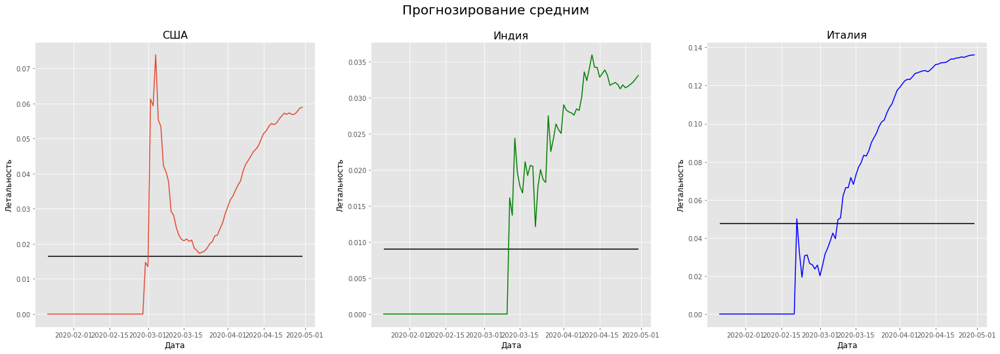

In [0]:
fig = plt.figure(figsize=(26,8))
fig.suptitle('Прогнозирование средним', fontsize=20);
ax1 = fig.add_subplot(131);
ax1.set_title('США', fontsize=16);
ax1.plot(df_USA.Date, df_USA.Letal);
ax1.hlines(mean_USA, df_USA.Date.min(), df_USA.Date.max())
ax1.set_xlabel('Дата', fontsize = 12, color='black');
ax1.set_ylabel('Летальность', fontsize = 12, color='black');
ax2 = fig.add_subplot(132);
ax2.set_title('Индия', fontsize=16);
ax2.plot(df_India.Date, df_India.Letal, color = 'green');
ax2.hlines(mean_India, df_India.Date.min(), df_India.Date.max())
ax2.set_xlabel('Дата', fontsize = 12, color='black');
ax2.set_ylabel('Летальность', fontsize = 12, color='black');
ax3 = fig.add_subplot(133);
ax3.set_title('Италия', fontsize=16);
ax3.plot(df_Italy.Date, df_Italy.Letal, color = 'blue');
ax3.hlines(mean_Italy, df_Italy.Date.min(), df_Italy.Date.max())
ax3.set_xlabel('Дата', fontsize = 12, color='black');
ax3.set_ylabel('Летальность', fontsize = 12, color='black');

In [0]:
df_Results.iloc[0,0] = RMSE(mean_USA, df_USA_test.Letal)
df_Results.iloc[0,1] = RMSE(mean_India, df_India_test.Letal)
df_Results.iloc[0,2] = RMSE(mean_Italy, df_Italy_test.Letal)

In [0]:
df_Results.head()

,USA,India,Italy
Mean Model,0.03793017,0.02377128,0.08538953
Linear Trend Model,NaN,NaN,NaN
Exponential smoothing,NaN,NaN,NaN
Double exponential smoothing,NaN,NaN,NaN
Triple exponential smoothing,NaN,NaN,NaN


#### 2.2 Линейная модель (Linear Trend Model) 

Построим линейную зависимость между Letal и Time

In [0]:
df_USA["timeIndex"] = ((df_USA.Date - df_USA.Date.min())/np.timedelta64(1, 'D')).round(0).astype(int)
df_India["timeIndex"] = ((df_India.Date - df_India.Date.min())/np.timedelta64(1, 'D')).round(0).astype(int)
df_Italy["timeIndex"] = ((df_Italy.Date - df_Italy.Date.min())/np.timedelta64(1, 'D')).round(0).astype(int)

In [0]:
df_USA_train = df_USA.iloc[:80, :].copy()
df_India_train = df_India.iloc[:80, :].copy()
df_Italy_train = df_Italy.iloc[:80, :].copy()
df_USA_test = df_USA.iloc[80:, :].copy()
df_India_test = df_India.iloc[80:, :].copy()
df_Italy_test = df_Italy.iloc[80:, :].copy()

In [0]:
linear_USA = smfa.ols('Letal ~ timeIndex', data = df_USA_train).fit()
linear_India = smfa.ols('Letal ~ timeIndex', data = df_India_train).fit()
linear_Italy = smfa.ols('Letal ~ timeIndex', data = df_Italy_train).fit()

In [0]:
linear_USA.params

Intercept   -0.00580198
timeIndex    0.00056229
dtype: float64

In [0]:
linear_pred_USA_global = linear_USA.predict(exog=dict(timeIndex=df_USA.timeIndex))
linear_pred_India_global = linear_India.predict(exog=dict(timeIndex=df_India.timeIndex))
linear_pred_Italy_global =linear_Italy.predict(exog=dict(timeIndex=df_Italy.timeIndex))

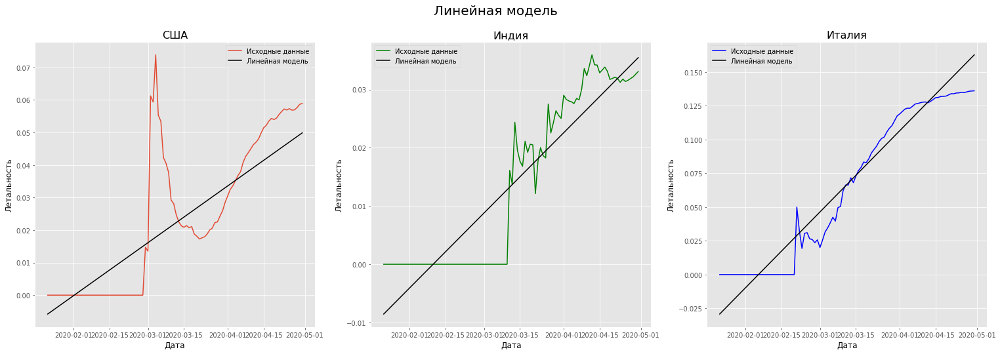

In [0]:
fig = plt.figure(figsize=(26,8))
fig.suptitle('Линейная модель', fontsize=20);
ax1 = fig.add_subplot(131);
ax1.set_title('США', fontsize=16);
ax1.plot(df_USA.Date, df_USA.Letal);
ax1.plot(df_USA.Date, linear_pred_USA_global, color = 'black')
ax1.set_xlabel('Дата', fontsize = 12, color='black');
ax1.set_ylabel('Летальность', fontsize = 12, color='black');
ax1.legend(['Исходные данные', 'Линейная модель'])
ax2 = fig.add_subplot(132);
ax2.set_title('Индия', fontsize=16);
ax2.plot(df_India.Date, df_India.Letal, color = 'green');
ax2.plot(df_India.Date, linear_pred_India_global, color = 'black')
ax2.set_xlabel('Дата', fontsize = 12, color='black');
ax2.set_ylabel('Летальность', fontsize = 12, color='black');
ax2.legend(['Исходные данные', 'Линейная модель'])
ax3 = fig.add_subplot(133);
ax3.set_title('Италия', fontsize=16);
ax3.plot(df_Italy.Date, df_Italy.Letal, color = 'blue');
ax3.plot(df_Italy.Date, linear_pred_Italy_global, color = 'black')
ax3.set_xlabel('Дата', fontsize = 12, color='black');
ax3.set_ylabel('Летальность', fontsize = 12, color='black');
ax3.legend(['Исходные данные', 'Линейная модель']);

RMSE считаем на тесте

In [0]:
linear_pred_USA = linear_USA.predict(exog=dict(timeIndex=df_USA_test.timeIndex))
linear_pred_India = linear_India.predict(exog=dict(timeIndex=df_India_test.timeIndex))
linear_pred_Italy =linear_Italy.predict(exog=dict(timeIndex=df_Italy_test.timeIndex))

In [0]:
df_Results.iloc[1,0] = RMSE(linear_pred_USA, df_USA_test.Letal)
df_Results.iloc[1,1] = RMSE(linear_pred_India, df_India_test.Letal)
df_Results.iloc[1,2] = RMSE(linear_pred_Italy, df_Italy_test.Letal)

In [0]:
df_Results.head()

,USA,India,Italy
Mean Model,0.03793017,0.02377128,0.08538953
Linear Trend Model,0.00970586,0.00381339,0.01443728
Exponential smoothing,NaN,NaN,NaN
Double exponential smoothing,NaN,NaN,NaN
Triple exponential smoothing,NaN,NaN,NaN


#### 2.3 Экспоненциальное сглаживание (Exponential smoothing)

Попробуйте так же применить Double exponential smoothing или Triple exponential smoothing.

Exponential Smoothing

In [0]:
from statsmodels.tsa.api import SimpleExpSmoothing

In [0]:
Exp_USA = SimpleExpSmoothing(df_USA_train.Letal).fit()
Exp_India = SimpleExpSmoothing(df_India_train.Letal).fit()
Exp_Italy = SimpleExpSmoothing(df_Italy_train.Letal).fit()
Fcast_USA = Exp_USA.forecast(20)
Fcast_India = Exp_India.forecast(20)
Fcast_Italy = Exp_Italy.forecast(20)

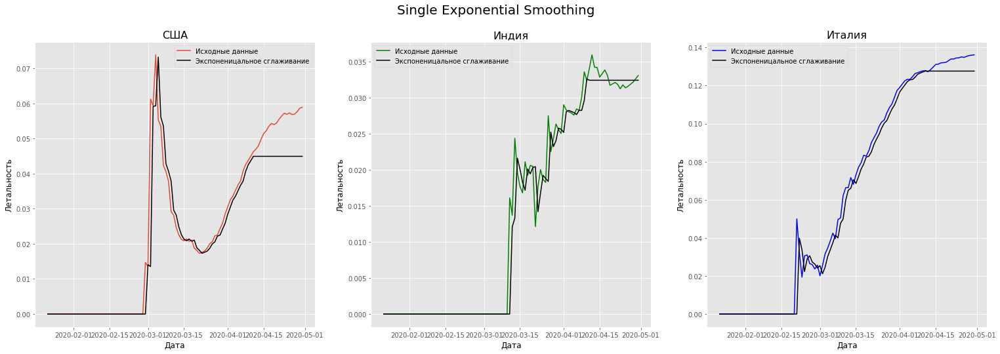

In [0]:
fig = plt.figure(figsize=(26,8))
fig.suptitle('Single Exponential Smoothing', fontsize=20);
ax1 = fig.add_subplot(131);
ax1.set_title('США', fontsize=16);
ax1.plot(df_USA.Date, df_USA.Letal);
ax1.plot(df_USA.Date, list(Exp_USA.fittedvalues)+list(Fcast_USA), color = 'black') #соединил значения из фита(80) и предсказанные(20)
ax1.set_xlabel('Дата', fontsize = 12, color='black');
ax1.set_ylabel('Летальность', fontsize = 12, color='black');
ax1.legend(['Исходные данные', 'Экспоненицальное сглаживание'])
ax2 = fig.add_subplot(132);
ax2.set_title('Индия', fontsize=16);
ax2.plot(df_India.Date, df_India.Letal, color = 'green');
ax2.plot(df_India.Date, list(Exp_India.fittedvalues)+list(Fcast_India), color = 'black') #соединил значения из фита(80) и предсказанные(20)
ax2.set_xlabel('Дата', fontsize = 12, color='black');
ax2.set_ylabel('Летальность', fontsize = 12, color='black');
ax2.legend(['Исходные данные', 'Экспоненицальное сглаживание'])
ax3 = fig.add_subplot(133);
ax3.set_title('Италия', fontsize=16);
ax3.plot(df_Italy.Date, df_Italy.Letal, color = 'blue');
ax3.plot(df_Italy.Date, list(Exp_Italy.fittedvalues)+list(Fcast_Italy), color = 'black') #соединил значения из фита(80) и предсказанные(20)
ax3.set_xlabel('Дата', fontsize = 12, color='black');
ax3.set_ylabel('Летальность', fontsize = 12, color='black');
ax3.legend(['Исходные данные', 'Экспоненицальное сглаживание']);

In [0]:
df_Results.iloc[2,0] = RMSE(Fcast_USA, df_USA_test.Letal)
df_Results.iloc[2,1] = RMSE(Fcast_India, df_India_test.Letal)
df_Results.iloc[2,2] = RMSE(Fcast_Italy, df_Italy_test.Letal)

In [0]:
df_Results.head()

,USA,India,Italy
Mean Model,0.03793017,0.02377128,0.08538953
Linear Trend Model,0.00970586,0.00381339,0.01443728
Exponential smoothing,0.00997212,0.00124188,0.00579224
Double exponential smoothing,NaN,NaN,NaN
Triple exponential smoothing,NaN,NaN,NaN


Double Exponential Smoothing -  расширение экспоненциального сглаживания, которое добавляет поддержку трендов в одномерных временных рядах.

In [0]:
from statsmodels.tsa.api import ExponentialSmoothing
D_Exp_USA = ExponentialSmoothing(df_USA_train.Letal, trend='add').fit()
D_Exp_India = ExponentialSmoothing(df_India_train.Letal, trend='add').fit()
D_Exp_Italy = ExponentialSmoothing(df_Italy_train.Letal, trend='add').fit()
DFcast_USA = D_Exp_USA.forecast(20)
DFcast_India = D_Exp_India.forecast(20)
DFcast_Italy = D_Exp_Italy.forecast(20)

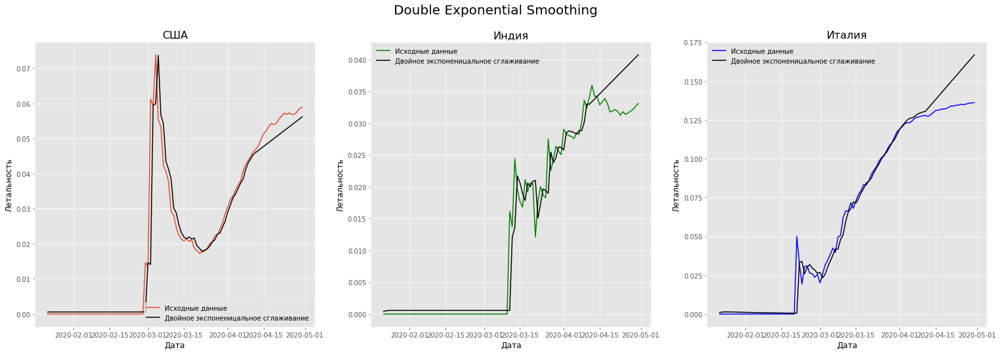

In [0]:
fig = plt.figure(figsize=(26,8))
fig.suptitle('Double Exponential Smoothing', fontsize=20);
ax1 = fig.add_subplot(131);
ax1.set_title('США', fontsize=16);
ax1.plot(df_USA.Date, df_USA.Letal);
ax1.plot(df_USA.Date, list(D_Exp_USA.fittedvalues)+list(DFcast_USA), color = 'black') #соединил значения из фита(80) и предсказанные(20)
ax1.set_xlabel('Дата', fontsize = 12, color='black');
ax1.set_ylabel('Летальность', fontsize = 12, color='black');
ax1.legend(['Исходные данные', 'Двойное экспоненицальное сглаживание'])
ax2 = fig.add_subplot(132);
ax2.set_title('Индия', fontsize=16);
ax2.plot(df_India.Date, df_India.Letal, color = 'green');
ax2.plot(df_India.Date, list(D_Exp_India.fittedvalues)+list(DFcast_India), color = 'black') #соединил значения из фита(80) и предсказанные(20)
ax2.set_xlabel('Дата', fontsize = 12, color='black');
ax2.set_ylabel('Летальность', fontsize = 12, color='black');
ax2.legend(['Исходные данные', 'Двойное экспоненицальное сглаживание'])
ax3 = fig.add_subplot(133);
ax3.set_title('Италия', fontsize=16);
ax3.plot(df_Italy.Date, df_Italy.Letal, color = 'blue');
ax3.plot(df_Italy.Date, list(D_Exp_Italy.fittedvalues)+list(DFcast_Italy), color = 'black') #соединил значения из фита(80) и предсказанные(20)
ax3.set_xlabel('Дата', fontsize = 12, color='black');
ax3.set_ylabel('Летальность', fontsize = 12, color='black');
ax3.legend(['Исходные данные', 'Двойное экспоненицальное сглаживание']);

In [0]:
df_Results.iloc[3,0] = RMSE(DFcast_USA, df_USA_test.Letal)
df_Results.iloc[3,1] = RMSE(DFcast_India, df_India_test.Letal)
df_Results.iloc[3,2] = RMSE(DFcast_Italy, df_Italy_test.Letal)

Triple Exponential Smoothing - расширение экспоненциального сглаживания, которое добавляет поддержку сезонности к одномерному временному ряду.

In [0]:
T_Exp_USA = ExponentialSmoothing(df_USA_train.Letal, trend='add', seasonal='add').fit()
T_Exp_India = ExponentialSmoothing(df_India_train.Letal, trend='add', seasonal='add').fit()
T_Exp_Italy = ExponentialSmoothing(df_Italy_train.Letal, trend='add', seasonal='add').fit()
TFcast_USA = T_Exp_USA.forecast(20)
TFcast_India = T_Exp_India.forecast(20)
TFcast_Italy = T_Exp_Italy.forecast(20)

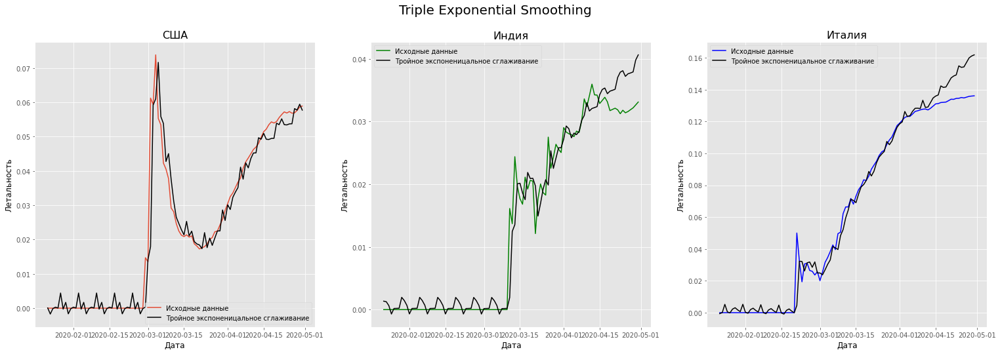

In [0]:
fig = plt.figure(figsize=(26,8))
fig.suptitle('Triple Exponential Smoothing', fontsize=20);
ax1 = fig.add_subplot(131);
ax1.set_title('США', fontsize=16);
ax1.plot(df_USA.Date, df_USA.Letal);
ax1.plot(df_USA.Date, list(T_Exp_USA.fittedvalues)+list(TFcast_USA), color = 'black') #соединил значения из фита(80) и предсказанные(20)
ax1.set_xlabel('Дата', fontsize = 12, color='black');
ax1.set_ylabel('Летальность', fontsize = 12, color='black');
ax1.legend(['Исходные данные', 'Тройное экспоненицальное сглаживание'])
ax2 = fig.add_subplot(132);
ax2.set_title('Индия', fontsize=16);
ax2.plot(df_India.Date, df_India.Letal, color = 'green');
ax2.plot(df_India.Date, list(T_Exp_India.fittedvalues)+list(TFcast_India), color = 'black') #соединил значения из фита(80) и предсказанные(20)
ax2.set_xlabel('Дата', fontsize = 12, color='black');
ax2.set_ylabel('Летальность', fontsize = 12, color='black');
ax2.legend(['Исходные данные', 'Тройное экспоненицальное сглаживание'])
ax3 = fig.add_subplot(133);
ax3.set_title('Италия', fontsize=16);
ax3.plot(df_Italy.Date, df_Italy.Letal, color = 'blue');
ax3.plot(df_Italy.Date, list(T_Exp_Italy.fittedvalues)+list(TFcast_Italy), color = 'black') #соединил значения из фита(80) и предсказанные(20)
ax3.set_xlabel('Дата', fontsize = 12, color='black');
ax3.set_ylabel('Летальность', fontsize = 12, color='black');
ax3.legend(['Исходные данные', 'Тройное экспоненицальное сглаживание']);

In [0]:
df_Results.iloc[4,0] = RMSE(TFcast_USA, df_USA_test.Letal)
df_Results.iloc[4,1] = RMSE(TFcast_India, df_India_test.Letal)
df_Results.iloc[4,2] = RMSE(TFcast_Italy, df_Italy_test.Letal)
df_Results

,USA,India,Italy
Mean Model,0.03793017,0.02377128,0.08538953
Linear Trend Model,0.00970586,0.00381339,0.01443728
Exponential smoothing,0.00997212,0.00124188,0.00579224
Double exponential smoothing,0.00352799,0.00525723,0.01807121
Triple exponential smoothing,0.00260187,0.00458570,0.01521120


#### 2.4 Скользящее среднее (MA - Moving average)

Проверим ряды на стационарность, т.к MA и ARMA требуют стационарности ряда

In [0]:
def stationary(r):
  test = smstt.adfuller(r)
  print('adf: ', test[0])
  print('p-value: ', test[1])
  print('Critical values: ', test[4])
  if test[0]> test[4]['5%']: 
      print('Есть единичные корни, ряд не стационарен')
  else:
      print('Единичных корней нет, ряд стационарен')

In [0]:
stationary(df_USA.Letal)

adf:  -1.255567992201651
p-value:  0.6492471244429211
Critical values:  {'1%': -3.5019123847798657, '5%': -2.892815255482889, '10%': -2.583453861475781}
Есть единичные корни, ряд не стационарен


In [0]:
stationary(df_India.Letal)

adf:  -0.3276992456978513
p-value:  0.92148864210197
Critical values:  {'1%': -3.50434289821397, '5%': -2.8938659630479413, '10%': -2.5840147047458037}
Есть единичные корни, ряд не стационарен


In [0]:
stationary(df_Italy.Letal)

adf:  -0.11960028305062212
p-value:  0.9474509357473061
Critical values:  {'1%': -3.4996365338407074, '5%': -2.8918307730370025, '10%': -2.5829283377617176}
Есть единичные корни, ряд не стационарен


Выбранные ряды не стационарны. Попробуем перейти к стационарным

In [0]:
df_USA['diff1'] = df_USA.Letal.diff()
df_USA.diff1.dropna(inplace=True)
stationary(df_USA.diff1)

adf:  -5.7230120287670205
p-value:  6.871864140613498e-07
Critical values:  {'1%': -3.5011373281819504, '5%': -2.8924800524857854, '10%': -2.5832749307479226}
Единичных корней нет, ряд стационарен


In [0]:
df_India['diff1'] = df_India.Letal.diff()
df_India.diff1.dropna(inplace=True)
stationary(df_India.diff1)

adf:  -3.8125034488686196
p-value:  0.002781947996769078
Critical values:  {'1%': -3.50434289821397, '5%': -2.8938659630479413, '10%': -2.5840147047458037}
Единичных корней нет, ряд стационарен


In [0]:
df_Italy['diff1'] = df_Italy.Letal.diff()
df_Italy.diff1.dropna(inplace=True)
stationary(df_Italy.diff1)

adf:  -10.03036853530886
p-value:  1.5909241730137235e-17
Critical values:  {'1%': -3.4996365338407074, '5%': -2.8918307730370025, '10%': -2.5829283377617176}
Единичных корней нет, ряд стационарен


Мы видим, что достаточно первых diff-ов, чтобы получить стационарные ряды.

In [0]:
df_USA_train = df_USA.iloc[:80, :].copy()
df_India_train = df_India.iloc[:80, :].copy()
df_Italy_train = df_Italy.iloc[:80, :].copy()
df_USA_train.diff1.dropna(inplace=True)
df_India_train.diff1.dropna(inplace=True)
df_Italy_train.diff1.dropna(inplace=True)
df_USA_test = df_USA.iloc[80:, :].copy()
df_India_test = df_India.iloc[80:, :].copy()
df_Italy_test = df_Italy.iloc[80:, :].copy()

Следующая функция универсальна для пунктов MA, AR, ARMA. В функции предусмотрена обратная к diff операция для предикта. 

In [0]:
from statsmodels.tools.sm_exceptions import ConvergenceWarning, HessianInversionWarning
warnings.simplefilter('ignore', ConvergenceWarning)
warnings.simplefilter('ignore', HessianInversionWarning)

In [0]:
from statsmodels.tsa.arima_model import ARMA

def ARMA_hype(ar=1, ma=1, title='Moving Average', legend='Скользящее среднее', trans=False): #ar=p, ma=q, b=disp(True,False), r-series
  ARMA_USA = ARMA(df_USA_train.diff1, order=(ar, ma)).fit(disp=-1, transparams=trans)
  ARMA_India = ARMA(df_India_train.diff1, order=(ar, ma)).fit(disp=-1, transparams=trans)
  ARMA_Italy = ARMA(df_Italy_train.diff1, order=(ar, ma)).fit(disp=-1, transparams=trans)
  #undiff s-смещение(при дифференцировании потеряли константу)
  s_USA = np.mean(df_USA_train[df_USA_train.Letal>0].Letal - ARMA_USA.fittedvalues.cumsum().fillna(0)[df_USA_train.Letal>0])
  s_India = np.mean(df_India_train[df_India_train.Letal>0].Letal - ARMA_India.fittedvalues.cumsum().fillna(0)[df_India_train.Letal>0])
  s_Italy = np.mean(df_Italy_train[df_Italy_train.Letal>0].Letal - ARMA_Italy.fittedvalues.cumsum().fillna(0)[df_Italy_train.Letal>0])
  pred_USA = ARMA_USA.predict(end=99)
  pred_India = ARMA_India.predict(end=99)
  pred_Italy = ARMA_Italy.predict(end=99)
  pred1_USA = np.array(pred_USA.cumsum().fillna(pred_USA))+s_USA
  pred1_India = np.array(pred_India.cumsum().fillna(pred_India))+s_India
  pred1_Italy = np.array(pred_Italy.cumsum().fillna(pred_Italy))+s_Italy
  ##
  fig = plt.figure(figsize=(26,8))
  fig.suptitle(title, fontsize=20);
  ax1 = fig.add_subplot(131);
  ax1.set_title('США', fontsize=16);
  ax1.plot(df_USA.Date, df_USA.Letal);
  ax1.plot(df_USA.Date, pred1_USA, color = 'black') 
  ax1.set_xlabel('Дата', fontsize = 12, color='black');
  ax1.set_ylabel('Летальность', fontsize = 12, color='black');
  ax1.legend(['Исходные данные', legend])
  ax2 = fig.add_subplot(132);
  ax2.set_title('Индия', fontsize=16);
  ax2.plot(df_India.Date, df_India.Letal, color = 'green');
  ax2.plot(df_India.Date, pred1_India, color = 'black') 
  ax2.set_xlabel('Дата', fontsize = 12, color='black');
  ax2.set_ylabel('Летальность', fontsize = 12, color='black');
  ax2.legend(['Исходные данные', legend])
  ax3 = fig.add_subplot(133);
  ax3.set_title('Италия', fontsize=16);
  ax3.plot(df_Italy.Date, df_Italy.Letal, color = 'blue');
  ax3.plot(df_Italy.Date, pred1_Italy, color = 'black') 
  ax3.set_xlabel('Дата', fontsize = 12, color='black');
  ax3.set_ylabel('Летальность', fontsize = 12, color='black');
  ax3.legend(['Исходные данные', legend]);
  return [pred1_USA[80:], pred1_India[80:], pred1_Italy[80:]] #последние 20 - тест

Поэксперементируйте с гиперпараметрами модели.

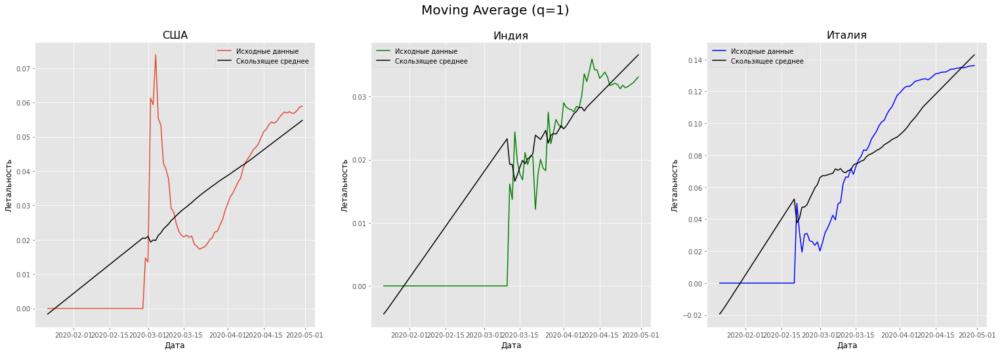

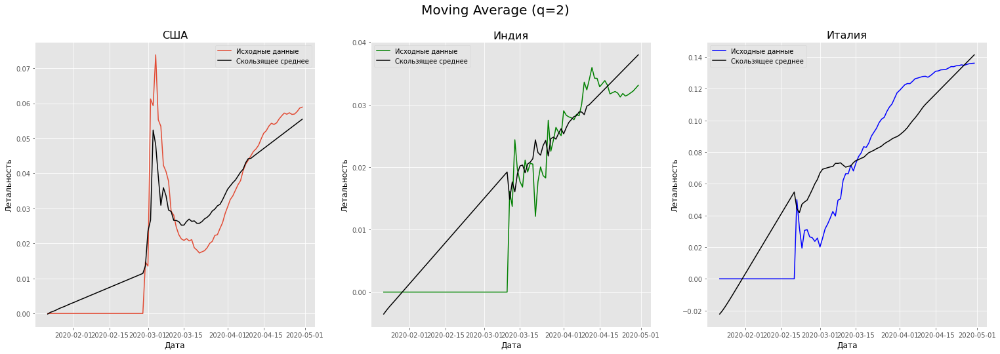

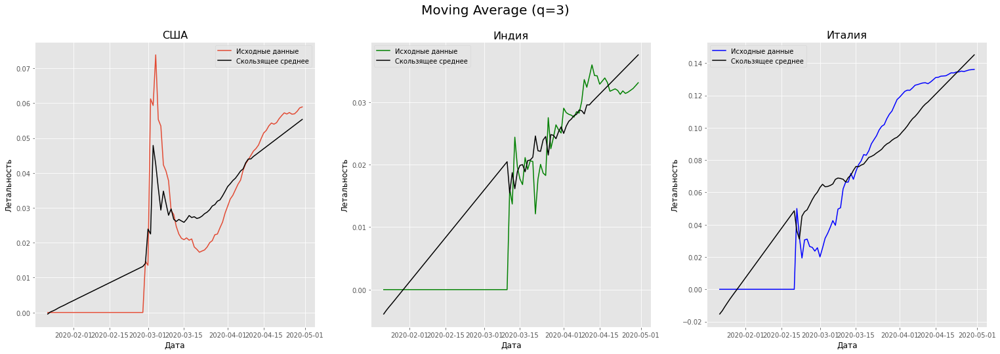

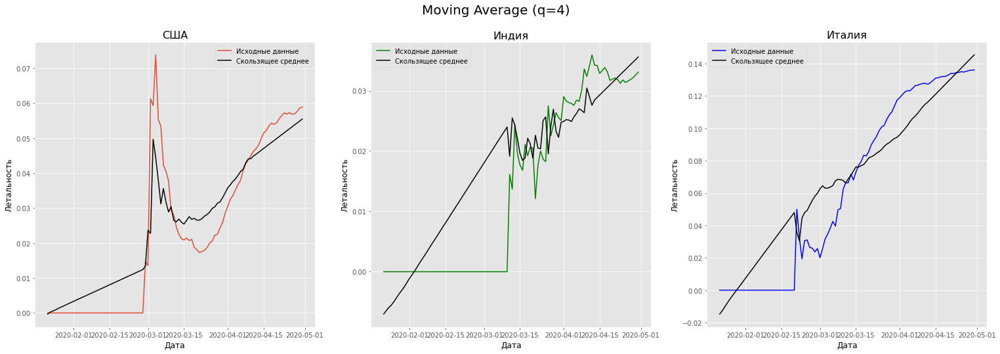

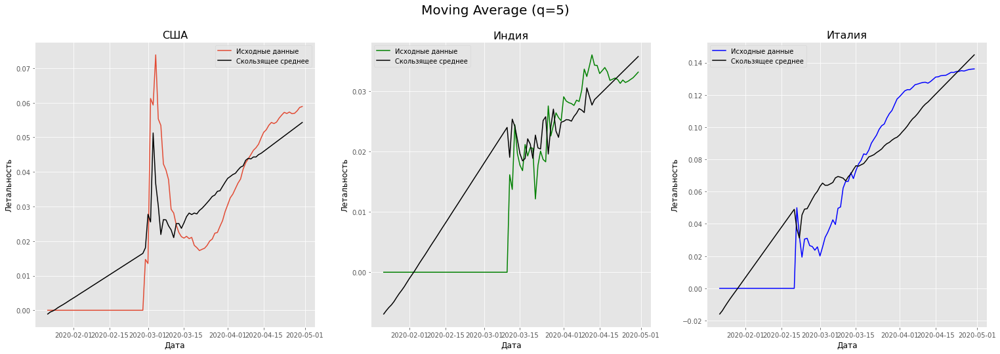

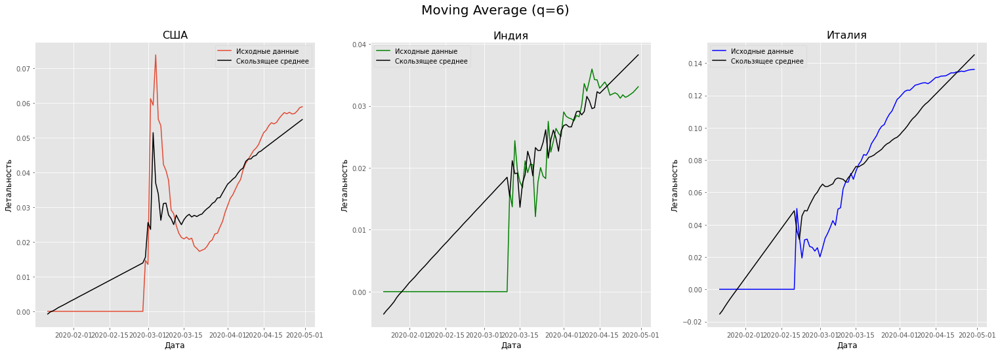

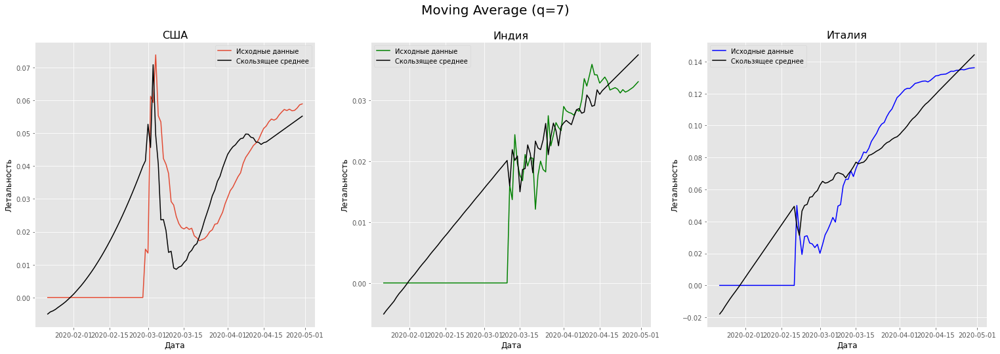

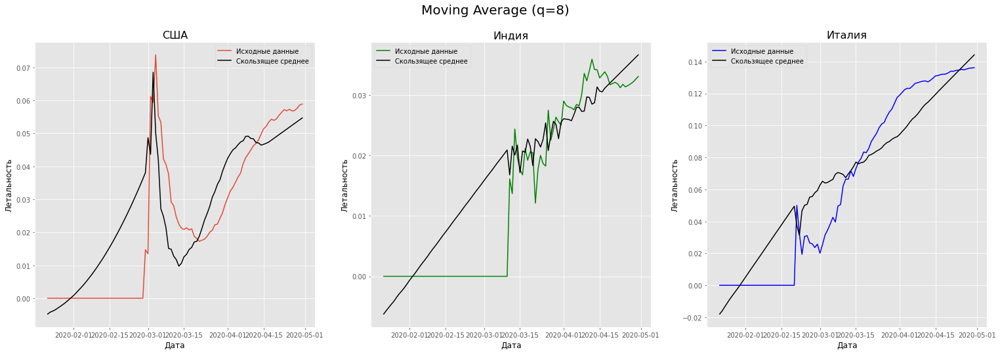

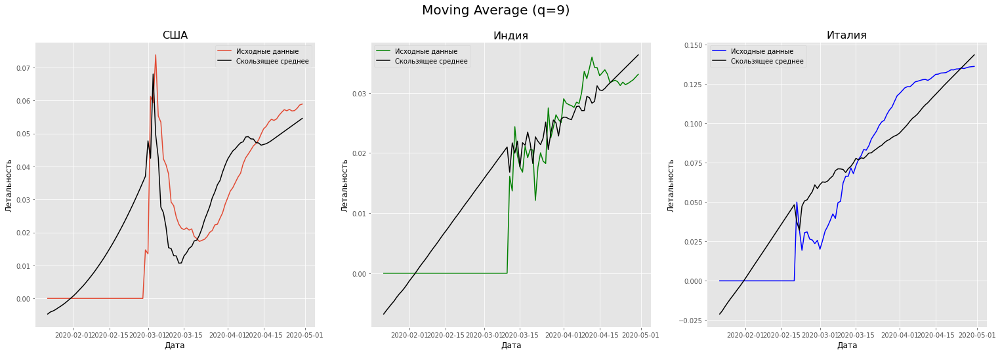

In [0]:
RMSEs=list()
for q in range(1,10):
    x = ARMA_hype(ar=0, ma=q, title='Moving Average (q=%s)'%q)
    f=RMSE(x[0], df_USA_test.Letal)
    f1=RMSE(x[1], df_India_test.Letal)
    f2=RMSE(x[2], df_Italy_test.Letal)
    RMSEs.append([f,f1,f2,q])

In [0]:
m = 1
best = list()
for i in RMSEs:
  if sum(i[:3]) < m:
    m = sum(i[:3])
    best=i

In [0]:
df_Results.loc['Moving Average (q=%s)'%best[3]] = best[:3]
df_Results

,USA,India,Italy
Mean Model,0.03793017,0.02377128,0.08538953
Linear Trend Model,0.00970586,0.00381339,0.01443728
Exponential smoothing,0.00997212,0.00124188,0.00579224
Double exponential smoothing,0.00352799,0.00525723,0.01807121
Triple exponential smoothing,0.00260187,0.00458570,0.01521120
Moving Average (q=4),0.00419187,0.00349139,0.00722389


#### 2.5 Авторегрессионная модель (AR - Autoregressive model)

Поэксперементируйте с гиперпараметрами модели.

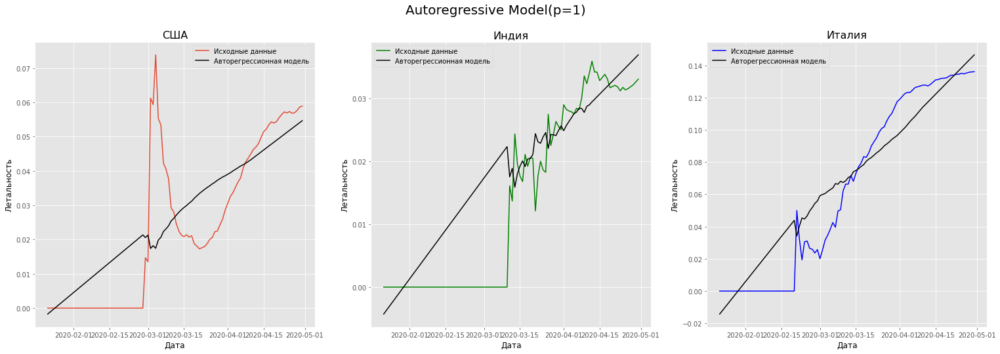

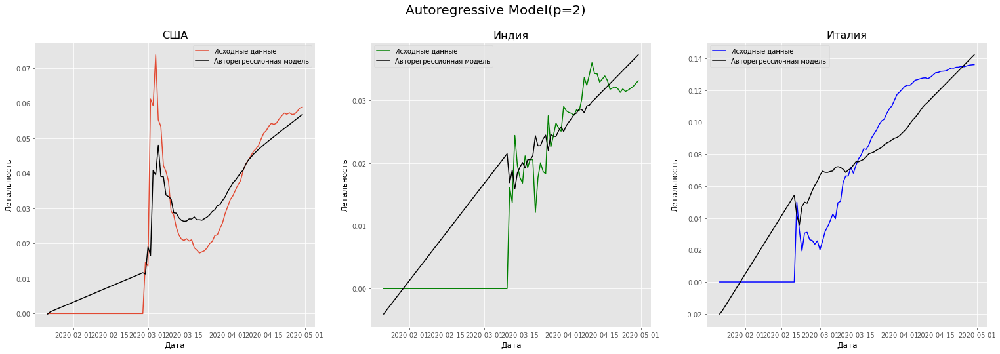

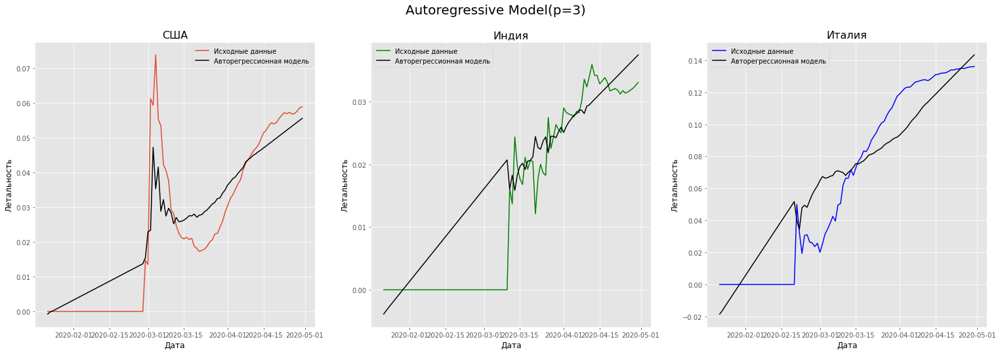

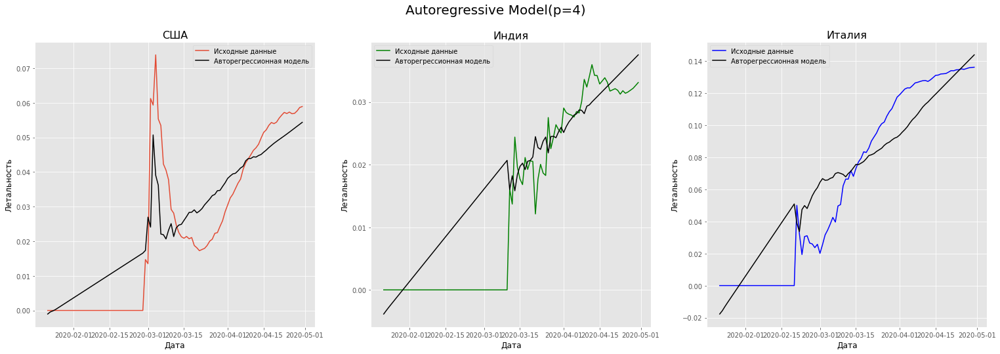

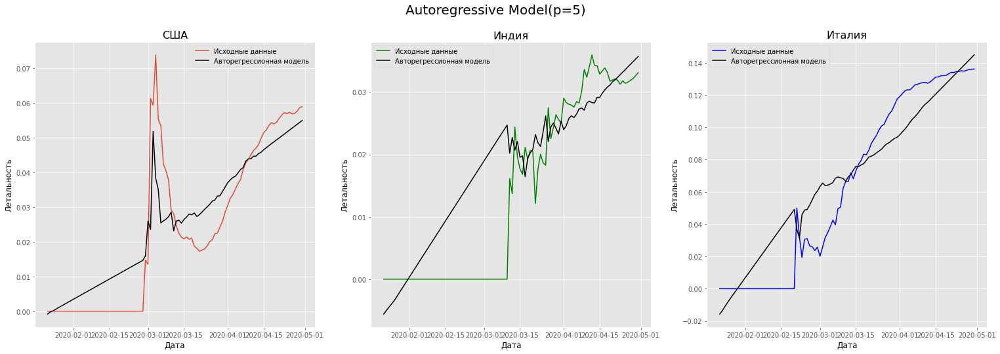

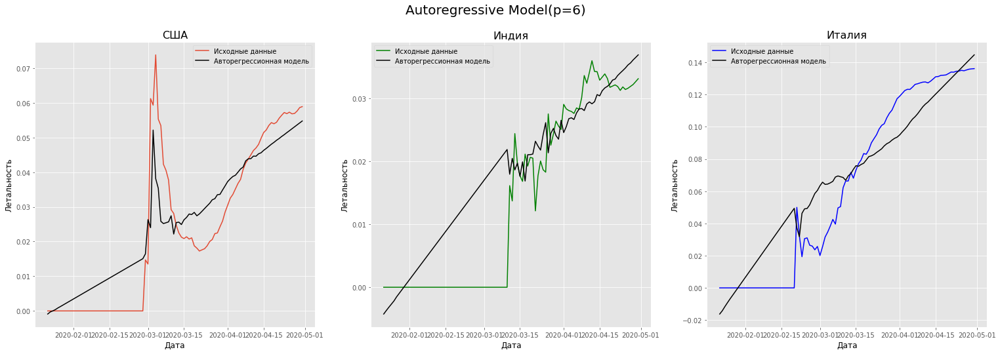

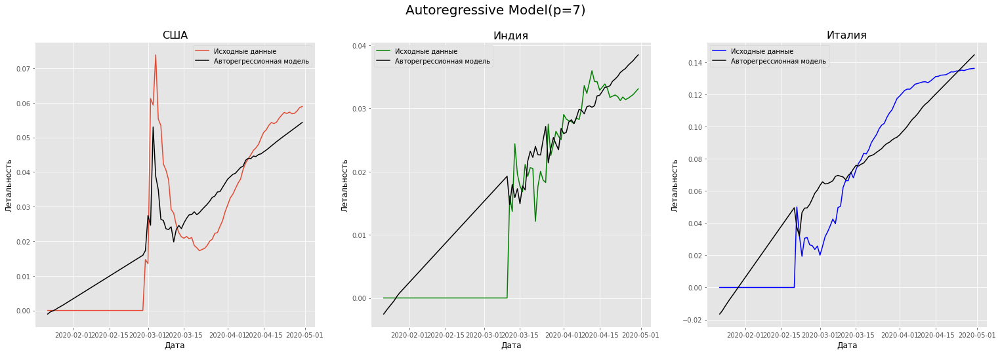

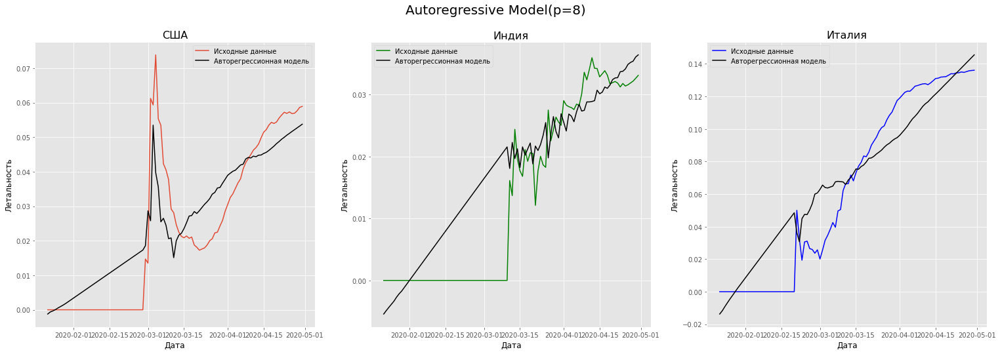

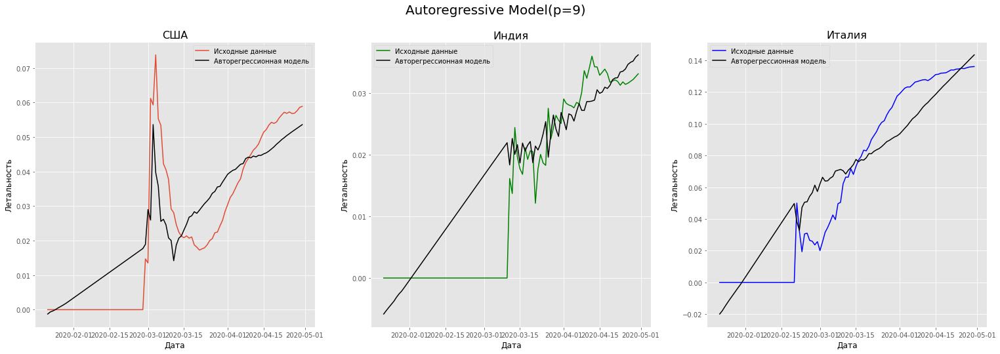

In [0]:
RMSEs=list()
for p in range(1,10):
  x = ARMA_hype(ar=p, ma=0, title='Autoregressive Model(p=%s)'%p, legend='Авторегрессионная модель')
  f=RMSE(x[0], df_USA_test.Letal)
  f1=RMSE(x[1], df_India_test.Letal)
  f2=RMSE(x[2], df_Italy_test.Letal)
  RMSEs.append([f,f1,f2,p])

In [0]:
m = 1
best = list()
for i in RMSEs:
  if sum(i[:3]) < m:
    m = sum(i[:3])
    best=i

In [0]:
df_Results.loc['AutoRegressive (p=%s)'%best[3]] = best[:3]
df_Results

,USA,India,Italy
Mean Model,0.03793017,0.02377128,0.08538953
Linear Trend Model,0.00970586,0.00381339,0.01443728
Exponential smoothing,0.00997212,0.00124188,0.00579224
Double exponential smoothing,0.00352799,0.00525723,0.01807121
Triple exponential smoothing,0.00260187,0.00458570,0.01521120
Moving Average (q=4),0.00419187,0.00349139,0.00722389
AutoRegressive (p=1),0.00506732,0.00335771,0.00696895


#### 2.6 ARMA

Поэксперементируйте с гиперпараметрами модели.

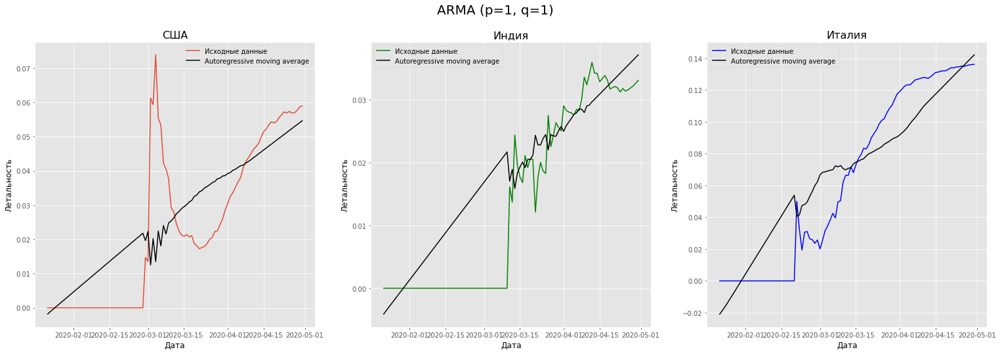

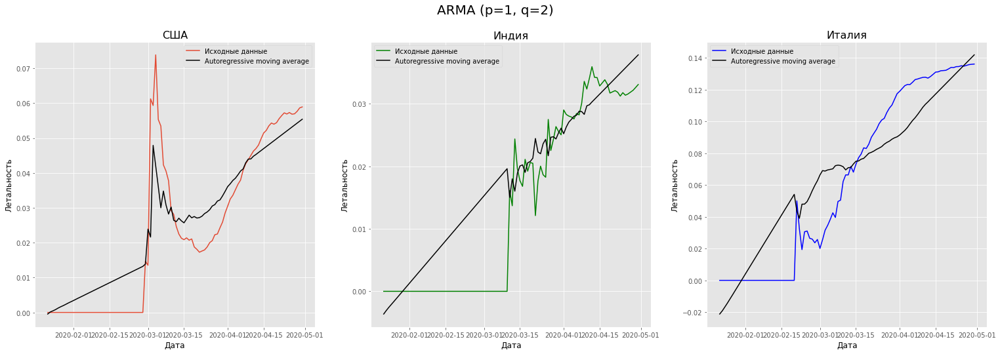

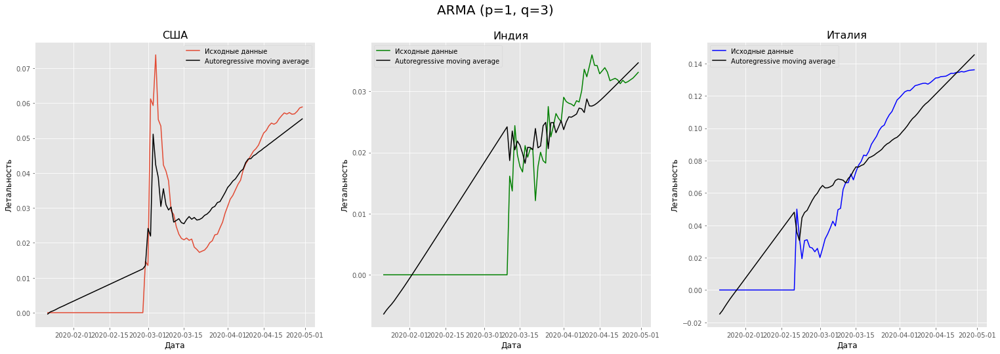

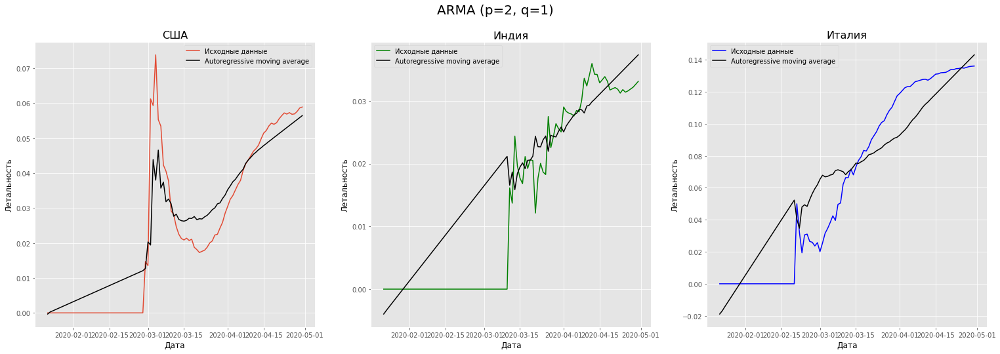

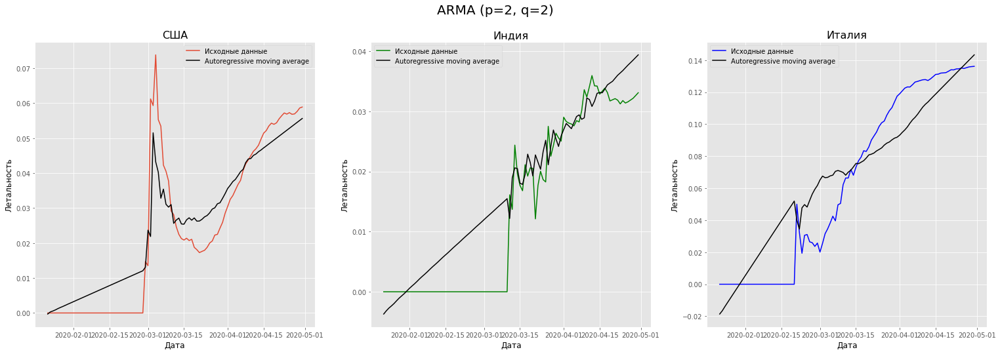

...

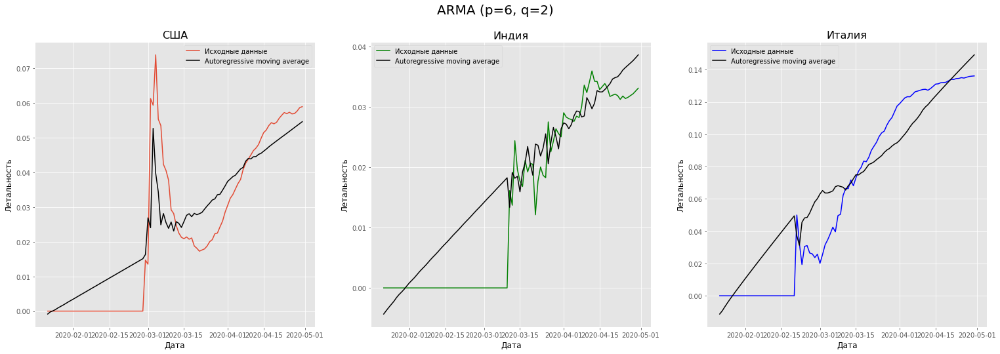

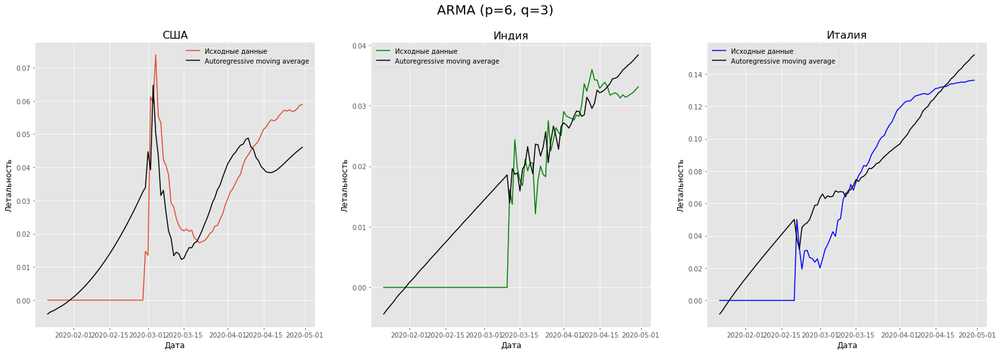

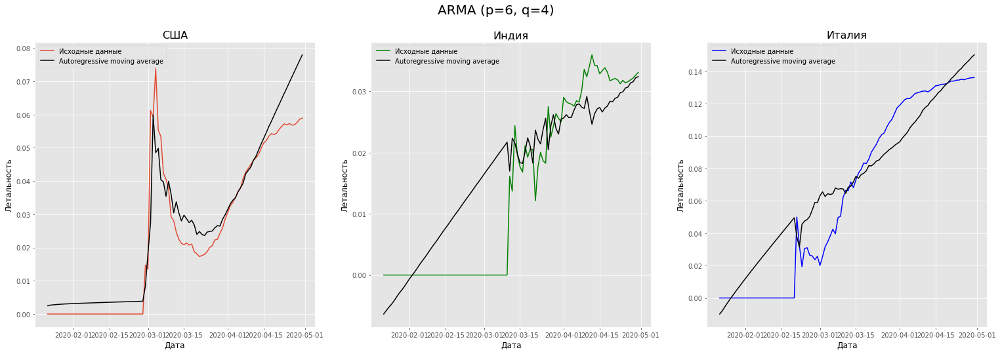

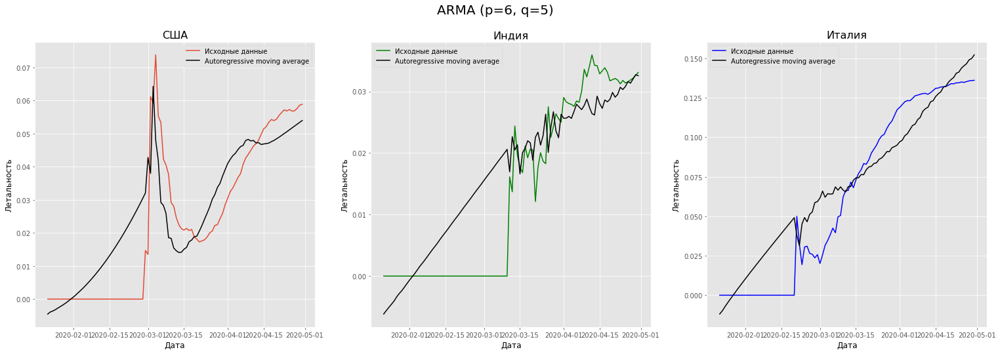

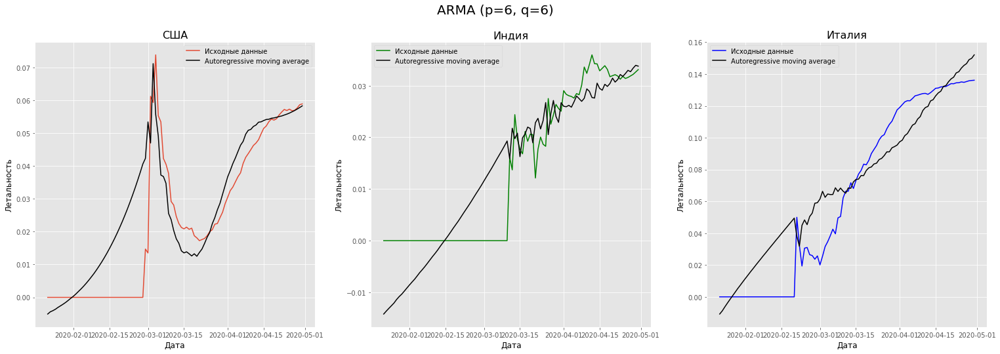

In [0]:
RMSEs=list()
for p in range(1,7):
  for q in range(1,7):
    try:
      x = ARMA_hype(ar=p, ma=q, title='ARMA (p=%s, q=%s)'%(p,q), legend='Autoregressive moving average')
      f=RMSE(x[0], df_USA_test.Letal)
      f1=RMSE(x[1], df_India_test.Letal)
      f2=RMSE(x[2], df_Italy_test.Letal)
      RMSEs.append([f,f1,f2,p,q])
    except:
      continue

In [0]:
m = 1
best = list()
for i in RMSEs:
  if sum(i[:3]) < m:
    m = sum(i[:3])
    best=i

In [0]:
df_Results.loc['ARMA (p=%s q=%s)'%(best[3], best[4])] = best[:3]
df_Results

,USA,India,Italy
Mean Model,0.03793017,0.02377128,0.08538953
Linear Trend Model,0.00970586,0.00381339,0.01443728
Exponential smoothing,0.00997212,0.00124188,0.00579224
Double exponential smoothing,0.00352799,0.00525723,0.01807121
Triple exponential smoothing,0.00260187,0.00458570,0.01521120
Moving Average (q=4),0.00419187,0.00349139,0.00722389
AutoRegressive (p=1),0.00506732,0.00335771,0.00696895
ARMA (p=6 q=6),0.00249671,0.00330891,0.00803839


#### 2.7 Интегрированная модель авторегрессии — скользящего среднего (Auto Regressive Integrated Moving Average)

ARIMA является расширением моделей ARMA для нестационарных временных рядов, которые можно сделать стационарными взятием разностей некоторого порядка от исходного временного ряда (так называемые интегрированные или разностно-стационарные временные ряды)

In [0]:
from statsmodels.tsa.arima_model import ARIMA
def ARIMA_hype(ar=1, ma=1, d=0, b=-1, title='ARIMA', legend='Интегрированная модель авторегрессии — скользящего среднего', typ = 'levels'): #ar=p, ma=q, d=d, b=disp(True,False), r-series
  ARIMA_USA = ARIMA(df_USA_train.Letal, order=(ar, d, ma)).fit(disp=b)
  ARIMA_India = ARIMA(df_India_train.Letal, order=(ar, d, ma)).fit(disp=b)
  ARIMA_Italy = ARIMA(df_Italy_train.Letal, order=(ar, d, ma)).fit(disp=b)
  pred_USA = ARIMA_USA.predict(end=len(df_USA)+d-1, typ=typ)
  pred_India = ARIMA_India.predict(end=len(df_India)+d-1, typ=typ)
  pred_Italy = ARIMA_Italy.predict(end=len(df_Italy)+d-1, typ=typ)
  fig = plt.figure(figsize=(26,8))
  fig.suptitle(title, fontsize=20);
  ax1 = fig.add_subplot(131);
  ax1.set_title('США', fontsize=16);
  ax1.plot(df_USA.Date, df_USA.Letal);
  ax1.plot(df_USA.Date, pred_USA, color = 'black') 
  ax1.set_xlabel('Дата', fontsize = 12, color='black');
  ax1.set_ylabel('Летальность', fontsize = 12, color='black');
  ax1.legend(['Исходные данные', legend])
  ax2 = fig.add_subplot(132);
  ax2.set_title('Индия', fontsize=16);
  ax2.plot(df_India.Date, df_India.Letal, color = 'green');
  ax2.plot(df_India.Date, pred_India, color = 'black') 
  ax2.set_xlabel('Дата', fontsize = 12, color='black');
  ax2.set_ylabel('Летальность', fontsize = 12, color='black');
  ax2.legend(['Исходные данные', legend])
  ax3 = fig.add_subplot(133);
  ax3.set_title('Италия', fontsize=16);
  ax3.plot(df_Italy.Date, df_Italy.Letal, color = 'blue');
  ax3.plot(df_Italy.Date, pred_Italy, color = 'black') 
  ax3.set_xlabel('Дата', fontsize = 12, color='black');
  ax3.set_ylabel('Летальность', fontsize = 12, color='black');
  ax3.legend(['Исходные данные', legend]);
  return [pred_USA[80:], pred_India[80:], pred_Italy[80:]]

d=2

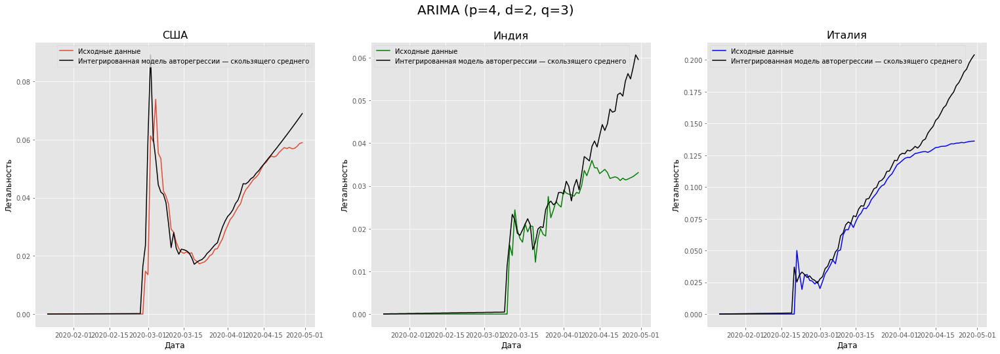

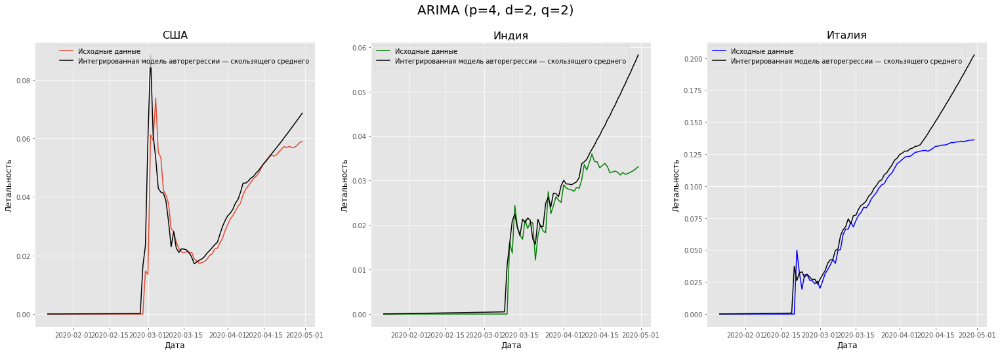

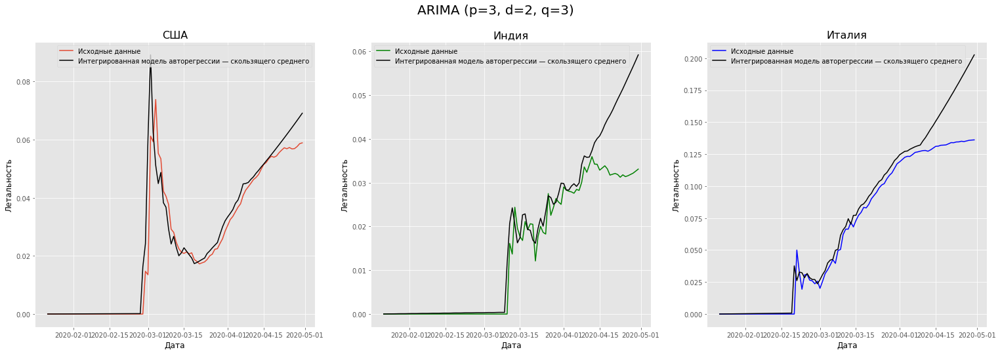

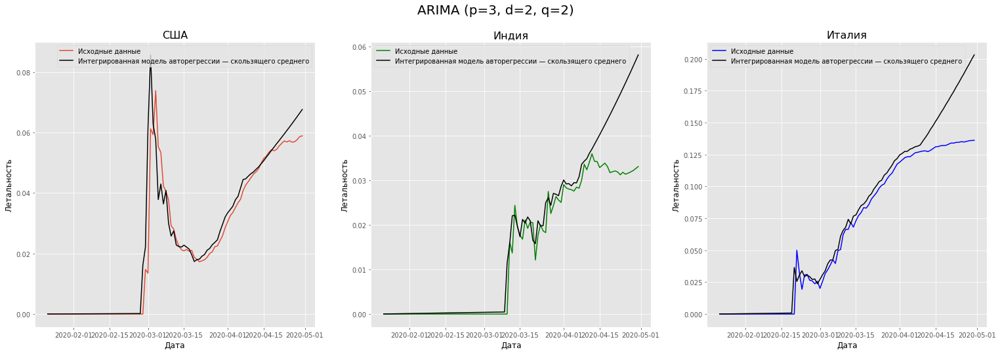

In [0]:
RMSEs = list()
for p in range(4,2,-1):
  for q in range(3,1,-1):
    x = ARIMA_hype(ar=p, d=2, ma=q, title='ARIMA (p=%s, d=2, q=%s)'%(p,q))
    f=RMSE(x[0], df_USA_test.Letal)
    f1=RMSE(x[1], df_India_test.Letal)
    f2=RMSE(x[2], df_Italy_test.Letal)
    RMSEs.append([f,f1,f2,p,2,q])

d=1

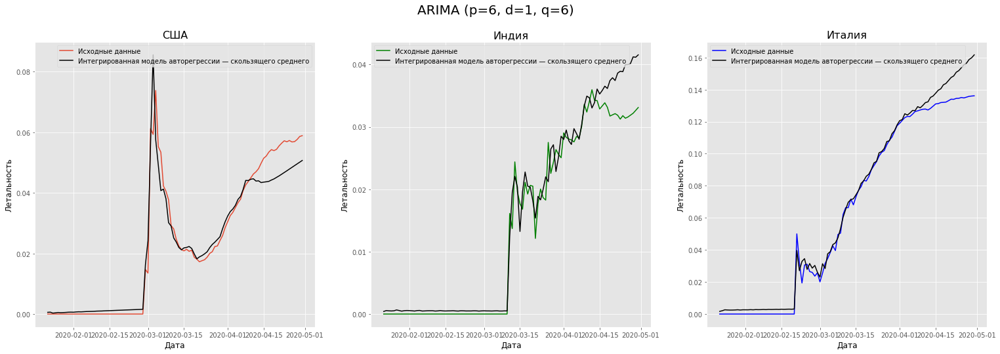

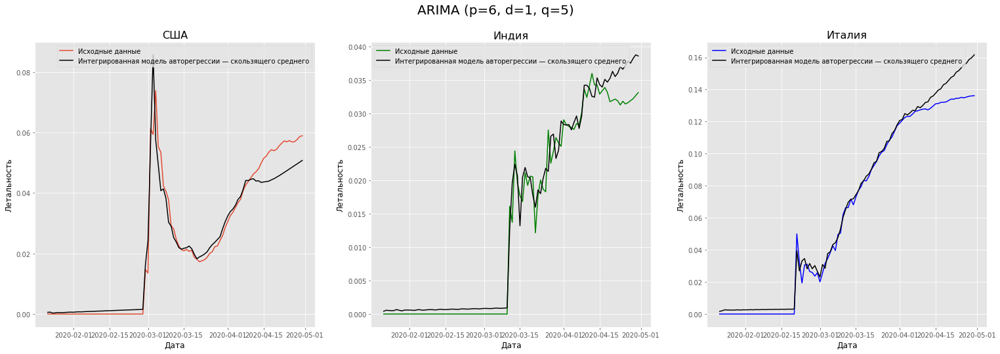

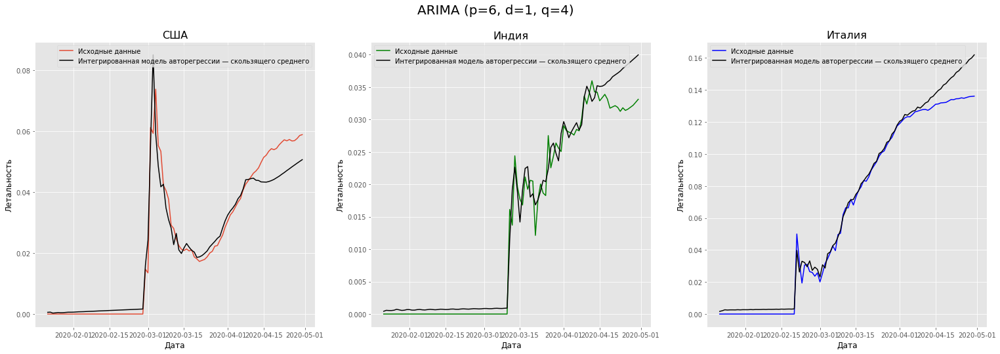

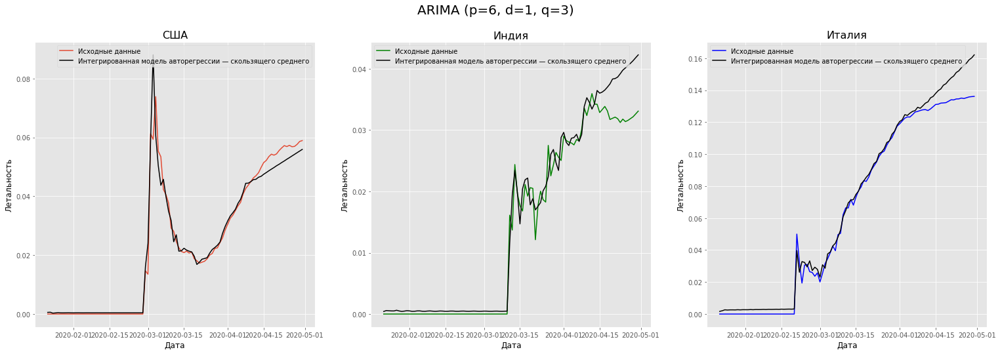

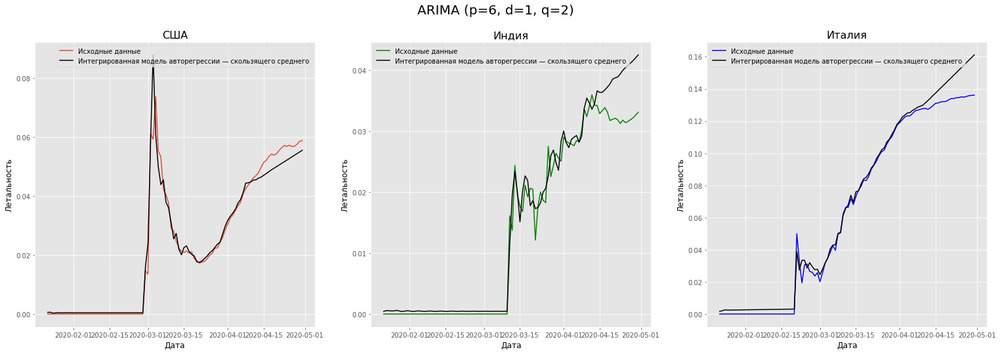

...

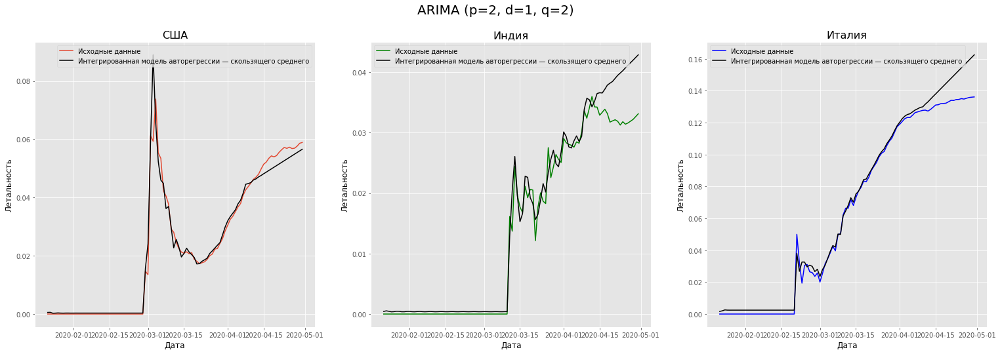

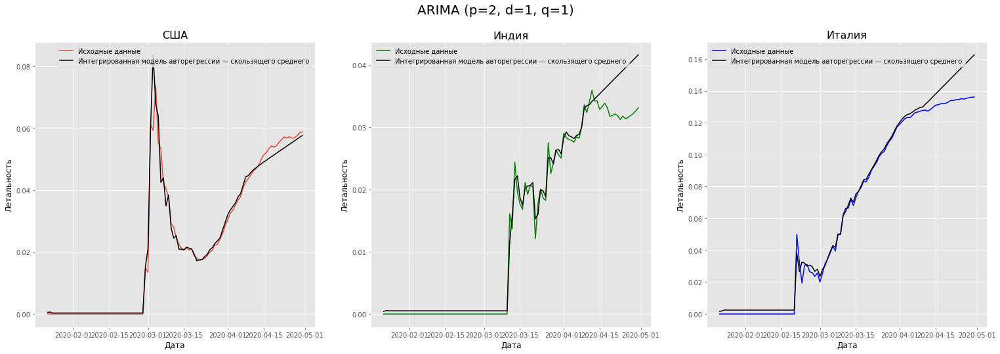

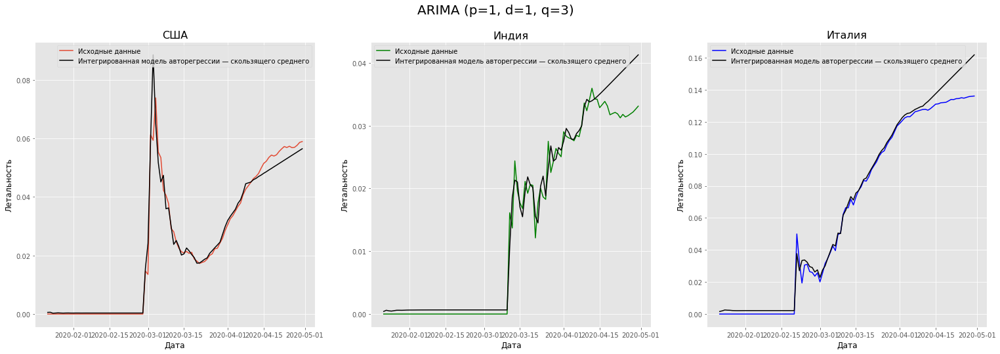

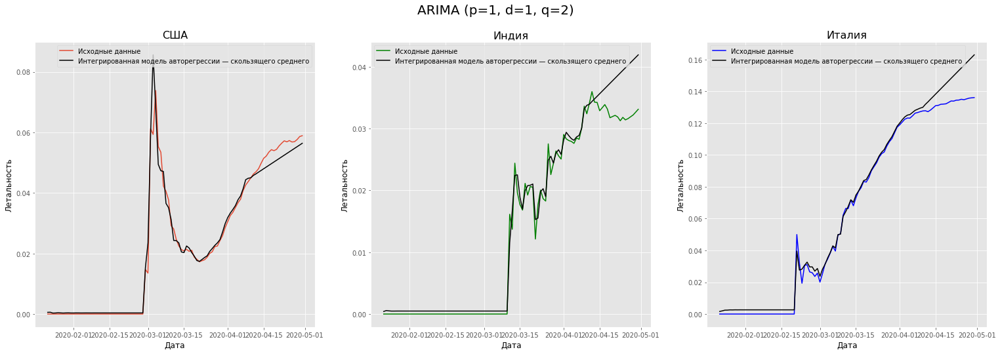

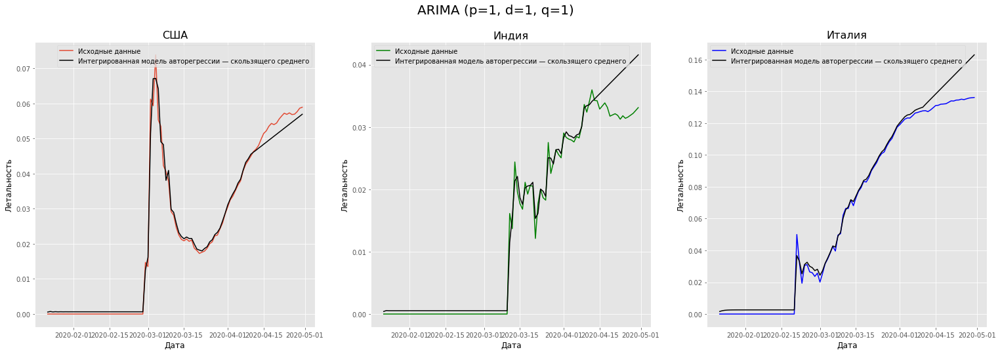

In [0]:
for p in range(6,0,-1):
  for q in range(6,0,-1):
    try:
      x = ARIMA_hype(ar=p, d=1, ma=q, title='ARIMA (p=%s, d=1, q=%s)'%(p,q))
      f=RMSE(x[0], df_USA_test.Letal)
      f1=RMSE(x[1], df_India_test.Letal)
      f2=RMSE(x[2], df_Italy_test.Letal)
      RMSEs.append([f,f1,f2,p,1,q])
    except:
      continue

In [0]:
m = 1
best = list()
for i in RMSEs:
  if sum(i[:3]) < m:
    m = sum(i[:3])
    best=i

In [0]:
df_Results.loc['ARIMA (p=%s d=%s q=%s)'%(best[3], best[4], best[5])] = best[:3]
df_Results

,USA,India,Italy
Mean Model,0.03793017,0.02377128,0.08538953
Linear Trend Model,0.00970586,0.00381339,0.01443728
Exponential smoothing,0.00997212,0.00124188,0.00579224
Double exponential smoothing,0.00352799,0.00525723,0.01807121
Triple exponential smoothing,0.00260187,0.00458570,0.01521120
Moving Average (q=4),0.00419187,0.00349139,0.00722389
AutoRegressive (p=1),0.00506732,0.00335771,0.00696895
ARMA (p=6 q=6),0.00249671,0.00330891,0.00803839
ARIMA (p=4 d=1 q=1),0.00455890,0.00393932,0.01391211


2.8 SARIMA

SARIMA- сезонная модель ARIMA

In [0]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
#trend can be{‘n’,’c’,’t’,’ct’} 
def SARIMA_hype(ar=1, ma=1, s=1, d=0, tr='n', title='SARIMA', legend='Сезонная интегрированная модель авторегрессии — скользящего среднего', typ = 'levels'): #ar=p, ma=q, d=d, s=seasonality, tr-trend
  SARIMA_USA = SARIMAX(df_USA_train.Letal, order=(ar, d, ma), seasonal_order=(ar, d, ma, s), trend=tr).fit(disp=-1)
  SARIMA_India = SARIMAX(df_India_train.Letal, order=(ar, d, ma), seasonal_order=(ar, d, ma, s), trend=tr).fit(disp=-1)
  SARIMA_Italy = SARIMAX(df_Italy_train.Letal, order=(ar, d, ma), seasonal_order=(ar, d, ma, s), trend=tr).fit(disp=-1)
  pred_USA = SARIMA_USA.predict(end=len(df_USA)-1, typ=typ)
  pred_India = SARIMA_India.predict(end=len(df_India)-1, typ=typ)
  pred_Italy = SARIMA_Italy.predict(end=len(df_Italy)-1, typ=typ)
  pred1_USA = SARIMA_USA.predict(start=len(df_USA_train), end=len(df_USA)-1, typ=typ)
  pred1_India = SARIMA_India.predict(start=len(df_India_train), end=len(df_India)-1, typ=typ)
  pred1_Italy = SARIMA_Italy.predict(start=len(df_Italy_train), end=len(df_Italy)-1, typ=typ)
  fig = plt.figure(figsize=(26,8))
  fig.suptitle(title, fontsize=20);
  ax1 = fig.add_subplot(131);
  ax1.set_title('США', fontsize=16);
  ax1.plot(df_USA.Date, df_USA.Letal);
  ax1.plot(df_USA.Date, pred_USA, color = 'black') 
  ax1.set_xlabel('Дата', fontsize = 12, color='black');
  ax1.set_ylabel('Летальность', fontsize = 12, color='black');
  ax1.legend(['Исходные данные', legend])
  ax2 = fig.add_subplot(132);
  ax2.set_title('Индия', fontsize=16);
  ax2.plot(df_India.Date, df_India.Letal, color = 'green');
  ax2.plot(df_India.Date, pred_India, color = 'black') 
  ax2.set_xlabel('Дата', fontsize = 12, color='black');
  ax2.set_ylabel('Летальность', fontsize = 12, color='black');
  ax2.legend(['Исходные данные', legend])
  ax3 = fig.add_subplot(133);
  ax3.set_title('Италия', fontsize=16);
  ax3.plot(df_Italy.Date, df_Italy.Letal, color = 'blue');
  ax3.plot(df_Italy.Date, pred_Italy, color = 'black') 
  ax3.set_xlabel('Дата', fontsize = 12, color='black');
  ax3.set_ylabel('Летальность', fontsize = 12, color='black');
  ax3.legend(['Исходные данные', legend]);
  return [pred1_USA, pred1_India, pred1_Italy]

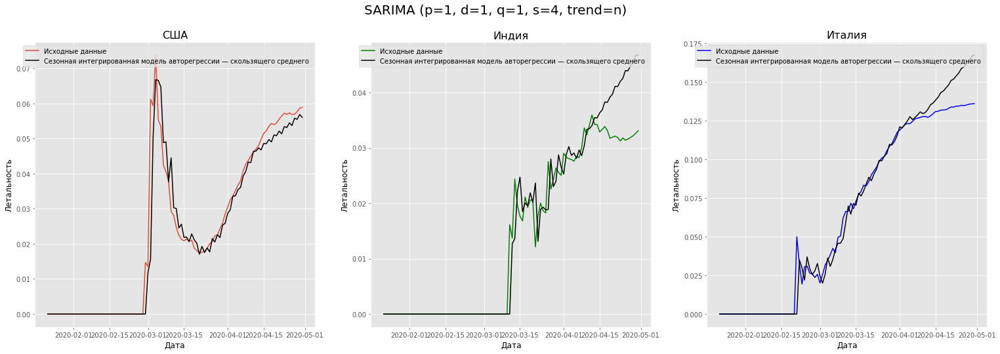

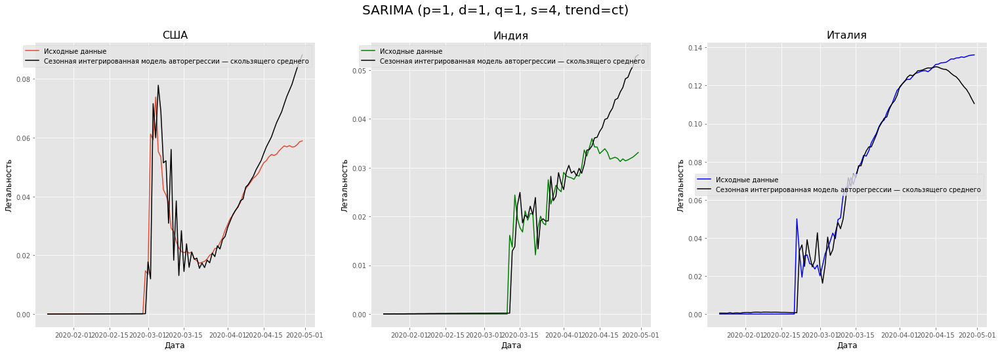

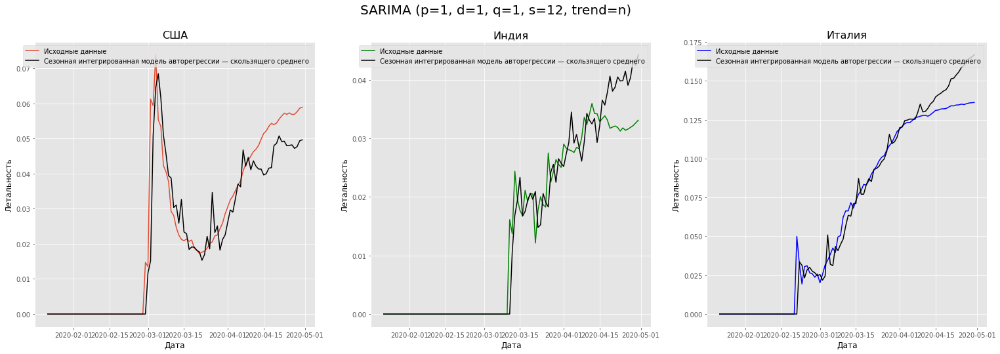

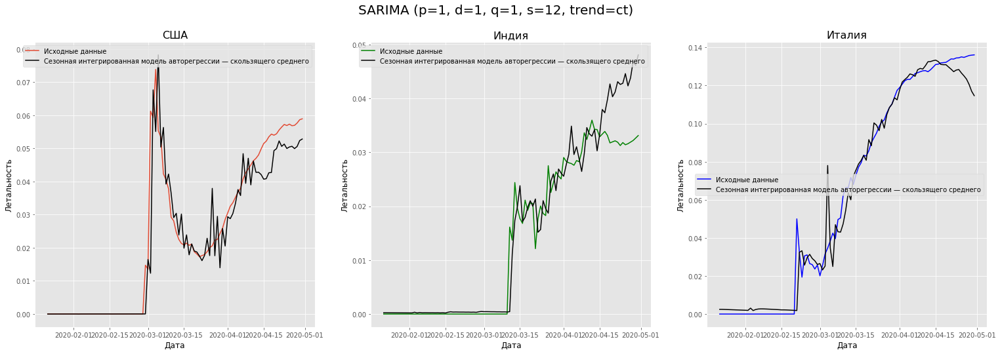

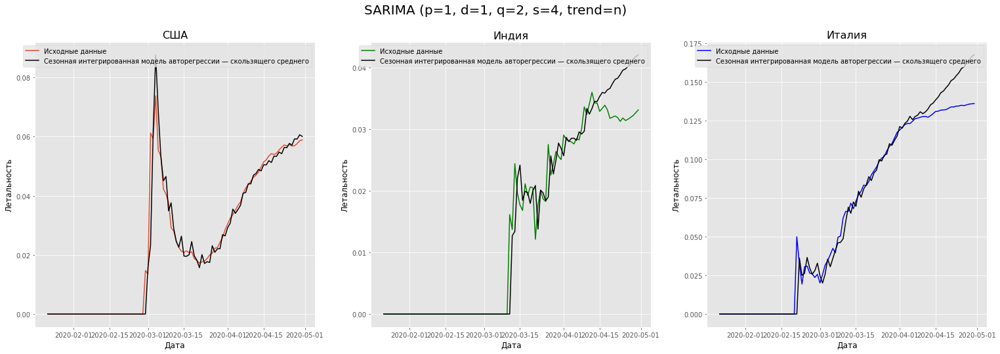

...

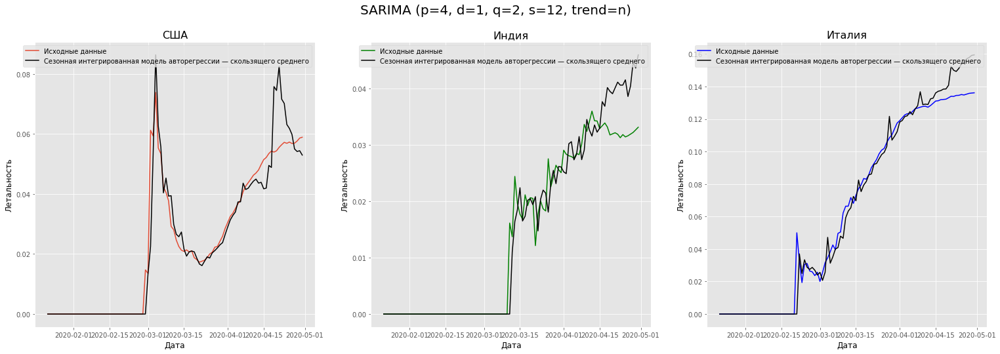

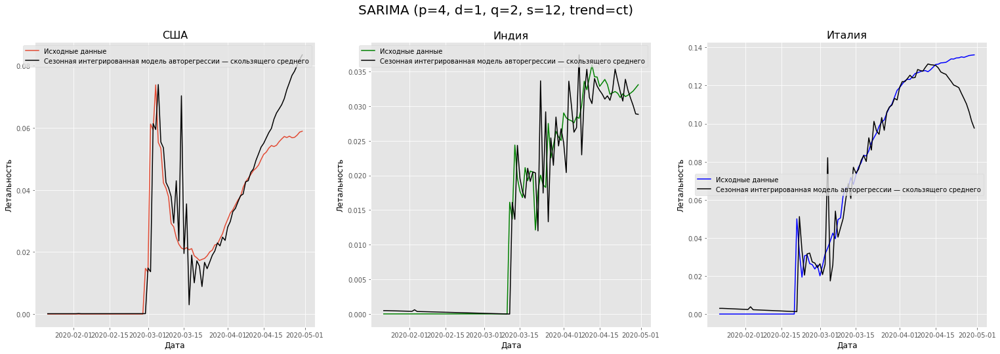

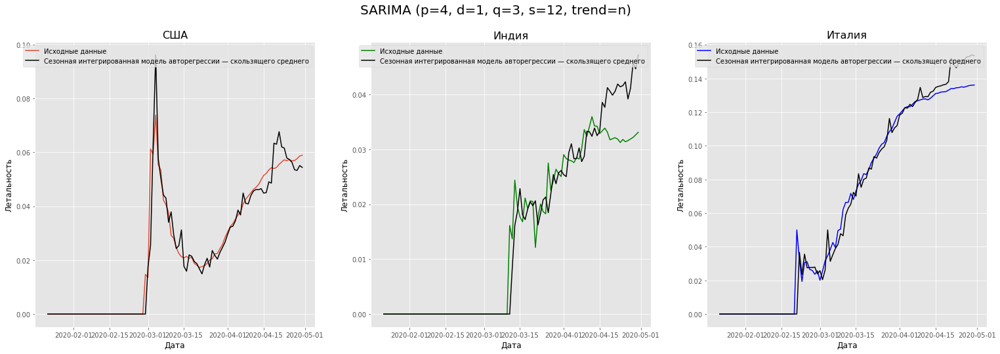

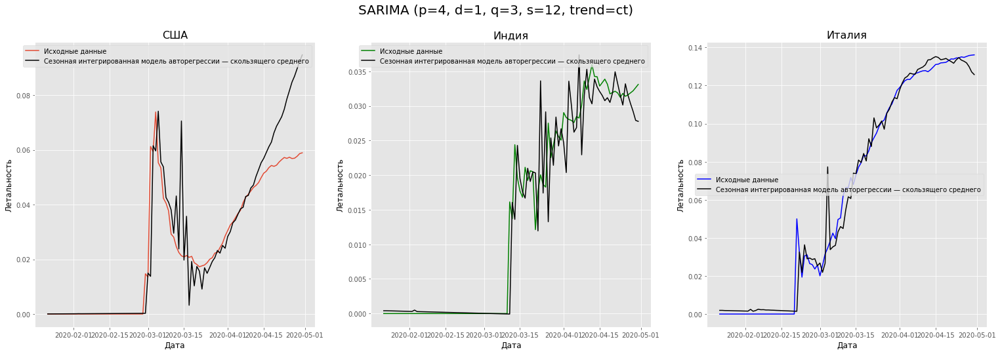

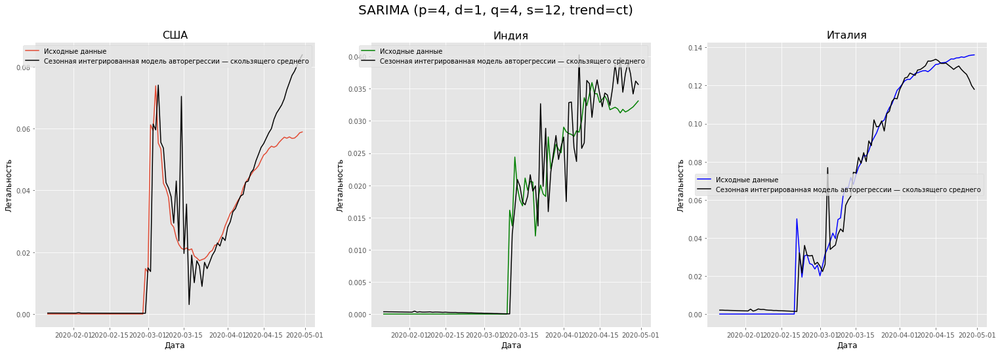

In [0]:
RMSEs = list()
for p in range(1,5):
  for q in range(1,5):
    for s in [4,12]: #12-по месяцам, 4-по кварталам
      for tr in ['n', 'ct']:
        try:
          x = SARIMA_hype(ar=p, d=1, ma=q, s=s, tr=tr, title='SARIMA (p=%s, d=1, q=%s, s=%s, trend=%s)'%(p,q,s,tr))
          f=RMSE(x[0], df_USA_test.Letal)
          f1=RMSE(x[1], df_India_test.Letal)
          f2=RMSE(x[2], df_Italy_test.Letal)
          RMSEs.append([f,f1,f2, p, 1, q, s, tr])
        except:
          continue

In [0]:
m = 1
best = list()
for i in RMSEs:
  if sum(i[:3]) < m:
    m = sum(i[:3])
    best=i

In [0]:
df_Results.loc['SARIMA (p=%s d=%s q=%s, s=%s, tr=%s)'%(best[3], best[4], best[5], best[6], best[7])] = best[:3]
df_Results

,USA,India,Italy
Mean Model,0.03793017,0.02377128,0.08538953
Linear Trend Model,0.00970586,0.00381339,0.01443728
Exponential smoothing,0.00997212,0.00124188,0.00579224
Double exponential smoothing,0.00352799,0.00525723,0.01807121
Triple exponential smoothing,0.00260187,0.00458570,0.01521120
Moving Average (q=4),0.00419187,0.00349139,0.00722389
AutoRegressive (p=1),0.00506732,0.00335771,0.00696895
ARMA (p=6 q=6),0.00249671,0.00330891,0.00803839
ARIMA (p=4 d=1 q=1),0.00455890,0.00393932,0.01391211
"SARIMA (p=2 d=1 q=3, s=12, tr=ct)",0.00613345,0.00279040,0.00374992


#### 2.9 Библиотека Prophet
Попробуйте использовать библиотеку Prophet для предсказания временного ряда. [Документация](https://facebook.github.io/prophet/docs/quick_start.html).


In [0]:
df_USA = df.loc[df['Country/Region'] == "US"][['Letal','Date']].copy()
df_India = df.loc[df['Country/Region'] == "India"][['Letal','Date']].copy()
df_Italy = df.loc[df['Country/Region'] == "Italy"][['Letal','Date']].copy()

In [0]:
df_USA.rename(columns={'Letal':'y','Date':'ds'}, inplace=True)
df_India.rename(columns={'Letal':'y','Date':'ds'}, inplace=True)
df_Italy.rename(columns={'Letal':'y','Date':'ds'}, inplace=True)

In [0]:
df_USA_train = df_USA.iloc[:80, :].copy()
df_India_train = df_India.iloc[:80, :].copy()
df_Italy_train = df_Italy.iloc[:80, :].copy()
df_USA_test = (df_USA.iloc[80:, :].copy())
df_India_test = (df_India.iloc[80:, :].copy())
df_Italy_test = (df_Italy.iloc[80:, :].copy())

In [0]:
from fbprophet import Prophet

def prophet(b): #b-seasonality(daily)
  pr_USA = Prophet(daily_seasonality=b)
  pr_India = Prophet(daily_seasonality=b)
  pr_Italy = Prophet(daily_seasonality=b)
  pr_USA.fit(df_USA_train)
  pr_India.fit(df_India_train)
  pr_Italy.fit(df_Italy_train)
  future_USA = pr_USA.make_future_dataframe(periods=20)
  future_India = pr_India.make_future_dataframe(periods=20)
  future_Italy = pr_Italy.make_future_dataframe(periods=20)
  forecast_USA = pr_USA.predict(future_USA)
  forecast_India = pr_India.predict(future_India)
  forecast_Italy = pr_Italy.predict(future_Italy)
  fig_USA = pr_USA.plot(forecast_USA, ylabel='Летальность', xlabel='Дата')
  plt.title('Prophet (USA) : Daily Seasonality = ' + str(b))
  fig_India = pr_India.plot(forecast_India, ylabel='Летальность', xlabel='Дата')
  plt.title('Prophet (India) : Daily Seasonality = ' + str(b))
  fig_Italy = pr_Italy.plot(forecast_Italy, ylabel='Летальность', xlabel='Дата')
  plt.title('Prophet (Italy) : Daily Seasonality = ' + str(b))
  return [forecast_USA.loc[80:,'yhat'].values, forecast_India.loc[80:,'yhat'].values, forecast_Italy.loc[80:,'yhat'].values]

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


0.00990899923927401 0.009406436489763902 0.033156379598097


INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.


0.009845285569733148 0.009803521182648293 0.034763140249866244


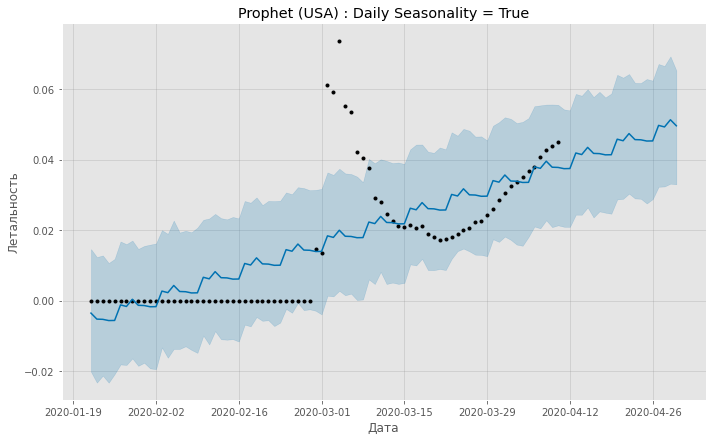

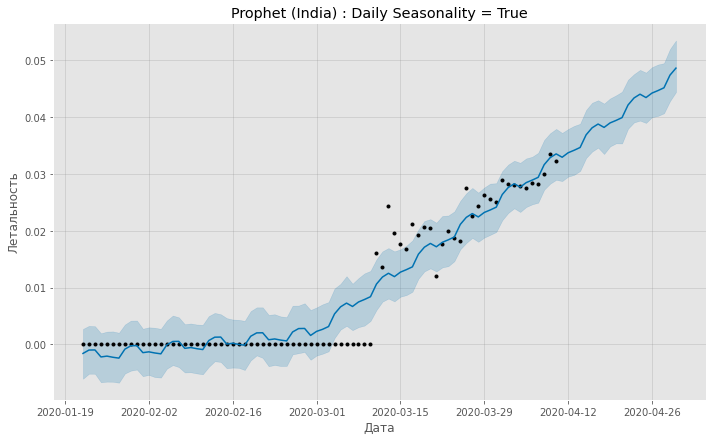

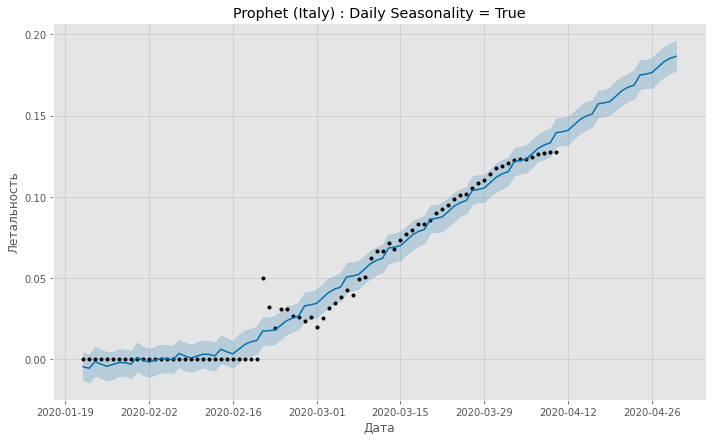

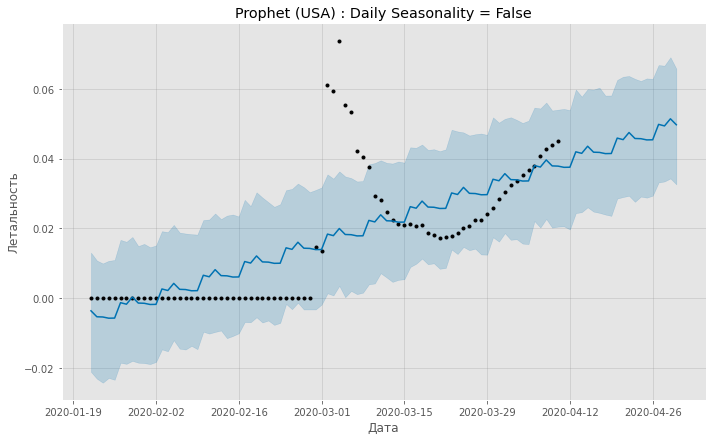

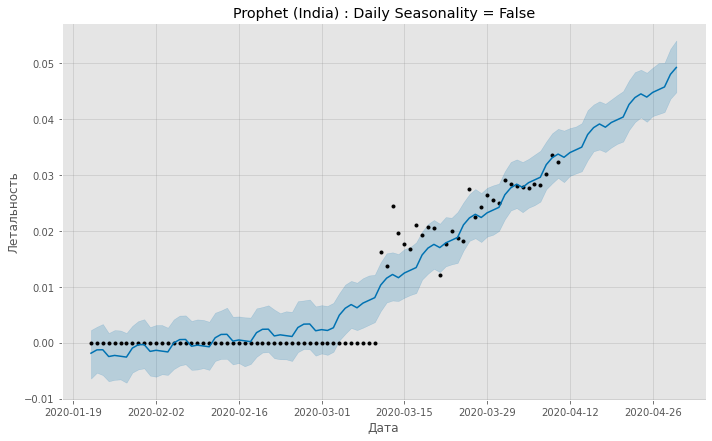

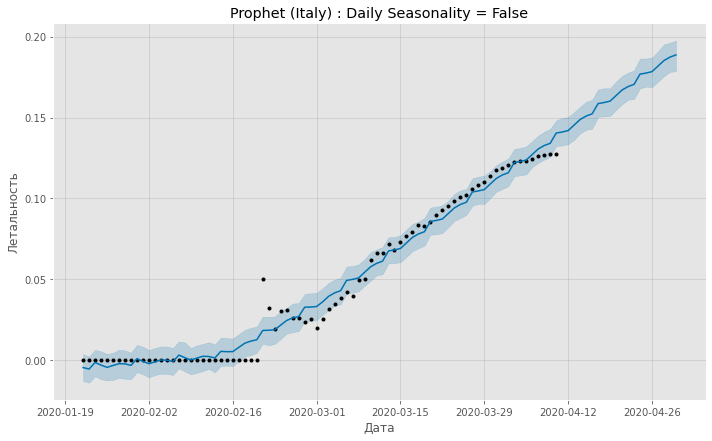

In [0]:
best = 1
for i in [True, False]:
  x = prophet(i)
  f1 = RMSE(x[0], df_USA_test.y)
  f2 = RMSE(x[1], df_India_test.y)
  f3 = RMSE(x[2], df_Italy_test.y)
  print(f1,f2,f3)
  f = f1+f2+f3
  if f < best:
    best = f
    best_RMSE = [f1,f2,f3,i]

In [0]:
df_Results.loc['Prophet (Daily Seasonality = %s)'%best_RMSE[3]] = best_RMSE[:3]
df_Results

,USA,India,Italy
Mean Model,0.03793017,0.02377128,0.08538953
Linear Trend Model,0.00970586,0.00381339,0.01443728
Exponential smoothing,0.00997212,0.00124188,0.00579224
Double exponential smoothing,0.00352799,0.00525723,0.01807121
Triple exponential smoothing,0.00260187,0.00458570,0.01521120
Moving Average (q=4),0.00419187,0.00349139,0.00722389
AutoRegressive (p=1),0.00506732,0.00335771,0.00696895
ARMA (p=6 q=6),0.00249671,0.00330891,0.00803839
ARIMA (p=4 d=1 q=1),0.00455890,0.00393932,0.01391211
"SARIMA (p=2 d=1 q=3, s=12, tr=ct)",0.00613345,0.00279040,0.00374992


#### 2.10 Линейная модель с регрессией (Linear Regression Model)

Какие признаки оказались наиболее значимыми?

In [0]:
df.rename(columns={'0to14years(%)':'f0to14', '15to64years(%)':'f15to64','over65years(%)':'over65', 'UrbanPopulation(%)':'UP', 'Beds(per1000)':'Beds', 'GDP(Million)':'GDP', 'AirTraffic(thousands)':'AT'}, inplace=True)
df[['f0to14','f15to64','over65','UP']] = df[['f0to14','f15to64','over65','UP']]/100
df.Date = pd.to_datetime(df.Date)

In [0]:
df_USA = df.loc[df['Country/Region'] == "US"].copy()
df_India = df.loc[df['Country/Region'] == "India"].copy()
df_Italy = df.loc[df['Country/Region'] == "Italy"].copy()

In [0]:
df_USA["timeIndex"] = ((df_USA.Date - df_USA.Date.min())/np.timedelta64(1, 'D')).round(0).astype(int)
df_India["timeIndex"] = ((df_India.Date - df_India.Date.min())/np.timedelta64(1, 'D')).round(0).astype(int)
df_Italy["timeIndex"] = ((df_Italy.Date - df_Italy.Date.min())/np.timedelta64(1, 'D')).round(0).astype(int)

In [0]:
df_USA_train = df_USA.iloc[:80, :].copy()
df_India_train = df_India.iloc[:80, :].copy()
df_Italy_train = df_Italy.iloc[:80, :].copy()
df_USA_test = df_USA.iloc[80:, :].copy()
df_India_test = df_India.iloc[80:, :].copy()
df_Italy_test = df_Italy.iloc[80:, :].copy()

In [0]:
linear_regr_USA = smfa.ols('Letal ~ np.log(Deaths+0.1)+np.log(Confirmed)+np.log(AT)+f15to64+Fertility_Rate+Median_Age+f0to14+np.log(GDP)+Beds+UP+over65+Days_after_first+timeIndex+np.log(Population)+Beds', data = df_USA_train).fit()
linear_regr_India = smfa.ols('Letal ~ np.log(Deaths+0.1)+np.log(Confirmed+0.1)+np.log(AT)+f15to64+Fertility_Rate+Median_Age+np.log(GDP)+f0to14+Beds+UP+over65+Days_after_first+timeIndex+np.log(Population)+Beds', data = df_India_train).fit()
linear_regr_Italy = smfa.ols('Letal ~ Deaths+Confirmed+Fertility_Rate+timeIndex+Days_after_first+np.log(GDP)+f0to14+f15to64+Median_Age+UP+Beds+np.log(Population)+np.log(AT)', data = df_Italy_train).fit()

In [0]:
linear_regr_USA.params

Intercept               0.00001897
np.log(Deaths + 0.1)    0.01311016
np.log(Confirmed)      -0.01918581
np.log(AT)              0.00039087
f15to64                 0.00001246
Fertility_Rate          0.00003414
Median_Age              0.00072083
f0to14                  0.00000359
np.log(GDP)             0.00032021
Beds                    0.00000417
UP                      0.00001574
over65                  0.00000292
Days_after_first        0.00073513
timeIndex               0.00073513
np.log(Population)      0.00037211
dtype: float64

In [0]:
linear_regr_India.params

Intercept                  0.00000509
np.log(Deaths + 0.1)       0.00420879
np.log(Confirmed + 0.1)   -0.00022395
np.log(AT)                 0.00009626
f15to64                    0.00000337
Fertility_Rate             0.00001120
Median_Age                 0.00014250
np.log(GDP)                0.00007579
f0to14                     0.00000141
Beds                       0.00000012
UP                         0.00000178
over65                     0.00000031
Days_after_first           0.00000389
timeIndex                  0.00004461
np.log(Population)         0.00010709
dtype: float64

In [0]:
linear_regr_Italy.params

Intercept            -0.00000229
Deaths               -0.00001119
Confirmed             0.00000184
Fertility_Rate       -0.00000298
timeIndex             0.00049695
Days_after_first      0.00051755
np.log(GDP)          -0.00003320
f0to14               -0.00000031
f15to64              -0.00000145
Median_Age           -0.00010758
UP                   -0.00000158
Beds                 -0.00000019
np.log(Population)   -0.00004101
np.log(AT)           -0.00003922
dtype: float64

In [0]:
linear_regr_pred_USA_global = linear_regr_USA.predict(exog=dict(timeIndex=df_USA.timeIndex, Confirmed=df_USA.Confirmed, Days_after_first=df_USA.Days_after_first, Beds=df_USA.Beds,
                                                                GDP=df_USA.GDP, AT=df_USA.AT,f0to14=df_USA.f0to14, f15to64=df_USA.f15to64, over65=df_USA.over65,
                                                                Fertility_Rate=df_USA.Fertility_Rate, Median_Age=df_USA.Median_Age, UP=df_USA.UP, Population=df_USA.Population,
                                                                Deaths=df_USA.Deaths, Recovered=df_USA.Recovered))
linear_regr_pred_India_global = linear_regr_India.predict(exog=dict(timeIndex=df_India.timeIndex, Confirmed=df_India.Confirmed, Days_after_first=df_India.Days_after_first, Beds=df_India.Beds,
                                                                GDP=df_India.GDP, AT=df_India.AT,f0to14=df_India.f0to14, f15to64=df_India.f15to64, over65=df_India.over65,
                                                                Fertility_Rate=df_India.Fertility_Rate, Median_Age=df_India.Median_Age, UP=df_India.UP, Population=df_India.Population,
                                                                Deaths=df_India.Deaths, Recovered=df_India.Recovered))
linear_regr_pred_Italy_global = linear_regr_Italy.predict(exog=dict(timeIndex=df_Italy.timeIndex, Confirmed=df_Italy.Confirmed, Days_after_first=df_Italy.Days_after_first, Beds=df_Italy.Beds,
                                                                GDP=df_Italy.GDP, AT=df_Italy.AT,f0to14=df_Italy.f0to14, f15to64=df_Italy.f15to64, over65=df_Italy.over65,
                                                                Fertility_Rate=df_Italy.Fertility_Rate, Median_Age=df_Italy.Median_Age, UP=df_Italy.UP, Population=df_Italy.Population,
                                                                Deaths=df_Italy.Deaths, Recovered=df_Italy.Recovered))

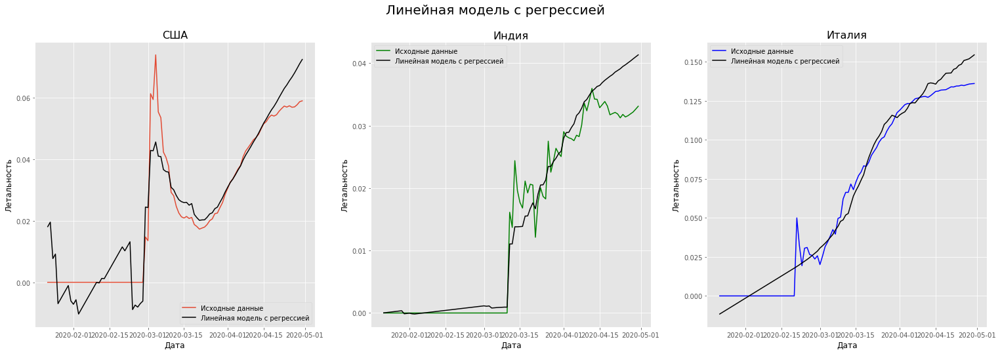

In [0]:
fig = plt.figure(figsize=(26,8))
fig.suptitle('Линейная модель с регрессией', fontsize=20);
ax1 = fig.add_subplot(131);
ax1.set_title('США', fontsize=16);
ax1.plot(df_USA.Date, df_USA.Letal);
ax1.plot(df_USA.Date, linear_regr_pred_USA_global, color = 'black')
ax1.set_xlabel('Дата', fontsize = 12, color='black');
ax1.set_ylabel('Летальность', fontsize = 12, color='black');
ax1.legend(['Исходные данные', 'Линейная модель с регрессией'])
ax2 = fig.add_subplot(132);
ax2.set_title('Индия', fontsize=16);
ax2.plot(df_India.Date, df_India.Letal, color = 'green');
ax2.plot(df_India.Date, linear_regr_pred_India_global, color = 'black')
ax2.set_xlabel('Дата', fontsize = 12, color='black');
ax2.set_ylabel('Летальность', fontsize = 12, color='black');
ax2.legend(['Исходные данные', 'Линейная модель с регрессией'])
ax3 = fig.add_subplot(133);
ax3.set_title('Италия', fontsize=16);
ax3.plot(df_Italy.Date, df_Italy.Letal, color = 'blue');
ax3.plot(df_Italy.Date, linear_regr_pred_Italy_global, color = 'black')
ax3.set_xlabel('Дата', fontsize = 12, color='black');
ax3.set_ylabel('Летальность', fontsize = 12, color='black');
ax3.legend(['Исходные данные', 'Линейная модель с регрессией']);

In [0]:
linear_regr_pred_USA = linear_regr_USA.predict(exog=dict(timeIndex=df_USA_test.timeIndex, Confirmed=df_USA_test.Confirmed, Days_after_first=df_USA_test.Days_after_first, Beds=df_USA_test.Beds,
                                                                GDP=df_USA_test.GDP, AT=df_USA_test.AT,f0to14=df_USA_test.f0to14, f15to64=df_USA_test.f15to64, over65=df_USA_test.over65,
                                                                Fertility_Rate=df_USA_test.Fertility_Rate, Median_Age=df_USA_test.Median_Age, UP=df_USA_test.UP,
                                                                Population=df_USA_test.Population, Deaths=df_USA_test.Deaths, Recovered=df_USA_test.Recovered))
linear_regr_pred_India = linear_regr_India.predict(exog=dict(timeIndex=df_India_test.timeIndex, Confirmed=df_India_test.Confirmed, Days_after_first=df_India_test.Days_after_first, Beds=df_India_test.Beds,
                                                                GDP=df_India_test.GDP, AT=df_India_test.AT,f0to14=df_India_test.f0to14, f15to64=df_India_test.f15to64, 
                                                                over65=df_India_test.over65, Fertility_Rate=df_India_test.Fertility_Rate, Median_Age=df_India_test.Median_Age, UP=df_India_test.UP, 
                                                                Population=df_India_test.Population, Deaths=df_India_test.Deaths, Recovered=df_India_test.Recovered))
linear_regr_pred_Italy =linear_regr_Italy.predict(exog=dict(timeIndex=df_Italy_test.timeIndex, Confirmed=df_Italy_test.Confirmed, Days_after_first=df_Italy_test.Days_after_first, Beds=df_Italy_test.Beds,
                                                                GDP=df_Italy_test.GDP, AT=df_Italy_test.AT,f0to14=df_Italy_test.f0to14, f15to64=df_Italy_test.f15to64, over65=df_Italy_test.over65,
                                                                Fertility_Rate=df_Italy_test.Fertility_Rate, Median_Age=df_Italy_test.Median_Age, UP=df_Italy_test.UP,
                                                                Population=df_Italy_test.Population, Deaths=df_Italy_test.Deaths, Recovered=df_Italy_test.Recovered))

In [0]:
df_Results.loc['Linear Regression Model'] = [RMSE(linear_regr_pred_USA, df_USA_test.Letal), RMSE(linear_regr_pred_India, df_India_test.Letal), RMSE(linear_regr_pred_Italy, df_Italy_test.Letal)]
df_Results

,USA,India,Italy
Mean Model,0.03793017,0.02377128,0.08538953
Linear Trend Model,0.00970586,0.00381339,0.01443728
Exponential smoothing,0.00997212,0.00124188,0.00579224
Double exponential smoothing,0.00352799,0.00525723,0.01807121
Triple exponential smoothing,0.00260187,0.00458570,0.01521120
Moving Average (q=4),0.00419187,0.00349139,0.00722389
AutoRegressive (p=1),0.00506732,0.00335771,0.00696895
ARMA (p=6 q=6),0.00249671,0.00330891,0.00803839
ARIMA (p=4 d=1 q=1),0.00455890,0.00393932,0.01391211
"SARIMA (p=2 d=1 q=3, s=12, tr=ct)",0.00613345,0.00279040,0.00374992


Во всех моделях лучшими из созданных признаков были: timeIndex, Days_after_first,  Median_Age, Population, AT(Air Traffic), GDP.

2.11 (Бонус) Используйте любую другую известную вам модель для предсказания.


Полиномиальная регрессия

Линейная регрессия - частный случай полиномиальной регрессии. Попробовал сделать вручную полиномиальную регрессию в ols. Написал ее здесь, т.к. не мог убрать ее (подбирал уравнения часа 2)

In [0]:
poly_regr_USA = smfa.ols('Letal ~ Deaths*np.sqrt(Confirmed)+np.sqrt(Recovered)*np.log(Confirmed)+np.log(AT)+f15to64+Fertility_Rate+Median_Age+f0to14+Beds+UP+over65+np.log(Confirmed)*Days_after_first+timeIndex*Days_after_first+np.log(Population)*Beds', data = df_USA_train).fit()
poly_regr_India = smfa.ols('Letal ~ Confirmed+np.log(Recovered+0.1)*np.log(Confirmed+0.1)+np.log(AT)+f15to64+Fertility_Rate+Median_Age+f0to14+Beds+UP+over65+np.log(Confirmed+0.1)*Days_after_first+timeIndex*Days_after_first+np.log(Population)*Beds', data = df_India_train).fit()
poly_regr_Italy = smfa.ols('Letal ~ Recovered*Fertility_Rate+timeIndex*Days_after_first+Confirmed*Days_after_first+np.log(GDP)+f0to14+f15to64+Median_Age+UP+Beds+np.log(Population)+np.log(AT)', data = df_Italy_train).fit()

In [0]:
poly_regr_pred_USA_global = poly_regr_USA.predict(exog=dict(timeIndex=df_USA.timeIndex, Confirmed=df_USA.Confirmed, Days_after_first=df_USA.Days_after_first, Beds=df_USA.Beds,
                                                                GDP=df_USA.GDP, AT=df_USA.AT,f0to14=df_USA.f0to14, f15to64=df_USA.f15to64, over65=df_USA.over65,
                                                                Fertility_Rate=df_USA.Fertility_Rate, Median_Age=df_USA.Median_Age, UP=df_USA.UP, Population=df_USA.Population,
                                                                Deaths=df_USA.Deaths, Recovered=df_USA.Recovered))
poly_regr_pred_India_global = poly_regr_India.predict(exog=dict(timeIndex=df_India.timeIndex, Confirmed=df_India.Confirmed, Days_after_first=df_India.Days_after_first, Beds=df_India.Beds,
                                                                GDP=df_India.GDP, AT=df_India.AT,f0to14=df_India.f0to14, f15to64=df_India.f15to64, over65=df_India.over65,
                                                                Fertility_Rate=df_India.Fertility_Rate, Median_Age=df_India.Median_Age, UP=df_India.UP, Population=df_India.Population,
                                                                Deaths=df_India.Deaths, Recovered=df_India.Recovered))
poly_regr_pred_Italy_global = poly_regr_Italy.predict(exog=dict(timeIndex=df_Italy.timeIndex, Confirmed=df_Italy.Confirmed, Days_after_first=df_Italy.Days_after_first, Beds=df_Italy.Beds,
                                                                GDP=df_Italy.GDP, AT=df_Italy.AT,f0to14=df_Italy.f0to14, f15to64=df_Italy.f15to64, over65=df_Italy.over65,
                                                                Fertility_Rate=df_Italy.Fertility_Rate, Median_Age=df_Italy.Median_Age, UP=df_Italy.UP, Population=df_Italy.Population,
                                                                Deaths=df_Italy.Deaths, Recovered=df_Italy.Recovered))

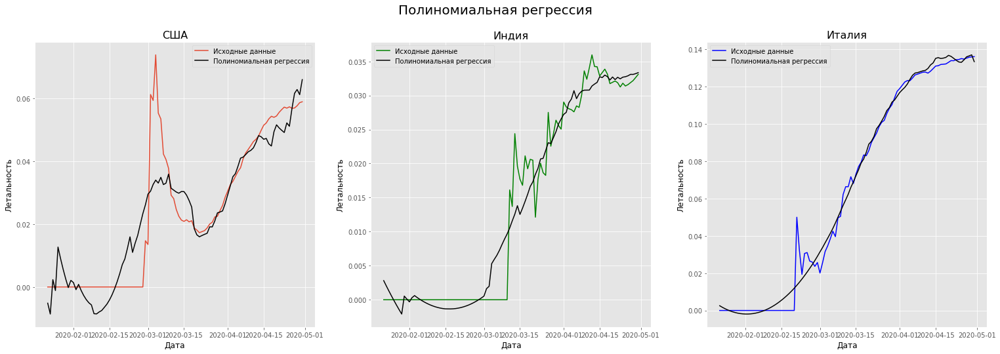

In [0]:
fig = plt.figure(figsize=(26,8))
fig.suptitle('Полиномиальная регрессия', fontsize=20);
ax1 = fig.add_subplot(131);
ax1.set_title('США', fontsize=16);
ax1.plot(df_USA.Date, df_USA.Letal);
ax1.plot(df_USA.Date, poly_regr_pred_USA_global, color = 'black')
ax1.set_xlabel('Дата', fontsize = 12, color='black');
ax1.set_ylabel('Летальность', fontsize = 12, color='black');
ax1.legend(['Исходные данные', 'Полиномиальная регрессия'])
ax2 = fig.add_subplot(132);
ax2.set_title('Индия', fontsize=16);
ax2.plot(df_India.Date, df_India.Letal, color = 'green');
ax2.plot(df_India.Date, poly_regr_pred_India_global, color = 'black')
ax2.set_xlabel('Дата', fontsize = 12, color='black');
ax2.set_ylabel('Летальность', fontsize = 12, color='black');
ax2.legend(['Исходные данные', 'Полиномиальная регрессия'])
ax3 = fig.add_subplot(133);
ax3.set_title('Италия', fontsize=16);
ax3.plot(df_Italy.Date, df_Italy.Letal, color = 'blue');
ax3.plot(df_Italy.Date, poly_regr_pred_Italy_global, color = 'black')
ax3.set_xlabel('Дата', fontsize = 12, color='black');
ax3.set_ylabel('Летальность', fontsize = 12, color='black');
ax3.legend(['Исходные данные', 'Полиномиальная регрессия']);

In [0]:
poly_regr_pred_USA = poly_regr_USA.predict(exog=dict(timeIndex=df_USA_test.timeIndex, Confirmed=df_USA_test.Confirmed, Days_after_first=df_USA_test.Days_after_first, Beds=df_USA_test.Beds,
                                                                GDP=df_USA_test.GDP, AT=df_USA_test.AT,f0to14=df_USA_test.f0to14, f15to64=df_USA_test.f15to64, over65=df_USA_test.over65,
                                                                Fertility_Rate=df_USA_test.Fertility_Rate, Median_Age=df_USA_test.Median_Age, UP=df_USA_test.UP,
                                                                Population=df_USA_test.Population, Deaths=df_USA_test.Deaths, Recovered=df_USA_test.Recovered))
poly_regr_pred_India = poly_regr_India.predict(exog=dict(timeIndex=df_India_test.timeIndex, Confirmed=df_India_test.Confirmed, Days_after_first=df_India_test.Days_after_first, Beds=df_India_test.Beds,
                                                                GDP=df_India_test.GDP, AT=df_India_test.AT,f0to14=df_India_test.f0to14, f15to64=df_India_test.f15to64, 
                                                                over65=df_India_test.over65, Fertility_Rate=df_India_test.Fertility_Rate, Median_Age=df_India_test.Median_Age, UP=df_India_test.UP, 
                                                                Population=df_India_test.Population, Deaths=df_India_test.Deaths, Recovered=df_India_test.Recovered))
poly_regr_pred_Italy =poly_regr_Italy.predict(exog=dict(timeIndex=df_Italy_test.timeIndex, Confirmed=df_Italy_test.Confirmed, Days_after_first=df_Italy_test.Days_after_first, Beds=df_Italy_test.Beds,
                                                                GDP=df_Italy_test.GDP, AT=df_Italy_test.AT,f0to14=df_Italy_test.f0to14, f15to64=df_Italy_test.f15to64, over65=df_Italy_test.over65,
                                                                Fertility_Rate=df_Italy_test.Fertility_Rate, Median_Age=df_Italy_test.Median_Age, UP=df_Italy_test.UP,
                                                                Population=df_Italy_test.Population, Deaths=df_Italy_test.Deaths, Recovered=df_Italy_test.Recovered))

In [0]:
df_Results.loc['Polinomial Regression Model (handmade, bonus)'] = [RMSE(poly_regr_pred_USA, df_USA_test.Letal), RMSE(poly_regr_pred_India, df_India_test.Letal), RMSE(poly_regr_pred_Italy, df_Italy_test.Letal)]
df_Results

,USA,India,Italy
Mean Model,0.03793017,0.02377128,0.08538953
Linear Trend Model,0.00970586,0.00381339,0.01443728
Exponential smoothing,0.00997212,0.00124188,0.00579224
Double exponential smoothing,0.00352799,0.00525723,0.01807121
Triple exponential smoothing,0.00260187,0.00458570,0.01521120
Moving Average (q=4),0.00419187,0.00349139,0.00722389
AutoRegressive (p=1),0.00506732,0.00335771,0.00696895
ARMA (p=6 q=6),0.00249671,0.00330891,0.00803839
ARIMA (p=4 d=1 q=1),0.00455890,0.00393932,0.01391211
"SARIMA (p=2 d=1 q=3, s=12, tr=ct)",0.00613345,0.00279040,0.00374992


#### 2.11 Выводы

Выбор лучших моделей зависит от конкретной страны. В итоге, лучшими моделями (по RMSE на тесте) для США стали Triple Exponential Smoothing и ARMA (p=6, q=6), для Индии-Single Exponential Smoothing и Polinomial Regression, для Италии- Single Exponential Smoothing, SARIMA(p=2 d=1 q=3, s=12, tr=ct) и Polinomial Regression.

В этой части домашнего задания я ознакомился с основными моделями для прогнозирования временных рядов, попробовал использовать библиотку Prophet от Facebook. Также я узнал об особенностях разных моделей (от параметров до требования стационарности) и сравнил результаты их работы на трех временных рядах по метрике RMSE.

## Выводы по работе
В этом домашнем задании я изучил распространение коронавируса в мире, посмотрев на динамику вируса по странам, континентам. Я проанализировал развитие вируса в странах с самыми большими числовыми показателями(подтвержденные, погибшие,выздоровевшие), попытался найти сходства и различия в поведении вируса в этих регионах. Также я попытался найти признаки, коррелирующие с основными атрибутами вируса. Далее с помощью разных моделей я пытался спрогнозировать изменения летальности в США, Индии, Италии. Кажется, что данных еще мало - промежуток времени примерно 3 месяца, о сезонности говорить не приходится(на самом деле это хорошо, но с точки зрения предсказаний - не очень). В конце работы мне необходимо было сравнить модели ( как они справились с такими временными рядами).